# Angle Recovery with Perfect Distances

In this phase we will try to do angle recovery assuming we know the prefect distances.

The optimization equation looks like this:
\begin{equation}
\label{eq:phase1}
{\{\hat{q_i}\}_{i=1}^N} = \operatorname*{arg\,min}_{\{\hat{q}_i\}_{i=1}^N} \sum_{i,j} \left| d_q(q_i, q_j) - d_q(\hat{q_i}, \hat{q_j}) \right|^2
\end{equation}

We start by random uniform distribution of angle triplets corresponding to the quaternion values $\hat{q_i}$ and $\hat{q_j}$ and we want to see if during the optimization we manage to estimate the true quaternions $q_i$ and $q_j$.


## Content

1. **5A1A** - symmetric protein:  
1.1. [Experiments Summary](#1.1.-Experiment-Summary)  
1.2. [Data Preparation](#1.2.-Data-Preparation)    
1.3. [Experiments with Different Noise Variance on Perfect Distances](#1.3.-Experimetns)  
1.3.1. [Angle Recovery with Perfect Distances](#1.3.1.-Angle-Recovery:-Perfect-Distance)   
1.3.2. [Angle Recovery with Perfect Distances and Variance 0.0](#1.3.2.-Angle-Recovery:-Variance-0.0)  
1.3.3. [Angle Recovery with Perfect Distances and Variance 0.1](#1.3.3.-Angle-Recovery:-Variance-0.1)  
1.3.4. [Angle Recovery with Perfect Distances and Variance 0.2](#1.3.4.-Angle-Recovery:-Variance-0.2)  
1.3.5. [Angle Recovery with Perfect Distances and Variance 0.3](#1.3.5.-Angle-Recovery:-Variance-0.3)   
1.3.6. [Angle Recovery with Perfect Distances and Variance 0.4](#1.3.6.-Angle-Recovery:-Variance-0.4)    
1.3.7. [Angle Recovery with Perfect Distances and Variance 0.5](#1.3.7.-Angle-Recovery:-Variance-0.5)   
1.3.8. [Angle Recovery with Perfect Distances and Variance 0.6](#1.3.8.-Angle-Recovery:-Variance-0.6)   
1.3.9. [Angle Recovery with Perfect Distances and Variance 0.7](#1.3.9.-Angle-Recovery:-Variance-0.7)    
1.3.10. [Angle Recovery with Perfect Distances and Variance 0.8](#1.3.10.-Angle-Recovery:-Variance-0.8)   


2. **5J0N** - asymmetric protein:  
2.1. [Experiments Summary](#2.1.-Experiment-Summary)  
2.2. [Data Preparation](#2.2.-Data-Preparation)    
2.3. [Experiments with Different Noise Variance on Perfect Distances](#2.3.-Experimetns)  
2.3.1. [Angle Recovery with Perfect Distances](#2.3.1.-Angle-Recovery:-Perfect-Distance)   
2.3.2. [Angle Recovery with Perfect Distances and Variance 0.0](#2.3.2.-Angle-Recovery:-Variance-0.0)  
2.3.3. [Angle Recovery with Perfect Distances and Variance 0.1](#2.3.3.-Angle-Recovery:-Variance-0.1)  
2.3.4. [Angle Recovery with Perfect Distances and Variance 0.2](#2.3.4.-Angle-Recovery:-Variance-0.2)  
2.3.5. [Angle Recovery with Perfect Distances and Variance 0.3](#2.3.5.-Angle-Recovery:-Variance-0.3)   
2.3.6. [Angle Recovery with Perfect Distances and Variance 0.4](#2.3.6.-Angle-Recovery:-Variance-0.4)    
2.3.7. [Angle Recovery with Perfect Distances and Variance 0.5](#2.3.7.-Angle-Recovery:-Variance-0.5)   
2.3.8. [Angle Recovery with Perfect Distances and Variance 0.6](#2.3.8.-Angle-Recovery:-Variance-0.6)   
2.3.9. [Angle Recovery with Perfect Distances and Variance 0.7](#2.3.9.-Angle-Recovery:-Variance-0.7)    
2.3.10. [Angle Recovery with Perfect Distances and Variance 0.8](#2.3.10.-Angle-Recovery:-Variance-0.8)   

In [1]:
from numba import cuda
cuda.select_device(0)
cuda.close()

In [2]:
import os
import h5py
import numpy as np
from IPython.display import Image
import ipyvolume as ipv
import tensorflow as tf

import sys
sys.path.append("../..") 
from cryoem.plots import (plot_angles_count, plot_euclidean_space, save_space_plot,
                        plot_selected_angles_with_3rd_angle_magnitude, 
                        plot_dP_dQ,plot_only_selected_in_euclidean_space, 
                        plot_rays, plot_images, plot_angles_with_3rd_angle_magnitude, plot_distances_count)
from cryoem.conversions import d_q, quaternion2euler, euler2quaternion, distance_difference
from cryoem.angle_alignment import training_angle_alignment,update_quaternion
from cryoem.angle_recovery import train_angle_recovery
import seaborn as sns; sns.set(style="white", color_codes=True)
import matplotlib.pyplot as plt

In [3]:
from tensorflow.python.client import device_lib 
print(device_lib.list_local_devices())

[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 7585464507231598090
, name: "/device:XLA_CPU:0"
device_type: "XLA_CPU"
memory_limit: 17179869184
locality {
}
incarnation: 7445645921068879484
physical_device_desc: "device: XLA_CPU device"
, name: "/device:XLA_GPU:0"
device_type: "XLA_GPU"
memory_limit: 17179869184
locality {
}
incarnation: 17805755191599997083
physical_device_desc: "device: XLA_GPU device"
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 10949338727
locality {
  bus_id: 2
  numa_node: 1
  links {
  }
}
incarnation: 8444852138728913883
physical_device_desc: "device: 0, name: Tesla K40c, pci bus id: 0000:da:00.0, compute capability: 3.5"
]


In [4]:
# gpus = tf.config.experimental.list_physical_devices('GPU')
# if gpus:
#   # Restrict TensorFlow to only use the first GPU
#   try:
#     tf.config.experimental.set_visible_devices(gpus[0], 'GPU')
#     logical_gpus = tf.config.experimental.list_logical_devices('GPU')
#     print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPU")
# except RuntimeError as e:
#     # Visible devices must be set before GPUs have been initialized
#     print(e)

In [5]:
# gpus

In [6]:
# logical_gpus

---

## 1. Symmetric Protein (5A1A)

Data used:
- Protein: 5a1a (symmetric protein)
- Projections: 5K
- Coverage: Half-sphere

![](figures/5a1a.pdb1-500.jpg)

---

# 1.1. Experiment Summary

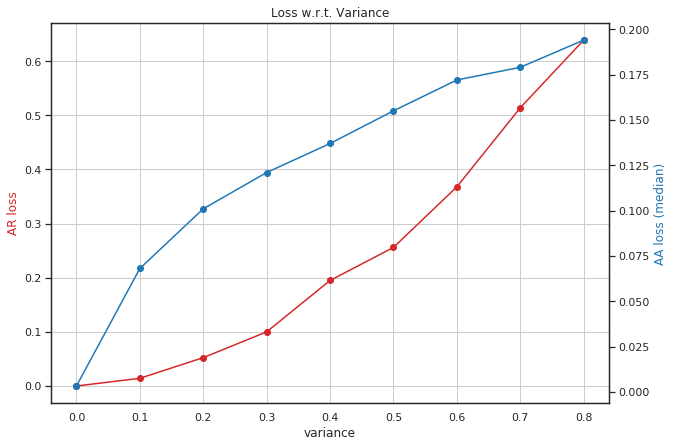

In [7]:
# losses
variances = [0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8]
losses = np.array([1.42e-08, 1.42e-02, 5.24e-02, 1.00e-01, 1.95e-01, 2.56e-01, 3.68e-01, 5.14e-01, 6.39e-01])
# mean
#aa_losses = np.array([2.49e-03, 7.23e-02, 1.06e-01, 1.26e-01, 1.45e-01, 1.62e-01, 1.80e-01, 1.88e-01, 2.04e-1])
# median
aa_losses = np.array([3.33e-03, 6.81e-02, 1.01e-01, 1.21e-01, 1.37e-01, 1.55e-01, 1.72e-01, 1.79e-01, 1.94e-01])

fig, ax = plt.subplots(1, 1, figsize=(10,7))
ax.plot(variances, losses, marker="o", color='tab:red')
ax.set(xlabel='variance', title='Loss w.r.t. Variance')
ax.set_ylabel(f'AR loss', color='tab:red')
ax.grid()

ax2 = ax.twinx()
ax2.plot(variances, aa_losses, marker="o", color='tab:blue')
ax2.set_ylabel(f'AA loss (median)', color='tab:blue')

#fig.savefig("test.png")
plt.show()

# 1.2. Data Preparation

In [7]:
PROTEIN="5a1a"
ROOT_DIR = "../.."
NUM_PROJECTIONS = 5000

# location of *.h5 files
#data_dir = f"{ROOT_DIR}/data"
data_dir = "/mnt/scratch/students/"#f"{ROOT_DIR}/data"

# half coverage (AngCoverage=0.5)
projections_filename = f"{PROTEIN}_ProjectionsAngles_ProjNber5000_AngCoverage2.0,0.4,2.0_AngShift0.0,0.0,0.0.h5"

# load structures
data = h5py.File(os.path.join(data_dir, projections_filename), 'r')

print(f"{data['Projections'].shape[0]} projections of images with dimension {data['Projections'].shape[1:]} pixels")
print(f"{data['Angles'].shape[0]} sets of {data['Angles'].shape[1]} ground truth angles of corresponding projection images")

5000 projections of images with dimension (275, 275) pixels
5000 sets of 3 ground truth angles of corresponding projection images


#### Projections

In [8]:
projections = data['Projections']

#### True Angles

(5000, 3)


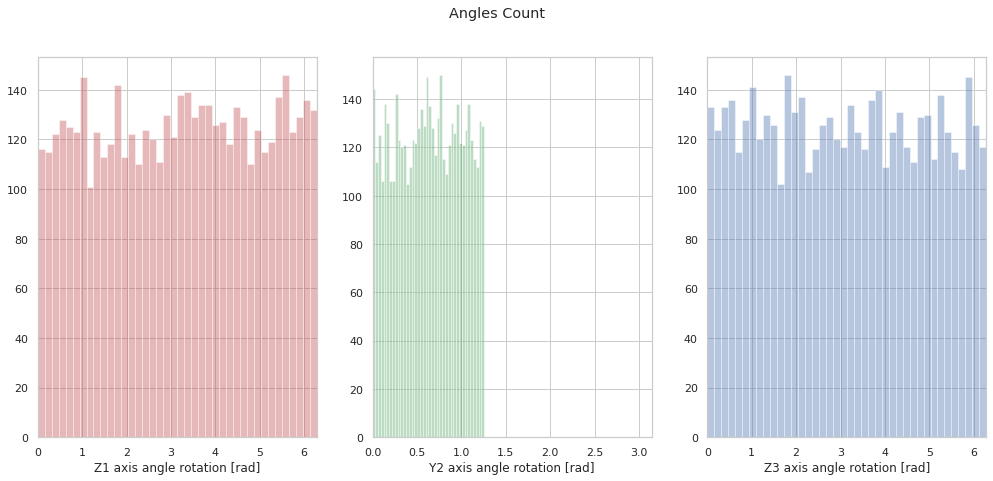

In [9]:
angles_true = np.array(data['Angles'])
print(angles_true.shape)
plot_angles_count(angles_true)

---

# 1.3. Experiments

## 1.3.1. Angle Recovery: Perfect Distance

#### dP/dQ plot

In [10]:
def d_p(in1, in2):
    return d_q(in1, in2)

In [11]:
idx1 = list(np.random.choice(range(NUM_PROJECTIONS), size=1000))
idx2 = list(np.random.choice(range(NUM_PROJECTIONS), size=1000))

q1_true = euler2quaternion([angles_true[i] for i in idx1])
q2_true = euler2quaternion([angles_true[i] for i in idx2])

dP_values = d_p(q1_true, q2_true)
dQ_values = d_q(q1_true, q2_true)

<Figure size 432x288 with 0 Axes>

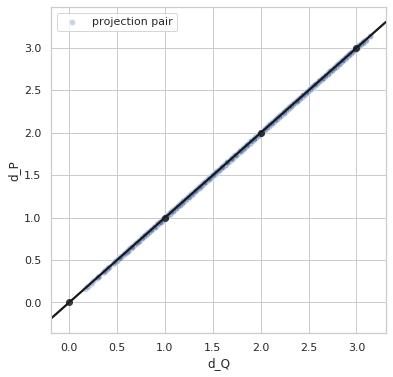

<Figure size 432x288 with 0 Axes>

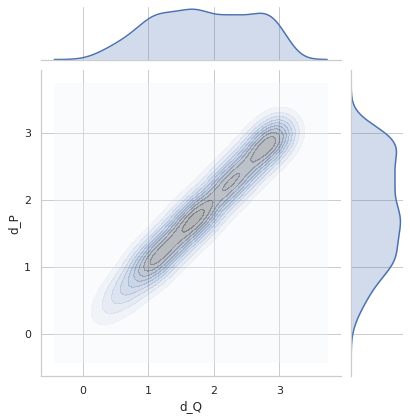

Variance = 0.0
Min. angle recovery loss possible = 0.0


In [13]:
plot_dP_dQ(dP_values, dQ_values);

In [14]:
# variance
np.sqrt(1/(len(dQ_values)-1)*np.sum(np.power(dP_values-dQ_values, 2)))

0.0

#### Angle Recovery

In [17]:
data = np.load(f"data/5j0n_siamese_idx.npz")
train_idx, val_idx, test_idx = data["arr_0"], data["arr_1"], data["arr_2"]

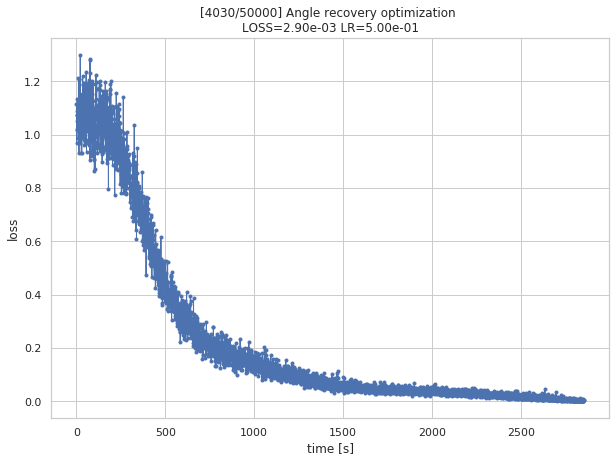

In [ ]:
q_predicted, losses, q_all = train_angle_recovery(steps=50000, 
                             batch_size=256, 
                             in_data=angles_true[test_idx], 
                             distance_fn=d_p, 
                             learning_rate=0.5, 
                             limit_distance=np.pi,
                             high_ang_const=[2.0, 0.4, 2.0],
                             file_name="/mnt/scratch/students/angle_recovery_5a1a_perfect")

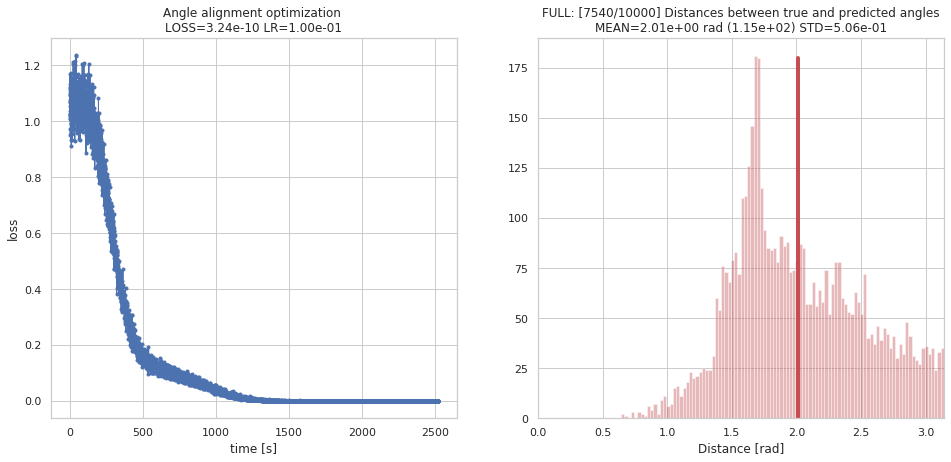

step 1000/10000 (362s): loss = 4.56e-01
step 2000/10000 (690s): loss = 1.17e-01
step 3000/10000 (1017s): loss = 3.05e-02
step 4000/10000 (1346s): loss = 2.25e-03
step 5000/10000 (1678s): loss = 2.96e-05
step 6000/10000 (2008s): loss = 1.82e-07
step 7000/10000 (2341s): loss = 2.06e-09



In [13]:
losses, q_predicted, arrp = train_angle_recovery(steps=10000, 
                                 batch_size=512, 
                                 projection_idx=range(NUM_PROJECTIONS), 
                                 in_data=angles_true, 
                                 distance_fn=d_p, 
                                 learning_rate=0.1, 
                                 optimization=True)

In [25]:
arrp.shape

(754, 5000)

In [33]:
from scipy.spatial.transform import Rotation as R
res = []
for iteration in arrp:
    a = np.zeros((len(angles_true), 3))
    for i, e in enumerate(iteration):
        a[i] = R.from_quat(e.numpy()).as_rotvec()
    res.append(a)
arr = np.array(res)

In [34]:
from scipy.spatial.transform import Rotation as R

arr2 = R.from_euler('zyz', angles_true).as_rotvec()

ipv.figure()
s = ipv.scatter(arr[:, :,0], arr[:, :,1], arr[:, :,2], marker="sphere", color="blue", size=1)
ipv.scatter(arr2[:,0], arr2[:,1], arr2[:,2], marker="sphere", color="red", size=1)
ipv.animation_control(s, interval=200)
ipv.show()

In [27]:
q_save = np.zeros((len(q_predicted),4))
for i, q in enumerate(q_predicted):
    q_save[i] = q.numpy()
                    
np.save("data/5a1a/predicted_quaternions.npy2", q_save)

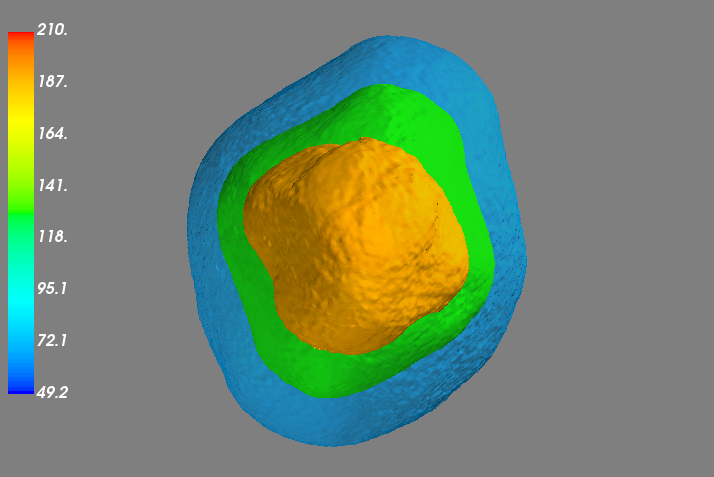

In [55]:
Image(filename='../3-reconstruction/data/5a1a_projections_and_angles_predicted.png')

## Angle Alignment

In [55]:
def angles_transpose(angles):
    angles[:,[0, 2]] = angles[:,[2, 0]]
    angles *= -1
    return angles

In [56]:
qp = np.load("data/5a1a/predicted_quaternions2.npy")

transposed = False
ap = quaternion2euler(qp)
ap = angles_transpose(ap.numpy())

np.save("data/5a1a/predicted_angles.npy", ap)

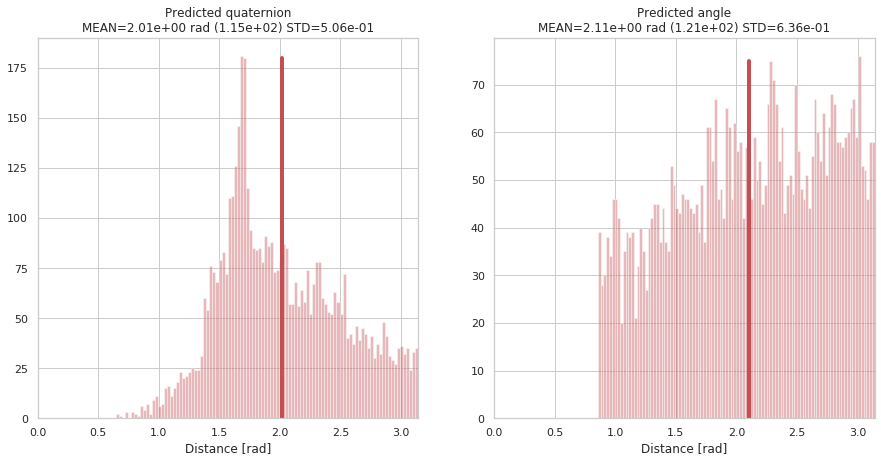

In [57]:
# check: both plots should be the same (if transposed=False)
fig, axs = plt.subplots(1, 2, figsize=(15,7))
d2 = d_q(euler2quaternion(angles_true), qp)
axs[0].set_xlim(0, np.pi)
axs[0].set_title(f"Predicted quaternion\nMEAN={np.mean(d2):.2e} rad ({np.degrees(np.mean(d2)):.2e}) STD={np.std(d2):.2e}")
s = sns.distplot(d2, kde=False, bins=100, ax=axs[0], axlabel="Distance [rad]", color="r")
max_count = int(max([h.get_height() for h in s.patches]))
axs[0].plot([np.mean(d2)]*max_count, np.arange(0, max_count,1), c="r", lw=4)

d3 = d_q(euler2quaternion(angles_true), euler2quaternion(ap))
axs[1].set_xlim(0, np.pi)
axs[1].set_title(f"Predicted angle\nMEAN={np.mean(d3):.2e} rad ({np.degrees(np.mean(d3)):.2e}) STD={np.std(d3):.2e}")
s = sns.distplot(d3, kde=False, bins=100, ax=axs[1], axlabel="Distance [rad]", color="r")
max_count = int(max([h.get_height() for h in s.patches]))
axs[1].plot([np.mean(d3)]*max_count, np.arange(0, max_count,1), c="r", lw=4)

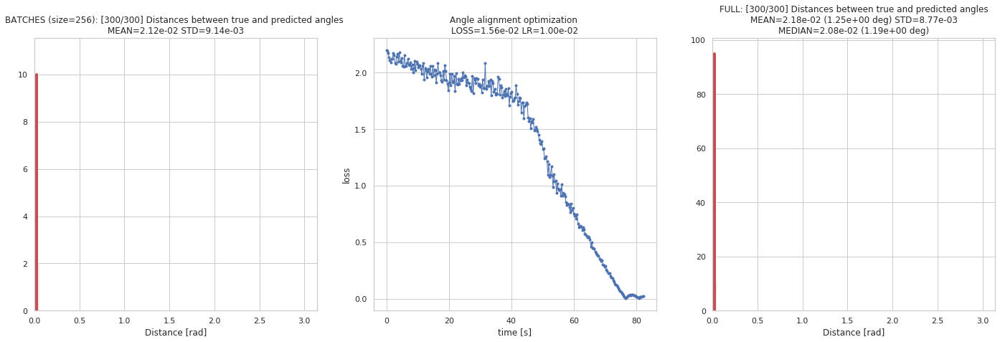

step 30/300 (9s): loss = 2.12e+00
step 60/300 (17s): loss = 2.03e+00
step 90/300 (26s): loss = 1.95e+00
step 120/300 (34s): loss = 1.91e+00
step 150/300 (43s): loss = 1.84e+00
step 180/300 (51s): loss = 1.64e+00
step 210/300 (59s): loss = 1.09e+00
step 240/300 (67s): loss = 6.75e-01
step 270/300 (76s): loss = 2.86e-01
step 300/300 (84s): loss = 3.07e-02



In [66]:
m, rotation, loss, arr = training_angle_alignment(m=[1.0, 1.0, 1.0, 1.0],
                                             steps=300, 
                                             batch_size=256, 
                                             projection_idx=range(NUM_PROJECTIONS), 
                                             learning_rate=0.01, 
                                             angles_true=angles_true, 
                                             angles_predicted=ap)

In [67]:
m, rotation[0].numpy(), loss[-1]

([1.0, 1.0, 1.0, 1.0],
 array([7.75002656, 0.3007453 , 6.15445275, 0.98073965, 3.15953732,
        5.46325849]),
 0.02073006861499844)

In [68]:
arr = np.array(arr)

In [69]:
from scipy.spatial.transform import Rotation as R

arr2 = R.from_euler('zyz', angles_true).as_rotvec()

ipv.figure()
s = ipv.scatter(arr[:, :,0], arr[:, :,1], arr[:, :,2], marker="sphere", color="blue", size=1)
ipv.scatter(arr2[:,0], arr2[:,1], arr2[:,2], marker="sphere", color="red", size=1)
ipv.animation_control(s, interval=200)
ipv.show()

In [50]:
qpn = euler2quaternion(ap)

qpa = update_quaternion(m=m, 
                        a_R=rotation, 
                        q_predicted=qpn)

angles_predicted = quaternion2euler(qpa).numpy()

np.save("data/5a1a/predicted_angles_updated.npy", angles_predicted)

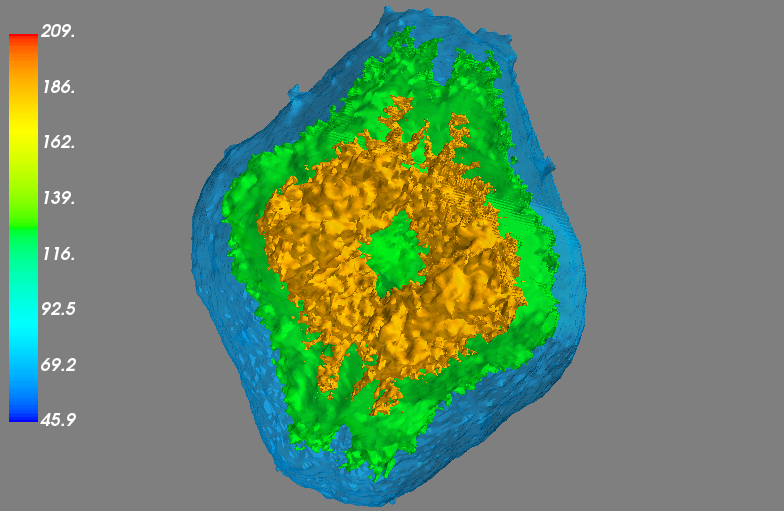

In [54]:
Image(filename='../3-reconstruction/data/5a1a_projections_and_angles_predicted_updated.png')

---

## 1.3.2. Angle Recovery: Variance 0.0

#### dP/dQ plot

In [7]:
def d_p(in1, in2):
    dist = d_q(in1, in2)
    norm_distr = tf.random.normal(shape=dist.shape, mean=dist, stddev=0.0, dtype=tf.float64)
    return norm_distr  

In [8]:
idx1 = list(np.random.choice(range(NUM_PROJECTIONS), size=5000))
idx2 = list(np.random.choice(range(NUM_PROJECTIONS), size=5000))

q1_true = euler2quaternion([angles_true[i] for i in idx1])
q2_true = euler2quaternion([angles_true[i] for i in idx2])

dP_values = d_p(q1_true, q2_true)#.T[0]
dQ_values = d_q(q1_true, q2_true)#.numpy()

<Figure size 432x288 with 0 Axes>

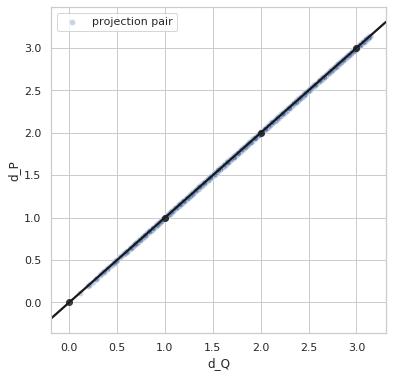

<Figure size 432x288 with 0 Axes>

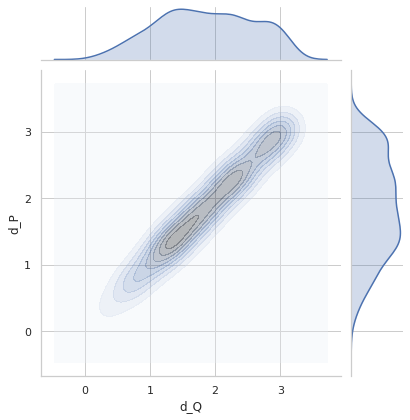

In [12]:
plot_dP_dQ(dP_values, dQ_values);
plot_dP_dQ_density(dP_values, dQ_values);

## Angle Recovery

Perfect distances. Learning rate 0.01

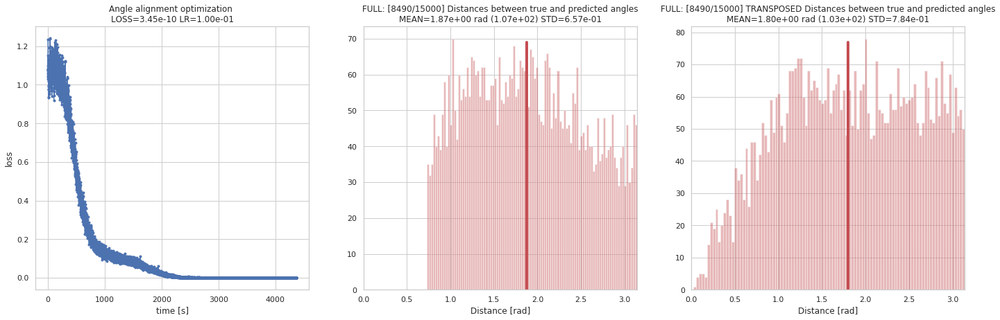

step 1500/15000 (729s): loss = 2.35e-01
step 3000/15000 (1468s): loss = 8.05e-02
step 4500/15000 (2239s): loss = 2.33e-03
step 6000/15000 (3033s): loss = 1.49e-05
step 7500/15000 (3833s): loss = 1.42e-08



In [15]:
q_predicted = train_angle_recovery(steps=15000, 
                                 batch_size=512, 
                                 projection_idx=range(NUM_PROJECTIONS), 
                                 in_data=angles_true, 
                                 distance_fn=d_p, 
                                 learning_rate=0.1, 
                                 optimization=True)

In [16]:
q_save = np.zeros((len(q_predicted),4))
for i, q in enumerate(q_predicted):
    q_save[i] = q.numpy()
                    
np.save("data/5a1a/predicted_quaternions_var0.0.npy", q_save)

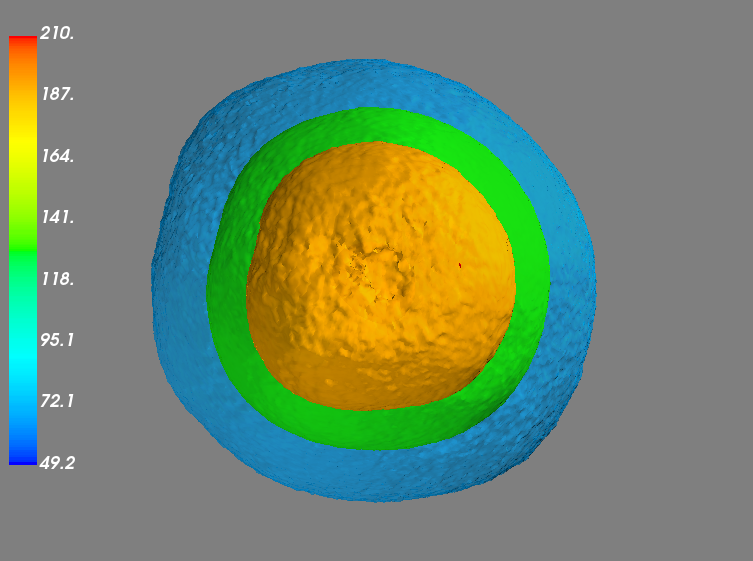

In [13]:
Image(filename='../3-reconstruction/data/5a1a_projections_and_angles_predicted_var00.png')

## Angle Alignment

In [14]:
# NO TRANSPOSITION - left plot = not transposed, right plot = transposed
qp = np.load("data/5a1a/predicted_quaternions_var0.0.npy")

transposed = False
ap = quaternion2euler(qp, transposed=transposed)

np.save("data/5a1a/predicted_angles_var00.npy", ap)

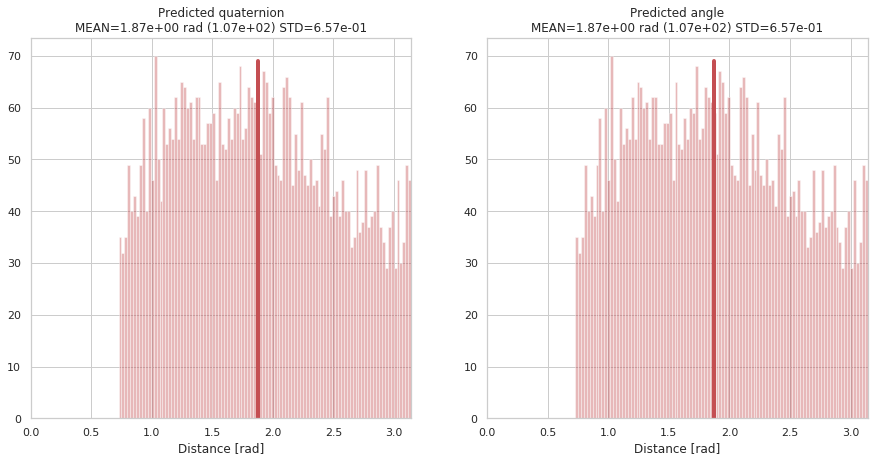

In [15]:
# check: both plots should be the same (if transposed=False)
fig, axs = plt.subplots(1, 2, figsize=(15,7))
d2 = d_q(euler2quaternion(angles_true), qp)
axs[0].set_xlim(0, np.pi)
axs[0].set_title(f"Predicted quaternion\nMEAN={np.mean(d2):.2e} rad ({np.degrees(np.mean(d2)):.2e}) STD={np.std(d2):.2e}")
s = sns.distplot(d2, kde=False, bins=100, ax=axs[0], axlabel="Distance [rad]", color="r")
max_count = int(max([h.get_height() for h in s.patches]))
axs[0].plot([np.mean(d2)]*max_count, np.arange(0, max_count,1), c="r", lw=4)

d3 = d_q(euler2quaternion(angles_true), euler2quaternion(ap))
axs[1].set_xlim(0, np.pi)
axs[1].set_title(f"Predicted angle\nMEAN={np.mean(d3):.2e} rad ({np.degrees(np.mean(d3)):.2e}) STD={np.std(d3):.2e}")
s = sns.distplot(d3, kde=False, bins=100, ax=axs[1], axlabel="Distance [rad]", color="r")
max_count = int(max([h.get_height() for h in s.patches]))
axs[1].plot([np.mean(d3)]*max_count, np.arange(0, max_count,1), c="r", lw=4)

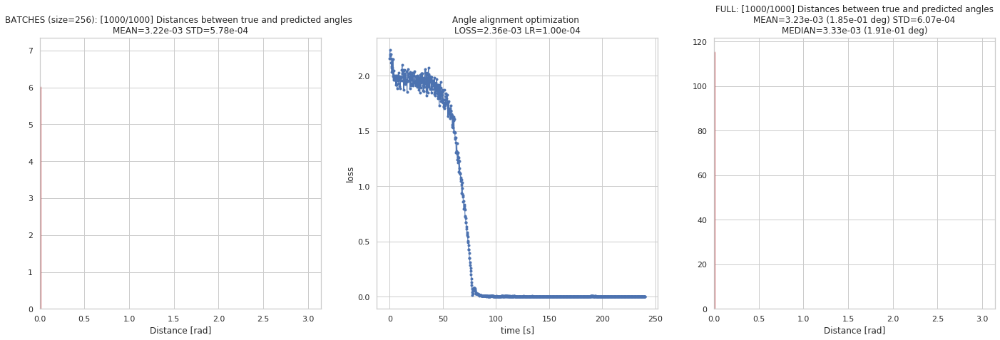

step 100/1000 (24s): loss = 2.00e+00
step 200/1000 (48s): loss = 1.93e+00
step 300/1000 (72s): loss = 1.43e+00
step 400/1000 (96s): loss = 1.03e-01
step 500/1000 (120s): loss = 3.94e-03
step 600/1000 (144s): loss = 3.34e-03
step 700/1000 (168s): loss = 2.95e-03
step 800/1000 (192s): loss = 2.91e-03
step 900/1000 (217s): loss = 2.52e-03
step 1000/1000 (242s): loss = 2.49e-03



In [20]:
m, rotation, loss = training_angle_alignment(m=[1.0, 1.0, 1.0, 1.0],
                                             steps=1000, 
                                             batch_size=256, 
                                             projection_idx=range(NUM_PROJECTIONS), 
                                             learning_rate=0.01, 
                                             angles_true=angles_true, 
                                             angles_predicted=ap)

In [21]:
m, rotation[0].numpy(), loss

([1.0, 1.0, 1.0, 1.0],
 array([2.31832947, 3.36625992, 6.2550904 , 3.73997961, 5.46508477,
        3.88123339]),
 0.0025027926118142583)

In [24]:
qpn = euler2quaternion(ap)

qpa = update_quaternion(m=m, 
                        a_R=rotation, 
                        q_predicted=qpn)

angles_predicted = quaternion2euler(qpa).numpy()

np.save("data/5a1a/predicted_angles_var00_updated.npy", angles_predicted)

True


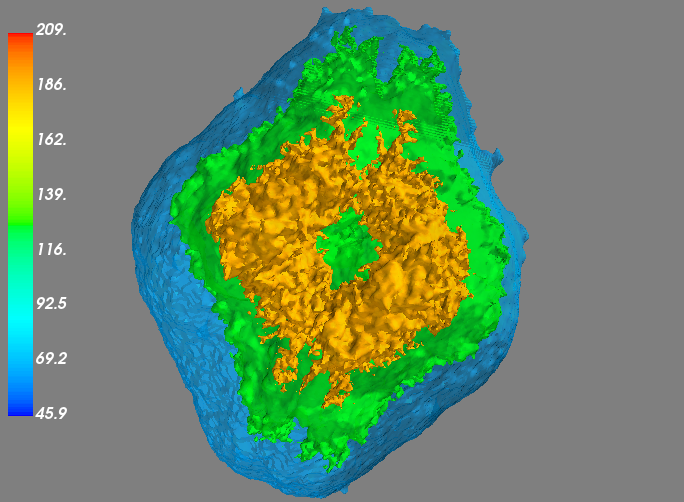

In [19]:
Image(filename='../3-reconstruction/data/5a1a_projections_and_angles_predicted_var00_updated.png')

In [14]:
# # check: both plots should be the same
# fig, axs = plt.subplots(1, 2, figsize=(15,7))
# d2 = d_q(euler2quaternion(angles_true), qpa)
# axs[0].set_xlim(0, np.pi)
# axs[0].set_title(f"Predicted quaternion\nMEAN={np.mean(d2):.2e} rad ({np.degrees(np.mean(d2)):.2e}) STD={np.std(d2):.2e}")
# s = sns.distplot(d2, kde=False, bins=100, ax=axs[0], axlabel="Distance [rad]", color="r")
# max_count = int(max([h.get_height() for h in s.patches]))
# axs[0].plot([np.mean(d2)]*max_count, np.arange(0, max_count,1), c="r", lw=4)

# d3 = d_q(euler2quaternion(angles_true), euler2quaternion(angles_predicted))
# axs[1].set_xlim(0, np.pi)
# axs[1].set_title(f"Predicted angle\nMEAN={np.mean(d3):.2e} rad ({np.degrees(np.mean(d3)):.2e}) STD={np.std(d3):.2e}")
# s = sns.distplot(d3, kde=False, bins=100, ax=axs[1], axlabel="Distance [rad]", color="r")
# max_count = int(max([h.get_height() for h in s.patches]))
# axs[1].plot([np.mean(d3)]*max_count, np.arange(0, max_count,1), c="r", lw=4)

In [15]:
# for i, a in enumerate(angles_predicted):
#     angles_predicted[i] = [a[0]%(2*np.pi), a[1]%(2*np.pi), a[2]%(2*np.pi)]

In [16]:
# sns.set(style="white", color_codes=True)
# sns.set(style="whitegrid")

# # for i, a in enumerate(ap):
# #     ap[i] = np.array([a[0]%(2*np.pi), a[1]%np.pi, a[2]%(2*np.pi)])

# fig, axs = plt.subplots(1, 3, figsize=(17,7))
# # axs[0].set_xlim(0,2*np.pi)
# # axs[1].set_xlim(0,np.pi)
# # axs[2].set_xlim(0,2*np.pi)
# plt.suptitle("Angles Count")

# sns.distplot(angles_predicted[:,0]-angles_true[:,0], kde=False, bins=40, ax=axs[0], axlabel="Z1 axis angle rotation [rad]", color="r")
# sns.distplot(angles_predicted[:,1]-angles_true[:,1], kde=False, bins=40, ax=axs[1], axlabel="Y2 axis angle rotation [rad]", color="g")
# sns.distplot(angles_predicted[:,2]-angles_true[:,2], kde=False, bins=40, ax=axs[2], axlabel="Z3 axis angle rotation [rad]", color="b")
# plt.show()

In [17]:
# np.save("data/predicted_angles_var00_updated.npy", angles_predicted)
# angles_predicted = np.load("data/predicted_angles_var00_updated.npy")
# angles_predicted

---

## 1.3.3. Angle Recovery: Variance 0.1

#### dP/dQ plot

In [7]:
def d_p(in1, in2):
    dist = d_q(in1, in2)
    norm_distr = tf.random.normal(shape=dist.shape, mean=dist, stddev=0.1, dtype=tf.float64)
    return norm_distr  

In [8]:
idx1 = list(np.random.choice(range(NUM_PROJECTIONS), size=5000))
idx2 = list(np.random.choice(range(NUM_PROJECTIONS), size=5000))

q1_true = euler2quaternion([angles_true[i] for i in idx1])
q2_true = euler2quaternion([angles_true[i] for i in idx2])

dP_values = d_p(q1_true, q2_true)#.T[0]
dQ_values = d_q(q1_true, q2_true)#.numpy()

<Figure size 432x288 with 0 Axes>

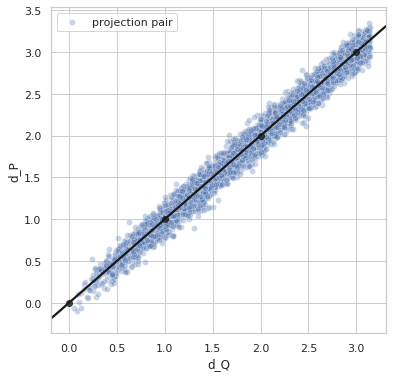

<Figure size 432x288 with 0 Axes>

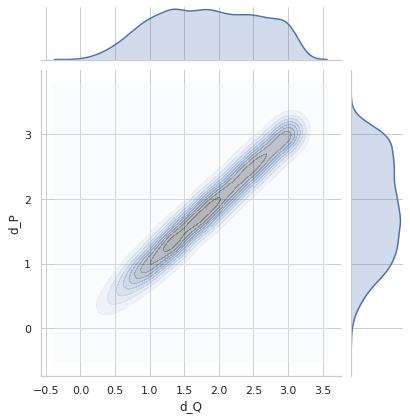

In [9]:
plot_dP_dQ(dP_values, dQ_values);
plot_dP_dQ_density(dP_values, dQ_values);

## Angle Recovery

Perfect distances. Learning rate 0.01

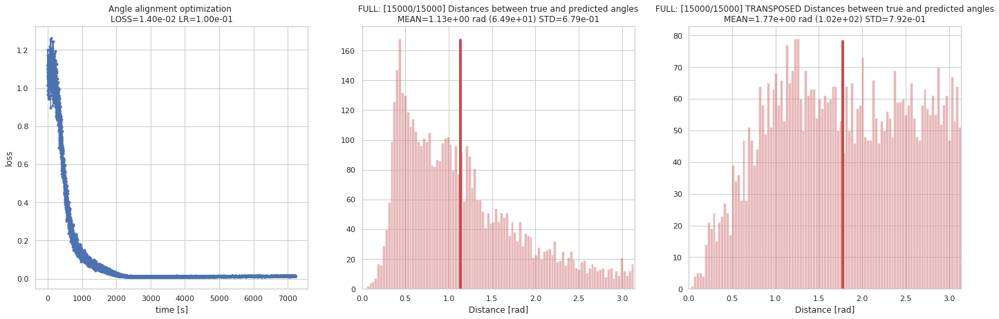

step 1500/15000 (703s): loss = 2.22e-01
step 3000/15000 (1413s): loss = 6.91e-02
step 4500/15000 (2107s): loss = 1.41e-02
step 6000/15000 (2811s): loss = 1.34e-02
step 7500/15000 (3539s): loss = 1.20e-02
step 9000/15000 (4253s): loss = 1.38e-02
step 10500/15000 (4981s): loss = 1.36e-02
step 12000/15000 (5709s): loss = 1.34e-02
step 13500/15000 (6450s): loss = 1.34e-02
step 15000/15000 (7219s): loss = 1.42e-02



In [10]:
q_predicted = train_angle_recovery(steps=15000, 
                                 batch_size=512, 
                                 projection_idx=range(NUM_PROJECTIONS), 
                                 in_data=angles_true, 
                                 distance_fn=d_p, 
                                 learning_rate=0.1, 
                                 optimization=True)

In [11]:
q_save = np.zeros((len(q_predicted),4))
for i, q in enumerate(q_predicted):
    q_save[i] = q.numpy()
                    
np.save("data/5a1a/predicted_quaternions_var0.1.npy", q_save)

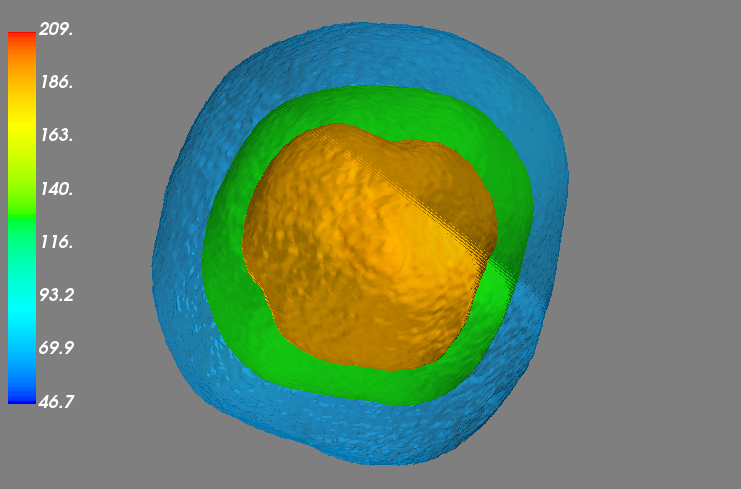

In [7]:
Image(filename='../3-reconstruction/data/5a1a_projections_and_angles_predicted_var01.png')

## Angle Alignment

In [15]:
qp = np.load("data/5a1a/predicted_quaternions_var0.1.npy")

transposed = True
ap = quaternion2euler(qp, transposed=transposed)

# TODO:
np.save("data/5a1a/predicted_angles_var01.npy", ap)

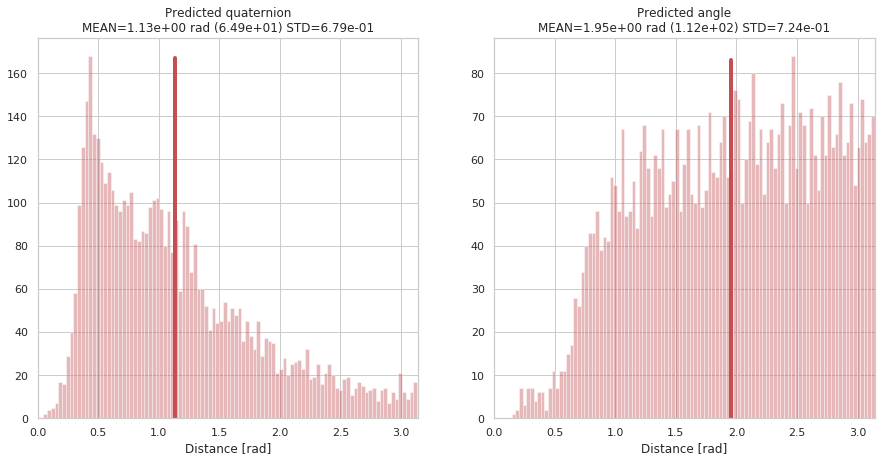

In [16]:
# check: both plots should be the same (if transposed=False)
fig, axs = plt.subplots(1, 2, figsize=(15,7))
d2 = d_q(euler2quaternion(angles_true), qp)
axs[0].set_xlim(0, np.pi)
axs[0].set_title(f"Predicted quaternion\nMEAN={np.mean(d2):.2e} rad ({np.degrees(np.mean(d2)):.2e}) STD={np.std(d2):.2e}")
s = sns.distplot(d2, kde=False, bins=100, ax=axs[0], axlabel="Distance [rad]", color="r")
max_count = int(max([h.get_height() for h in s.patches]))
axs[0].plot([np.mean(d2)]*max_count, np.arange(0, max_count,1), c="r", lw=4)

d3 = d_q(euler2quaternion(angles_true), euler2quaternion(ap))
axs[1].set_xlim(0, np.pi)
axs[1].set_title(f"Predicted angle\nMEAN={np.mean(d3):.2e} rad ({np.degrees(np.mean(d3)):.2e}) STD={np.std(d3):.2e}")
s = sns.distplot(d3, kde=False, bins=100, ax=axs[1], axlabel="Distance [rad]", color="r")
max_count = int(max([h.get_height() for h in s.patches]))
axs[1].plot([np.mean(d3)]*max_count, np.arange(0, max_count,1), c="r", lw=4)

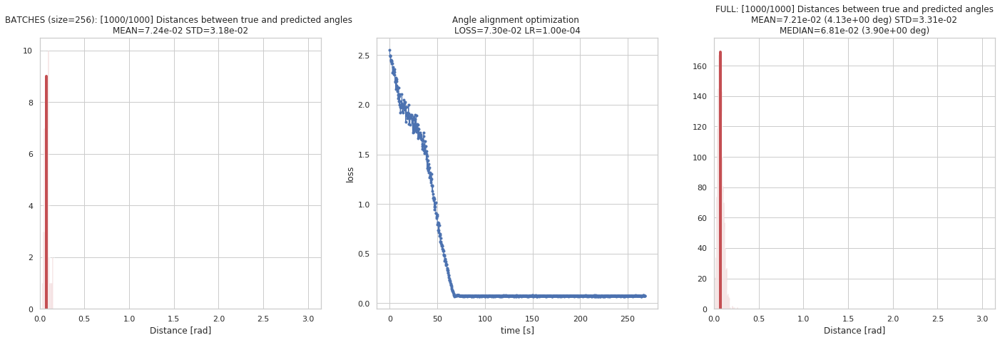

step 100/1000 (27s): loss = 2.06e+00
step 200/1000 (55s): loss = 1.34e+00
step 300/1000 (81s): loss = 2.15e-01
step 400/1000 (107s): loss = 7.22e-02
step 500/1000 (135s): loss = 7.24e-02
step 600/1000 (163s): loss = 7.22e-02
step 700/1000 (190s): loss = 7.19e-02
step 800/1000 (216s): loss = 7.25e-02
step 900/1000 (243s): loss = 7.20e-02
step 1000/1000 (270s): loss = 7.23e-02



In [42]:
m, rotation, loss = training_angle_alignment(m=[1.0, 1.0, 1.0, 1.0],
                                             steps=1000, 
                                             batch_size=256, 
                                             projection_idx=range(NUM_PROJECTIONS), 
                                             learning_rate=0.01, 
                                             angles_true=angles_true, 
                                             angles_predicted=ap)

In [43]:
m, rotation[0].numpy(), loss

([1.0, 1.0, 1.0, 1.0],
 array([2.21822304, 6.1011688 , 3.43519051, 0.52627545, 0.18431717,
        6.10707268]),
 0.07227705446464558)

In [35]:
qpn = euler2quaternion(ap)

qpa = update_quaternion(m=m, 
                        a_R=rotation, 
                        q_predicted=qpn)

angles_predicted = quaternion2euler(qpa).numpy()

np.save("data/5a1a/predicted_angles_var01_updated.npy", angles_predicted)

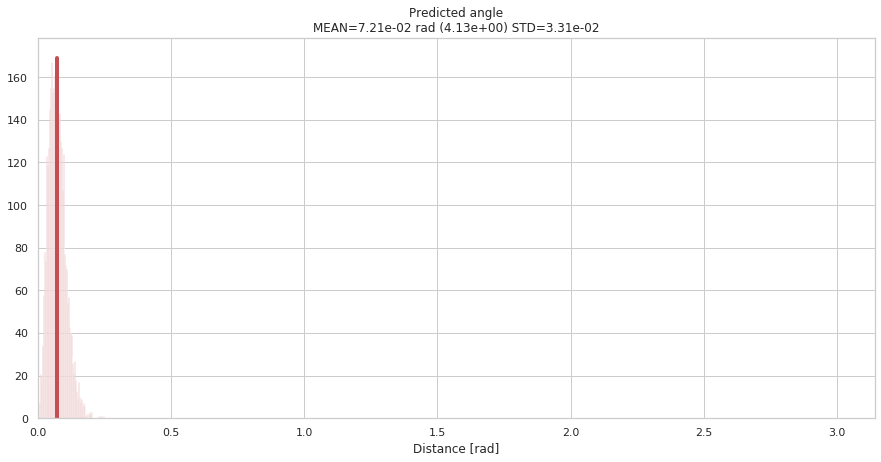

In [36]:
fig, axs = plt.subplots(1, 1, figsize=(15,7))

d3 = d_q(euler2quaternion(angles_true), euler2quaternion(angles_predicted))
axs.set_xlim(0, np.pi)
axs.set_title(f"Predicted angle\nMEAN={np.mean(d3):.2e} rad ({np.degrees(np.mean(d3)):.2e}) STD={np.std(d3):.2e}")
s = sns.distplot(d3, kde=False, bins=100, ax=axs, axlabel="Distance [rad]", color="r")
max_count = int(max([h.get_height() for h in s.patches]))
axs.plot([np.mean(d3)]*max_count, np.arange(0, max_count,1), c="r", lw=4)

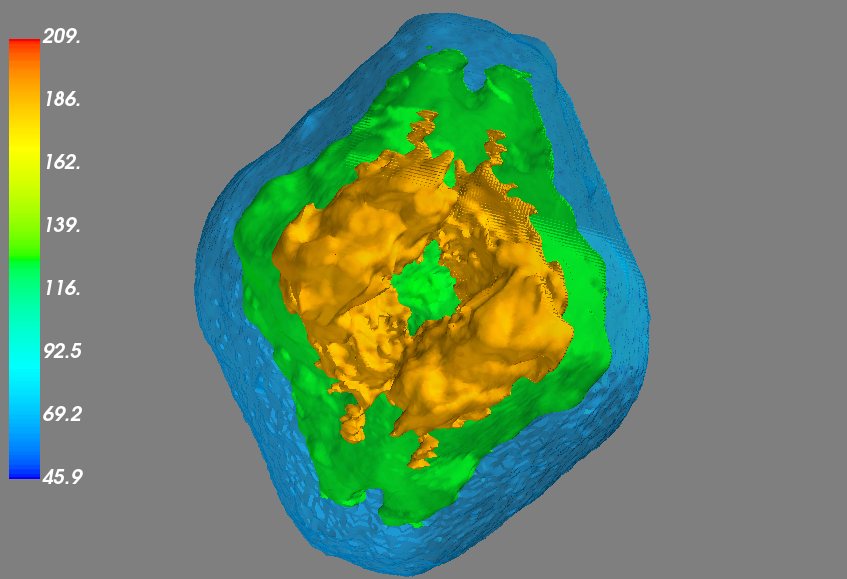

In [8]:
Image(filename='../3-reconstruction/data/5a1a_projections_and_angles_predicted_var01_updated.png')

---

## 1.3.3. Angle Recovery: Variance 0.2

#### dP/dQ plot

In [12]:
def d_p(in1, in2):
    dist = d_q(in1, in2)
    norm_distr = tf.random.normal(shape=dist.shape, mean=dist, stddev=0.2, dtype=tf.float64)
    return norm_distr  

In [13]:
idx1 = list(np.random.choice(range(NUM_PROJECTIONS), size=5000))
idx2 = list(np.random.choice(range(NUM_PROJECTIONS), size=5000))

q1_true = euler2quaternion([angles_true[i] for i in idx1])
q2_true = euler2quaternion([angles_true[i] for i in idx2])

dP_values = d_p(q1_true, q2_true)
dQ_values = d_q(q1_true, q2_true)

<Figure size 432x288 with 0 Axes>

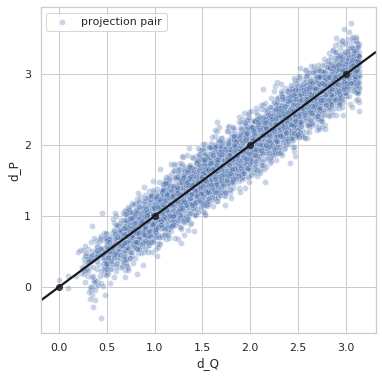

<Figure size 432x288 with 0 Axes>

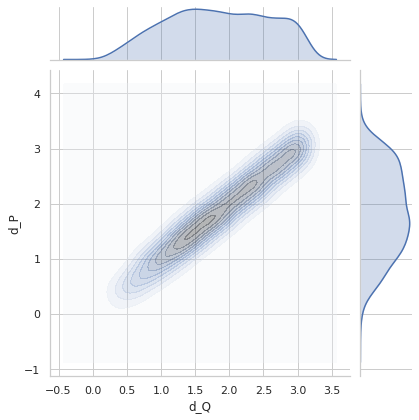

In [15]:
plot_dP_dQ(dP_values, dQ_values);
plot_dP_dQ_density(dP_values, dQ_values);

In [16]:
np.sqrt(1/(len(dQ_values)-1)*np.sum(np.power(dP_values-dQ_values, 2)))

0.20243607083446727

#### Angle Recovery

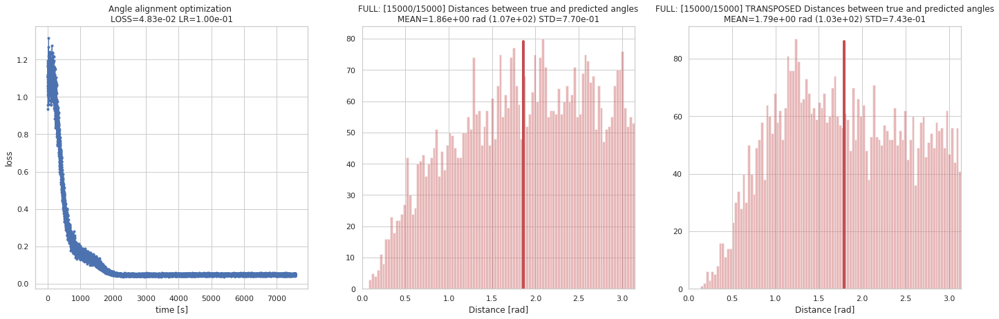

step 1500/15000 (701s): loss = 1.96e-01
step 3000/15000 (1532s): loss = 1.07e-01
step 4500/15000 (2274s): loss = 5.04e-02
step 6000/15000 (3019s): loss = 4.45e-02
step 7500/15000 (3791s): loss = 4.36e-02
step 9000/15000 (4543s): loss = 4.68e-02
step 10500/15000 (5298s): loss = 4.49e-02
step 12000/15000 (6053s): loss = 4.79e-02
step 13500/15000 (6801s): loss = 5.11e-02
step 15000/15000 (7566s): loss = 5.24e-02



In [17]:
q_predicted = train_angle_recovery(steps=15000, 
                                 batch_size=512, 
                                 projection_idx=range(NUM_PROJECTIONS), 
                                 in_data=angles_true, 
                                 distance_fn=d_p, 
                                 learning_rate=0.1, 
                                 optimization=True)

In [18]:
q_save = np.zeros((len(q_predicted),4))
for i, q in enumerate(q_predicted):
    q_save[i] = q.numpy()
                    
np.save("data/5a1a/predicted_quaternions_var0.2.npy", q_save)

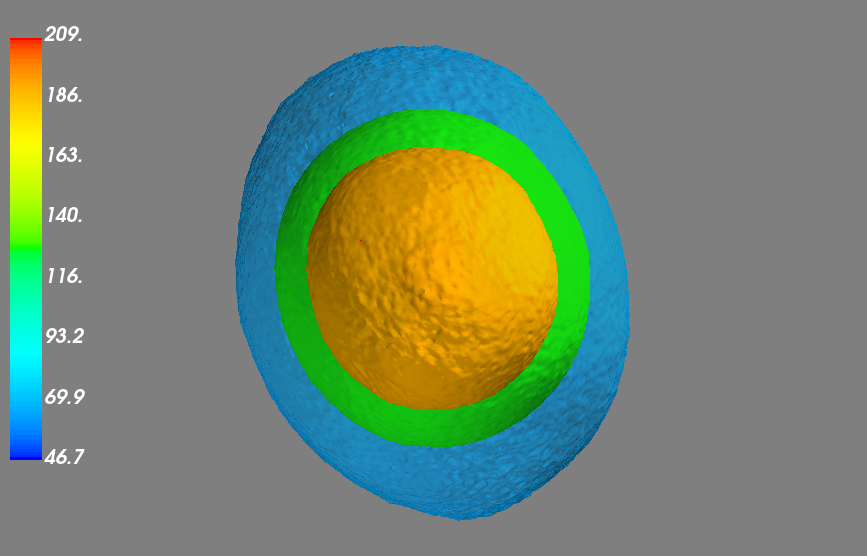

In [9]:
Image(filename='../3-reconstruction/data/5a1a_projections_and_angles_predicted_var02.png')

## Angle Alignment

In [46]:
qp = np.load("data/5a1a/predicted_quaternions_var0.2.npy")

transposed = False
ap = quaternion2euler(qp, transposed=transposed)

np.save("data/5a1a/predicted_angles_var02.npy", ap)

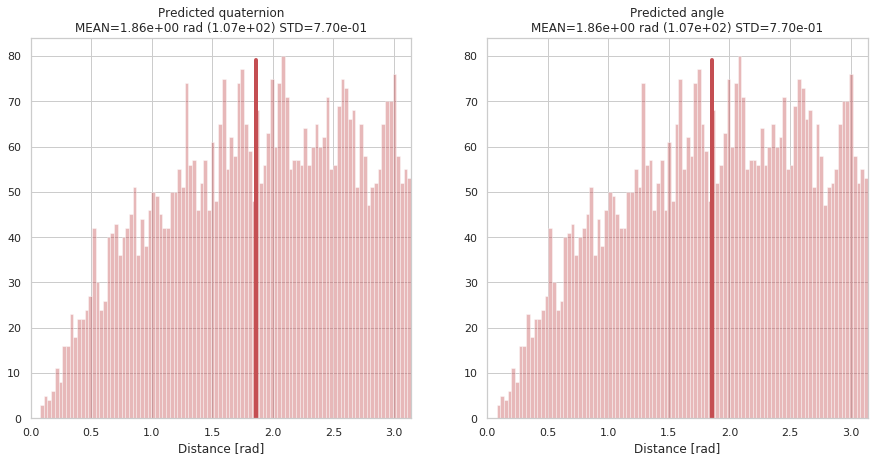

In [47]:
# check: both plots should be the same
fig, axs = plt.subplots(1, 2, figsize=(15,7))
d2 = d_q(euler2quaternion(angles_true), qp)
axs[0].set_xlim(0, np.pi)
axs[0].set_title(f"Predicted quaternion\nMEAN={np.mean(d2):.2e} rad ({np.degrees(np.mean(d2)):.2e}) STD={np.std(d2):.2e}")
s = sns.distplot(d2, kde=False, bins=100, ax=axs[0], axlabel="Distance [rad]", color="r")
max_count = int(max([h.get_height() for h in s.patches]))
axs[0].plot([np.mean(d2)]*max_count, np.arange(0, max_count,1), c="r", lw=4)

d3 = d_q(euler2quaternion(angles_true), euler2quaternion(quaternion2euler(qp)))
axs[1].set_xlim(0, np.pi)
axs[1].set_title(f"Predicted angle\nMEAN={np.mean(d3):.2e} rad ({np.degrees(np.mean(d3)):.2e}) STD={np.std(d3):.2e}")
s = sns.distplot(d3, kde=False, bins=100, ax=axs[1], axlabel="Distance [rad]", color="r")
max_count = int(max([h.get_height() for h in s.patches]))
axs[1].plot([np.mean(d3)]*max_count, np.arange(0, max_count,1), c="r", lw=4)

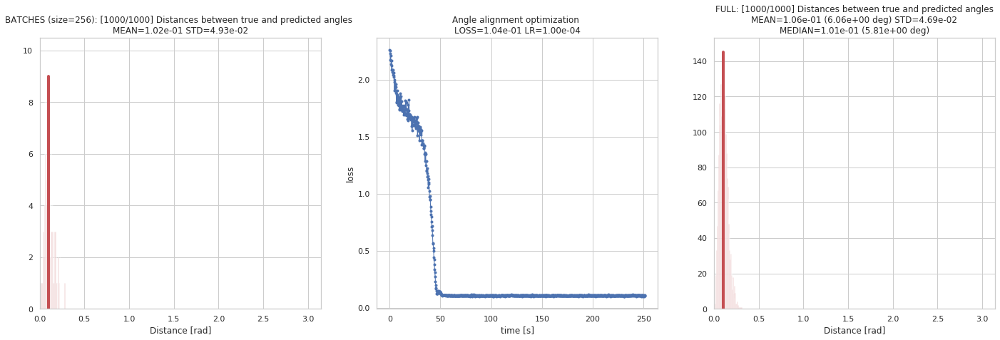

step 100/1000 (26s): loss = 1.82e+00
step 200/1000 (50s): loss = 9.85e-01
step 300/1000 (75s): loss = 1.07e-01
step 400/1000 (99s): loss = 1.06e-01
step 500/1000 (125s): loss = 1.06e-01
step 600/1000 (150s): loss = 1.06e-01
step 700/1000 (176s): loss = 1.06e-01
step 800/1000 (201s): loss = 1.05e-01
step 900/1000 (227s): loss = 1.06e-01
step 1000/1000 (253s): loss = 1.06e-01



In [49]:
m, rotation, loss = training_angle_alignment(m=[1.0, 1.0, 1.0, 1.0],
                                             steps=1000, 
                                             batch_size=256, 
                                             projection_idx=range(NUM_PROJECTIONS), 
                                             learning_rate=0.01, 
                                             angles_true=angles_true, 
                                             angles_predicted=ap)

In [50]:
m, rotation[0].numpy(), loss

([1.0, 1.0, 1.0, 1.0],
 array([5.10207893, 6.23379151, 2.88231226, 3.12769377, 3.29075931,
        2.95981783]),
 0.10594210013387077)

In [51]:
qpn = euler2quaternion(ap)

qpa = update_quaternion(m=m, 
                        a_R=rotation, 
                        q_predicted=qpn)

angles_predicted = quaternion2euler(qpa).numpy()

np.save("data/5a1a/predicted_angles_var02_updated.npy", angles_predicted)

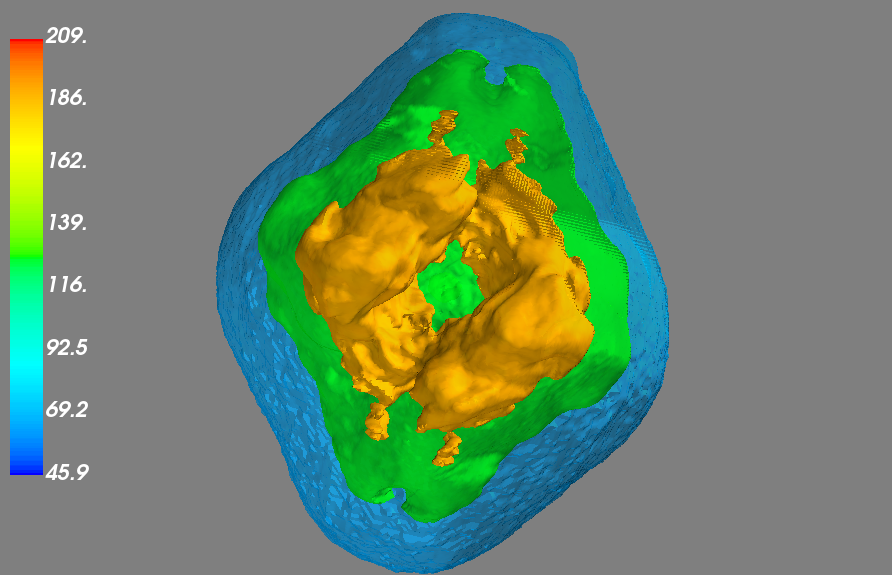

In [10]:
Image(filename='../3-reconstruction/data/5a1a_projections_and_angles_predicted_var02_updated.png')

---

## 1.3.5. Angle Recovery: Variance 0.3

#### dP/dQ plot

In [26]:
def d_p(in1, in2):
    dist = d_q(in1, in2)
    norm_distr = tf.random.normal(shape=dist.shape, mean=dist, stddev=0.3, dtype=tf.float64)
    return norm_distr  

In [27]:
idx1 = list(np.random.choice(range(NUM_PROJECTIONS), size=5000))
idx2 = list(np.random.choice(range(NUM_PROJECTIONS), size=5000))

q1_true = euler2quaternion([angles_true[i] for i in idx1])
q2_true = euler2quaternion([angles_true[i] for i in idx2])

dP_values = d_p(q1_true, q2_true)#.T[0]
dQ_values = d_q(q1_true, q2_true)#.numpy()

<Figure size 432x288 with 0 Axes>

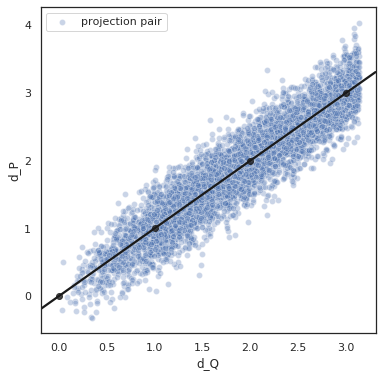

<Figure size 432x288 with 0 Axes>

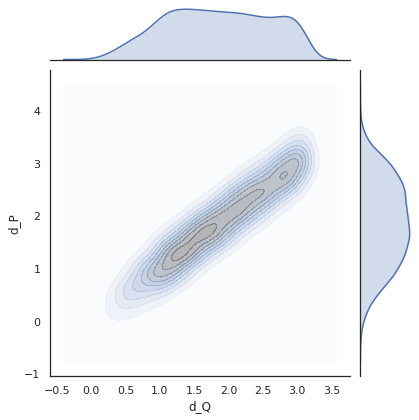

In [28]:
plot_dP_dQ(dP_values, dQ_values);
plot_dP_dQ_density(dP_values, dQ_values);

In [29]:
# variance
np.sqrt(1/(len(dQ_values)-1)*np.sum(np.power(dP_values-dQ_values, 2)))

0.295987304648041

## Angle Recovery

Perfect distances. Learning rate 0.01

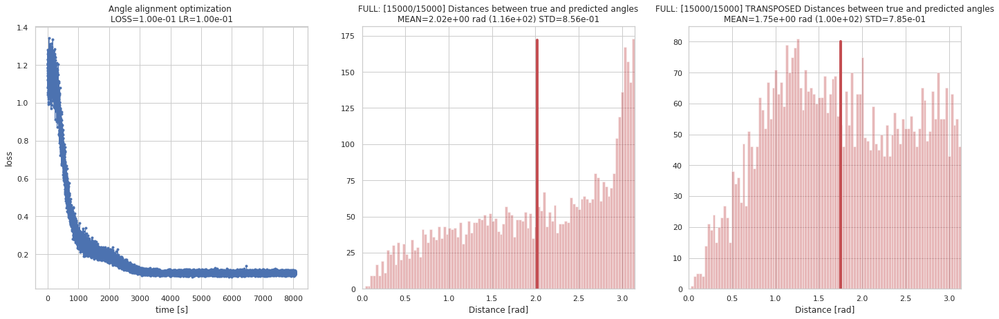

step 1500/15000 (716s): loss = 3.62e-01
step 3000/15000 (1445s): loss = 2.04e-01
step 4500/15000 (2176s): loss = 1.51e-01
step 6000/15000 (2913s): loss = 1.05e-01
step 7500/15000 (3634s): loss = 1.12e-01
step 9000/15000 (4518s): loss = 1.00e-01
step 10500/15000 (5466s): loss = 9.60e-02
step 12000/15000 (6409s): loss = 1.01e-01
step 13500/15000 (7197s): loss = 1.04e-01
step 15000/15000 (8067s): loss = 1.00e-01



In [30]:
q_predicted = train_angle_recovery(steps=15000, 
                                 batch_size=512, 
                                 projection_idx=range(NUM_PROJECTIONS), 
                                 in_data=angles_true, 
                                 distance_fn=d_p, 
                                 learning_rate=0.1, 
                                 optimization=True)

In [31]:
q_save = np.zeros((len(q_predicted),4))
for i, q in enumerate(q_predicted):
    q_save[i] = q.numpy()
                    
np.save("data/5a1a/predicted_quaternions_var0.3.npy", q_save)

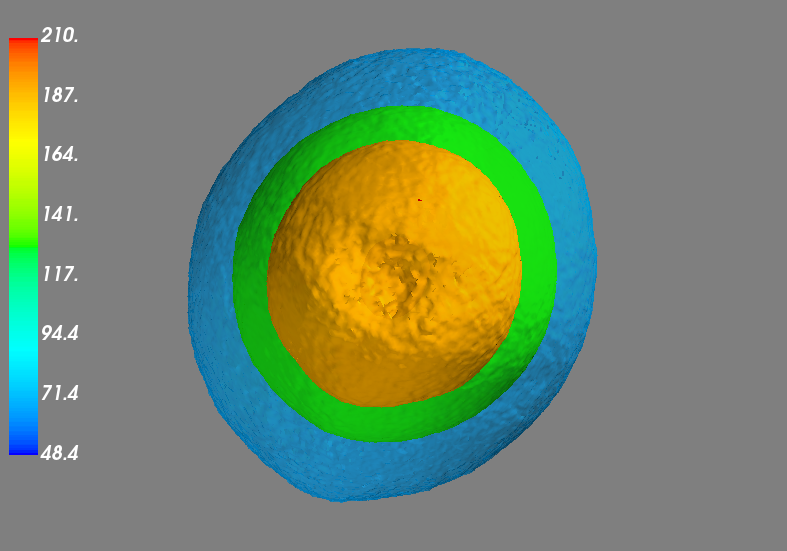

In [11]:
Image(filename='../3-reconstruction/data/5a1a_projections_and_angles_predicted_var03.png')

## Angle Alignment

In [61]:
qp = np.load("data/5a1a/predicted_quaternions_var0.3.npy")

transposed = False
ap = quaternion2euler(qp, transposed=transposed)

np.save("data/5a1a/predicted_angles_var03.npy", ap)

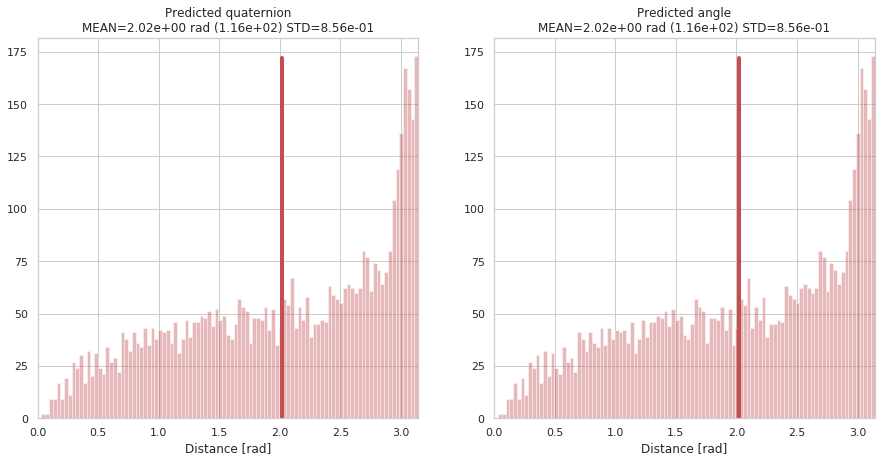

In [62]:
# check: both plots should be the same
fig, axs = plt.subplots(1, 2, figsize=(15,7))
d2 = d_q(euler2quaternion(angles_true), qp)
axs[0].set_xlim(0, np.pi)
axs[0].set_title(f"Predicted quaternion\nMEAN={np.mean(d2):.2e} rad ({np.degrees(np.mean(d2)):.2e}) STD={np.std(d2):.2e}")
s = sns.distplot(d2, kde=False, bins=100, ax=axs[0], axlabel="Distance [rad]", color="r")
max_count = int(max([h.get_height() for h in s.patches]))
axs[0].plot([np.mean(d2)]*max_count, np.arange(0, max_count,1), c="r", lw=4)

d3 = d_q(euler2quaternion(angles_true), euler2quaternion(ap))
axs[1].set_xlim(0, np.pi)
axs[1].set_title(f"Predicted angle\nMEAN={np.mean(d3):.2e} rad ({np.degrees(np.mean(d3)):.2e}) STD={np.std(d3):.2e}")
s = sns.distplot(d3, kde=False, bins=100, ax=axs[1], axlabel="Distance [rad]", color="r")
max_count = int(max([h.get_height() for h in s.patches]))
axs[1].plot([np.mean(d3)]*max_count, np.arange(0, max_count,1), c="r", lw=4)

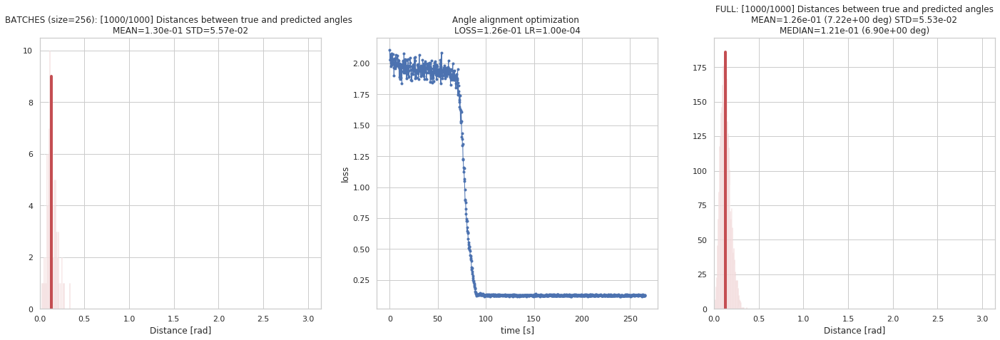

step 100/1000 (26s): loss = 1.98e+00
step 200/1000 (54s): loss = 1.95e+00
step 300/1000 (81s): loss = 1.75e+00
step 400/1000 (107s): loss = 2.36e-01
step 500/1000 (134s): loss = 1.27e-01
step 600/1000 (159s): loss = 1.26e-01
step 700/1000 (187s): loss = 1.27e-01
step 800/1000 (215s): loss = 1.27e-01
step 900/1000 (242s): loss = 1.26e-01
step 1000/1000 (268s): loss = 1.26e-01



In [63]:
m, rotation, loss = training_angle_alignment(m=[1.0, 1.0, 1.0, 1.0],
                                             steps=1000, 
                                             batch_size=256, 
                                             projection_idx=range(NUM_PROJECTIONS), 
                                             learning_rate=0.01, 
                                             angles_true=angles_true, 
                                             angles_predicted=ap)

In [64]:
m, rotation[0].numpy(), loss

([1.0, 1.0, 1.0, 1.0],
 array([-0.23481344,  3.39508826,  3.25058737,  1.49462852,  2.73483855,
         0.5564105 ]),
 0.12628940275681994)

In [65]:
qpn = euler2quaternion(ap)

qpa = update_quaternion(m=m, 
                        a_R=rotation, 
                        q_predicted=qpn)

angles_predicted = quaternion2euler(qpa).numpy()

np.save("data/5a1a/predicted_angles_var03_updated.npy", angles_predicted)

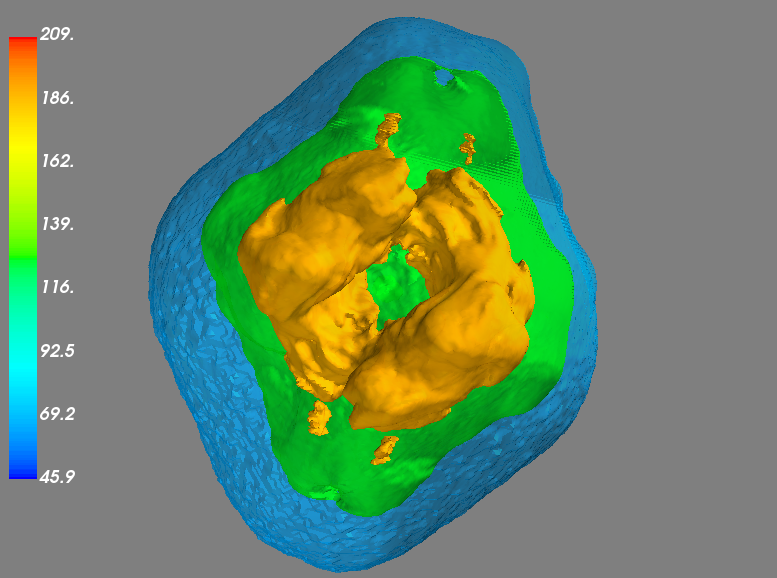

In [12]:
Image(filename='../3-reconstruction/data/5a1a_projections_and_angles_predicted_var03_updated.png')

---

## 1.3.6. Angle Recovery: Variance 0.4

#### dP/dQ plot

In [32]:
def d_p(in1, in2):
    dist = d_q(in1, in2)
    norm_distr = tf.random.normal(shape=dist.shape, mean=dist, stddev=0.4, dtype=tf.float64)
    return norm_distr  

In [33]:
idx1 = list(np.random.choice(range(NUM_PROJECTIONS), size=5000))
idx2 = list(np.random.choice(range(NUM_PROJECTIONS), size=5000))

q1_true = euler2quaternion([angles_true[i] for i in idx1])
q2_true = euler2quaternion([angles_true[i] for i in idx2])

dP_values = d_p(q1_true, q2_true)#.T[0]
dQ_values = d_q(q1_true, q2_true)#.numpy()

<Figure size 432x288 with 0 Axes>

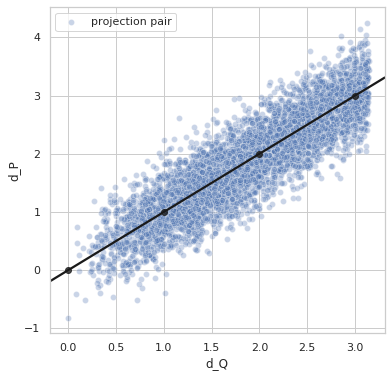

<Figure size 432x288 with 0 Axes>

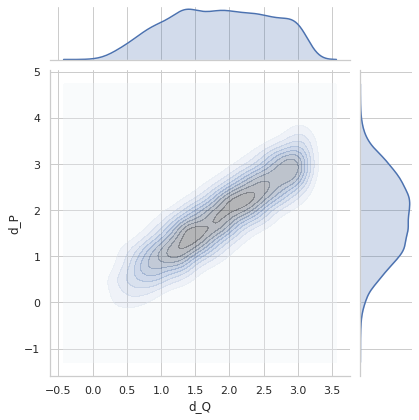

In [34]:
plot_dP_dQ(dP_values, dQ_values);
plot_dP_dQ_density(dP_values, dQ_values);

## Angle Recovery

Perfect distances. Learning rate 0.01

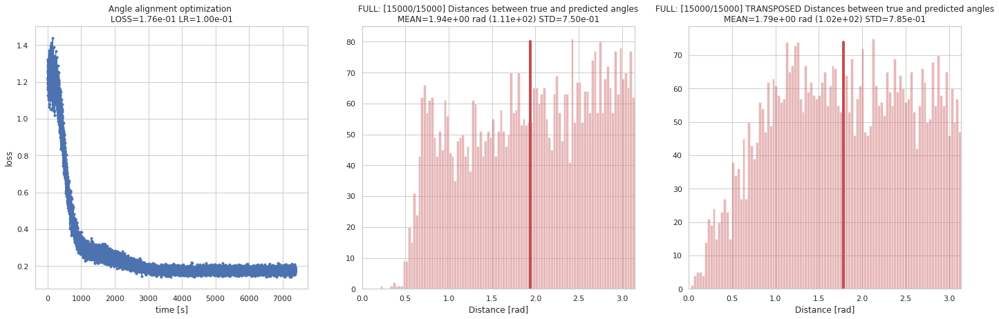

step 1500/15000 (674s): loss = 4.65e-01
step 3000/15000 (1368s): loss = 2.60e-01
step 4500/15000 (2087s): loss = 2.50e-01
step 6000/15000 (2833s): loss = 1.84e-01
step 7500/15000 (3577s): loss = 1.71e-01
step 9000/15000 (4329s): loss = 1.59e-01
step 10500/15000 (5096s): loss = 1.93e-01
step 12000/15000 (5843s): loss = 1.54e-01
step 13500/15000 (6631s): loss = 1.69e-01
step 15000/15000 (7384s): loss = 1.95e-01



In [10]:
q_predicted = train_angle_recovery(steps=15000, 
                                 batch_size=512, 
                                 projection_idx=range(NUM_PROJECTIONS), 
                                 in_data=angles_true, 
                                 distance_fn=d_p, 
                                 learning_rate=0.1, 
                                 optimization=True)

In [11]:
q_save = np.zeros((len(q_predicted),4))
for i, q in enumerate(q_predicted):
    q_save[i] = q.numpy()
                    
np.save("data/5a1a/predicted_quaternions_var0.4.npy", q_save)

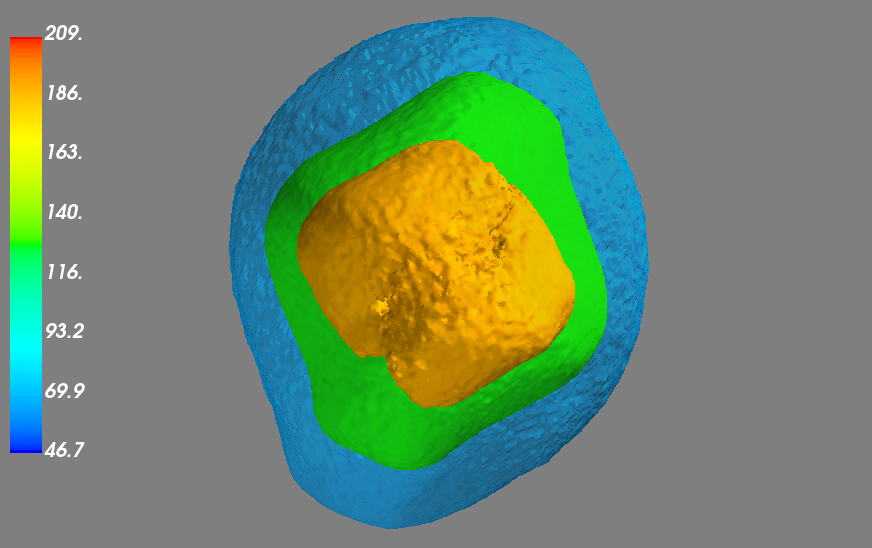

In [109]:
Image(filename='../3-reconstruction/data/5a1a_projections_and_angles_predicted_var04.png')

## Angle Alignment

In [43]:
qp = np.load("data/5a1a/predicted_quaternions_var0.4.npy")

transposed = True
ap = quaternion2euler(qp, transposed=transposed)

np.save("data/5a1a/predicted_angles_var04.npy", ap)

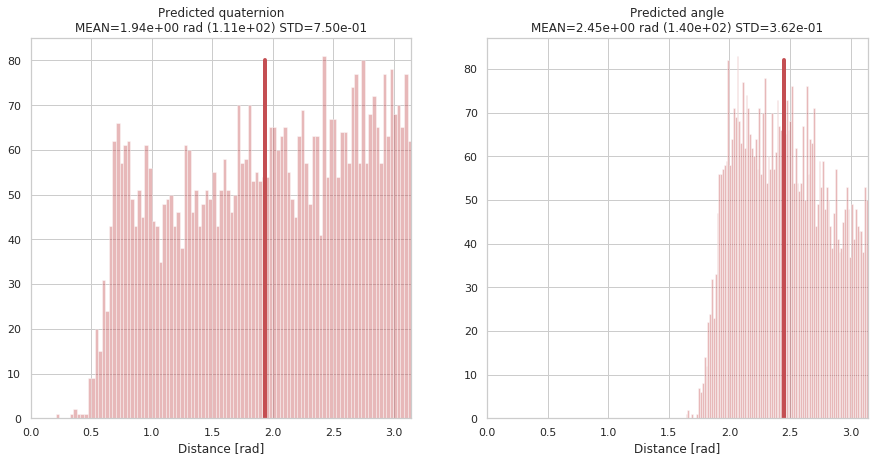

In [44]:
# check: both plots should be the same
fig, axs = plt.subplots(1, 2, figsize=(15,7))
d2 = d_q(euler2quaternion(angles_true), qp)
axs[0].set_xlim(0, np.pi)
axs[0].set_title(f"Predicted quaternion\nMEAN={np.mean(d2):.2e} rad ({np.degrees(np.mean(d2)):.2e}) STD={np.std(d2):.2e}")
s = sns.distplot(d2, kde=False, bins=100, ax=axs[0], axlabel="Distance [rad]", color="r")
max_count = int(max([h.get_height() for h in s.patches]))
axs[0].plot([np.mean(d2)]*max_count, np.arange(0, max_count,1), c="r", lw=4)

d3 = d_q(euler2quaternion(angles_true), euler2quaternion(ap))
axs[1].set_xlim(0, np.pi)
axs[1].set_title(f"Predicted angle\nMEAN={np.mean(d3):.2e} rad ({np.degrees(np.mean(d3)):.2e}) STD={np.std(d3):.2e}")
s = sns.distplot(d3, kde=False, bins=100, ax=axs[1], axlabel="Distance [rad]", color="r")
max_count = int(max([h.get_height() for h in s.patches]))
axs[1].plot([np.mean(d3)]*max_count, np.arange(0, max_count,1), c="r", lw=4)

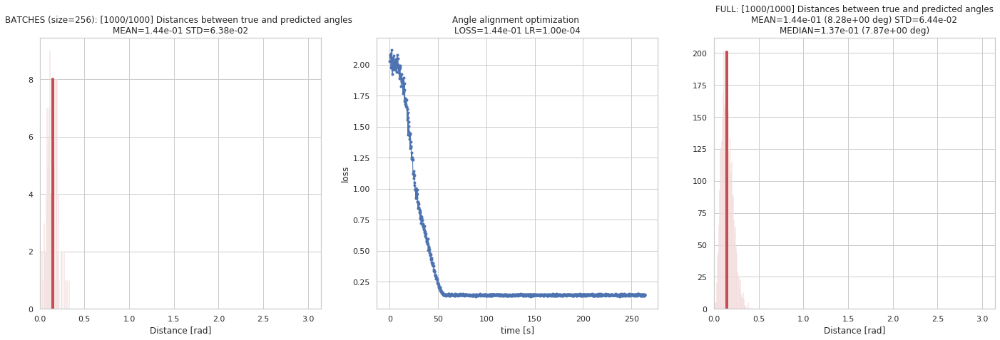

step 100/1000 (28s): loss = 1.74e+00
step 200/1000 (54s): loss = 5.59e-01
step 300/1000 (81s): loss = 1.47e-01
step 400/1000 (107s): loss = 1.44e-01
step 500/1000 (133s): loss = 1.44e-01
step 600/1000 (159s): loss = 1.45e-01
step 700/1000 (184s): loss = 1.44e-01
step 800/1000 (212s): loss = 1.45e-01
step 900/1000 (239s): loss = 1.45e-01
step 1000/1000 (266s): loss = 1.45e-01



In [46]:
m, rotation, loss = training_angle_alignment(m=[1.0, 1.0, 1.0, 1.0],
                                             steps=1000, 
                                             batch_size=256, 
                                             projection_idx=range(NUM_PROJECTIONS), 
                                             learning_rate=0.01, 
                                             angles_true=angles_true, 
                                             angles_predicted=ap)

In [47]:
m, rotation[0].numpy(), loss

([1.0, 1.0, 1.0, 1.0],
 array([ 2.94038656,  6.66957627,  2.68347598,  3.52419688, -0.45837507,
         5.42364422]),
 0.14509751694161388)

In [48]:
qpn = euler2quaternion(ap)

qpa = update_quaternion(m=m, 
                        a_R=rotation, 
                        q_predicted=qpn)

angles_predicted = quaternion2euler(qpa).numpy()

np.save("data/5a1a/predicted_angles_var04_updated.npy", angles_predicted)

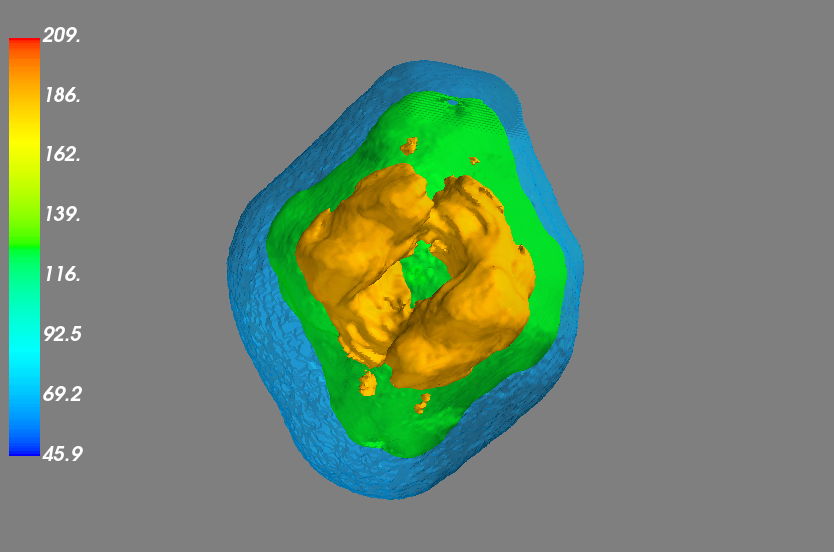

In [110]:
Image(filename='../3-reconstruction/data/5a1a_projections_and_angles_predicted_var04_updated.png')

---

## 1.3.7. Angle Recovery: Variance 0.5

#### dP/dQ plot

In [50]:
def d_p(in1, in2):
    dist = d_q(in1, in2)
    norm_distr = tf.random.normal(shape=dist.shape, mean=dist, stddev=0.5, dtype=tf.float64)
    return norm_distr  

In [51]:
idx1 = list(np.random.choice(range(NUM_PROJECTIONS), size=5000))
idx2 = list(np.random.choice(range(NUM_PROJECTIONS), size=5000))

q1_true = euler2quaternion([angles_true[i] for i in idx1])
q2_true = euler2quaternion([angles_true[i] for i in idx2])

dP_values = d_p(q1_true, q2_true)
dQ_values = d_q(q1_true, q2_true)

<Figure size 432x288 with 0 Axes>

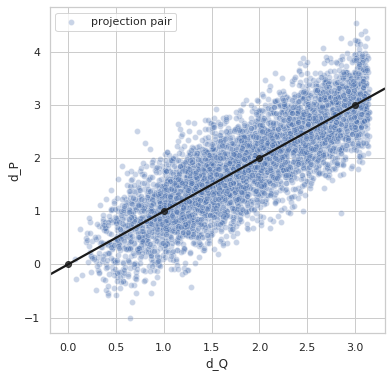

<Figure size 432x288 with 0 Axes>

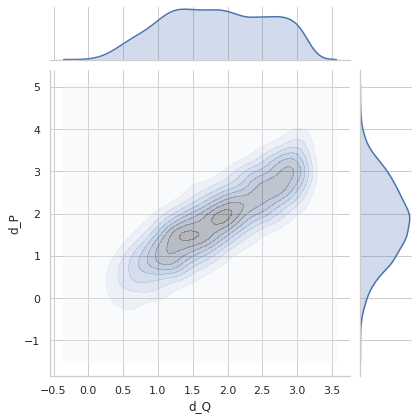

In [52]:
plot_dP_dQ(dP_values, dQ_values);
plot_dP_dQ_density(dP_values, dQ_values);

## Angle Recovery

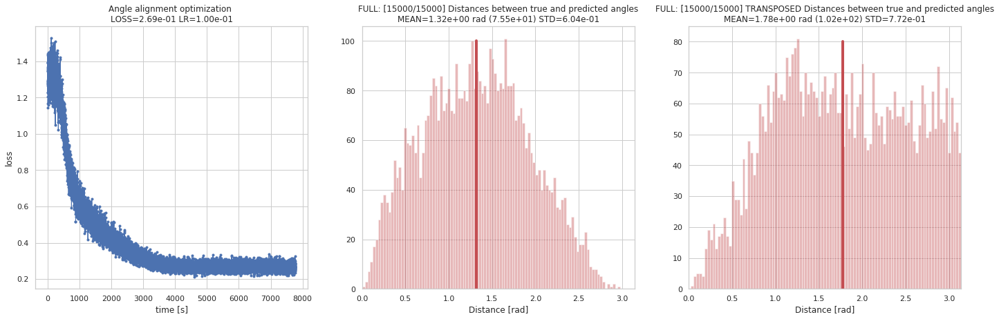

step 1500/15000 (834s): loss = 7.22e-01
step 3000/15000 (1594s): loss = 5.01e-01
step 4500/15000 (2371s): loss = 3.68e-01
step 6000/15000 (3143s): loss = 3.12e-01
step 7500/15000 (3921s): loss = 2.47e-01
step 9000/15000 (4701s): loss = 2.42e-01
step 10500/15000 (5484s): loss = 2.48e-01
step 12000/15000 (6243s): loss = 2.54e-01
step 13500/15000 (6999s): loss = 2.67e-01
step 15000/15000 (7773s): loss = 2.56e-01



In [15]:
q_predicted = train_angle_recovery(steps=15000, 
                                 batch_size=512, 
                                 projection_idx=range(NUM_PROJECTIONS), 
                                 in_data=angles_true, 
                                 distance_fn=d_p, 
                                 learning_rate=0.1, 
                                 optimization=True)

In [16]:
q_save = np.zeros((len(q_predicted),4))
for i, q in enumerate(q_predicted):
    q_save[i] = q.numpy()
                    
np.save("data/5a1a/predicted_quaternions_var0.5.npy", q_save)

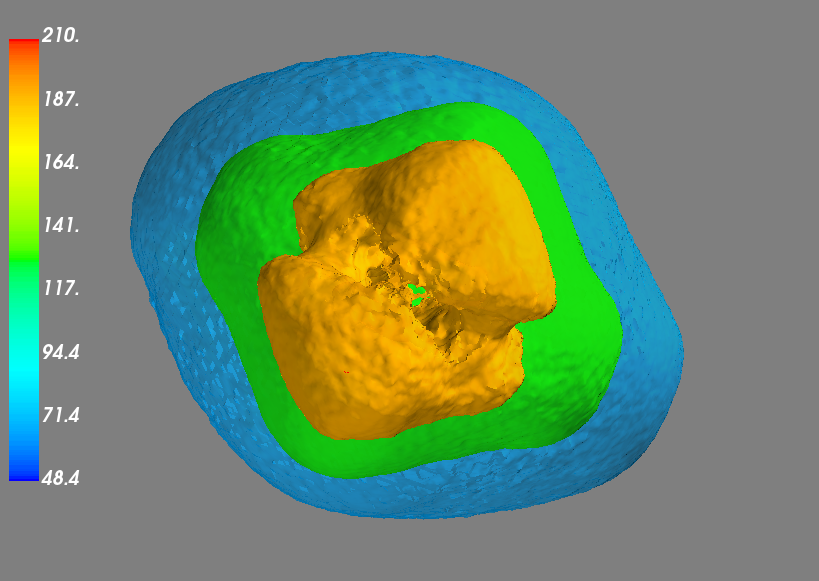

In [111]:
Image(filename='../3-reconstruction/data/5a1a_projections_and_angles_predicted_var05.png')

## Angle Alignment

In [53]:
qp = np.load("data/5a1a/predicted_quaternions_var0.5.npy")

transposed = False
ap = quaternion2euler(qp, transposed=transposed)

np.save("data/5a1a/predicted_angles_var05.npy", ap)

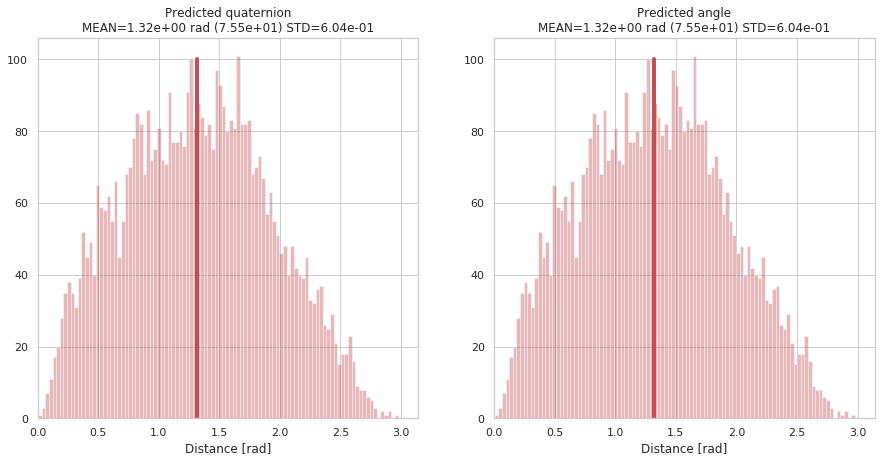

In [54]:
# check: both plots should be the same
fig, axs = plt.subplots(1, 2, figsize=(15,7))
d2 = d_q(euler2quaternion(angles_true), qp)
axs[0].set_xlim(0, np.pi)
axs[0].set_title(f"Predicted quaternion\nMEAN={np.mean(d2):.2e} rad ({np.degrees(np.mean(d2)):.2e}) STD={np.std(d2):.2e}")
s = sns.distplot(d2, kde=False, bins=100, ax=axs[0], axlabel="Distance [rad]", color="r")
max_count = int(max([h.get_height() for h in s.patches]))
axs[0].plot([np.mean(d2)]*max_count, np.arange(0, max_count,1), c="r", lw=4)

d3 = d_q(euler2quaternion(angles_true), euler2quaternion(quaternion2euler(qp)))
axs[1].set_xlim(0, np.pi)
axs[1].set_title(f"Predicted angle\nMEAN={np.mean(d3):.2e} rad ({np.degrees(np.mean(d3)):.2e}) STD={np.std(d3):.2e}")
s = sns.distplot(d3, kde=False, bins=100, ax=axs[1], axlabel="Distance [rad]", color="r")
max_count = int(max([h.get_height() for h in s.patches]))
axs[1].plot([np.mean(d3)]*max_count, np.arange(0, max_count,1), c="r", lw=4)

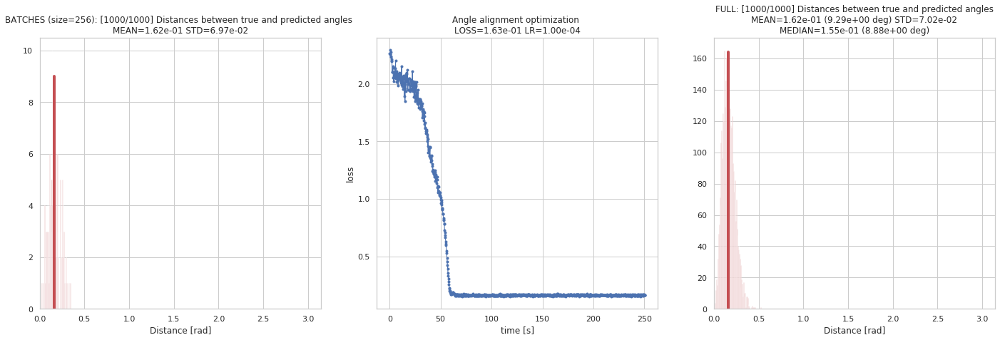

step 100/1000 (26s): loss = 2.05e+00
step 200/1000 (50s): loss = 1.51e+00
step 300/1000 (75s): loss = 3.39e-01
step 400/1000 (100s): loss = 1.62e-01
step 500/1000 (125s): loss = 1.62e-01
step 600/1000 (151s): loss = 1.62e-01
step 700/1000 (177s): loss = 1.62e-01
step 800/1000 (202s): loss = 1.63e-01
step 900/1000 (227s): loss = 1.62e-01
step 1000/1000 (252s): loss = 1.62e-01



In [56]:
m, rotation, loss = training_angle_alignment(m=[1.0, 1.0, 1.0, 1.0],
                                             steps=1000, 
                                             batch_size=256, 
                                             projection_idx=range(NUM_PROJECTIONS), 
                                             learning_rate=0.01, 
                                             angles_true=angles_true, 
                                             angles_predicted=ap)

In [57]:
m, rotation[0].numpy(), loss

([1.0, 1.0, 1.0, 1.0],
 array([-1.28398829e+00,  6.91222952e-04,  2.99020372e+00,  3.44503406e+00,
         5.45449608e+00,  6.38180426e+00]),
 0.1618123541610396)

In [58]:
qpn = euler2quaternion(ap)

qpa = update_quaternion(m=m, 
                        a_R=rotation, 
                        q_predicted=qpn)

angles_predicted = quaternion2euler(qpa).numpy()

np.save("data/5j0n/predicted_angles_var05_updated.npy", angles_predicted)

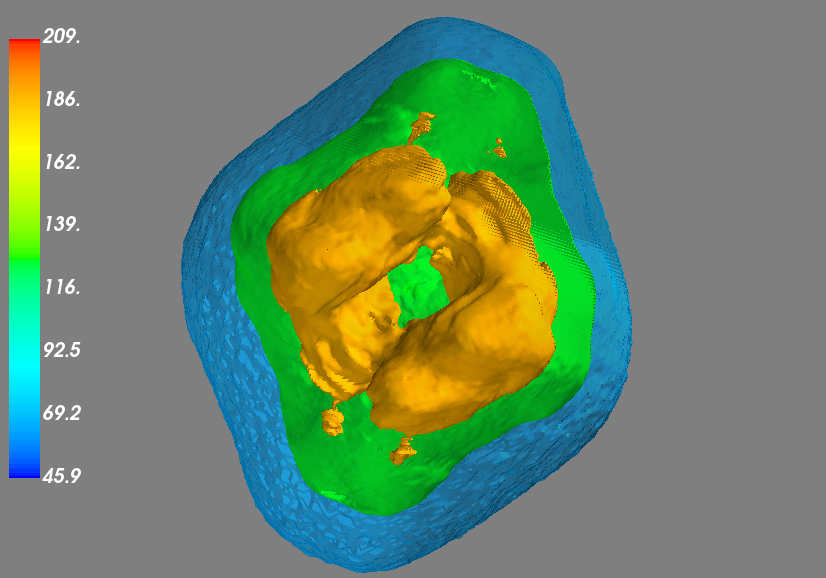

In [112]:
Image(filename='../3-reconstruction/data/5a1a_projections_and_angles_predicted_var05_updated.png')

---

## 1.3.8. Angle Recovery: Variance 0.6

#### dP/dQ plot

In [60]:
def d_p(in1, in2):
    dist = d_q(in1, in2)
    norm_distr = tf.random.normal(shape=dist.shape, mean=dist, stddev=0.6, dtype=tf.float64)
    return norm_distr  

In [61]:
idx1 = list(np.random.choice(range(NUM_PROJECTIONS), size=5000))
idx2 = list(np.random.choice(range(NUM_PROJECTIONS), size=5000))

q1_true = euler2quaternion([angles_true[i] for i in idx1])
q2_true = euler2quaternion([angles_true[i] for i in idx2])

dP_values = d_p(q1_true, q2_true)
dQ_values = d_q(q1_true, q2_true)

<Figure size 432x288 with 0 Axes>

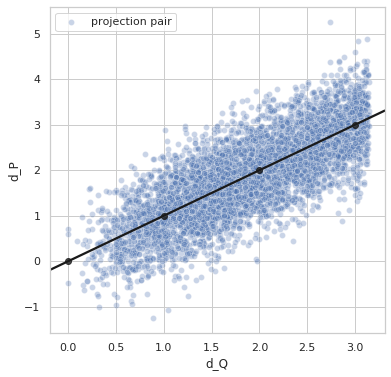

<Figure size 432x288 with 0 Axes>

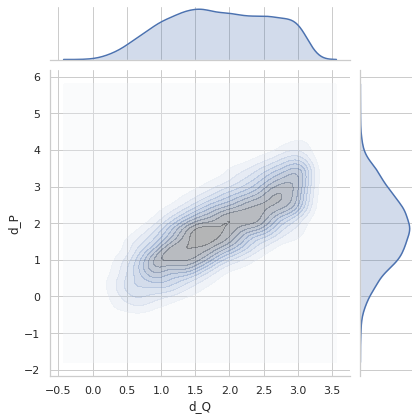

In [62]:
plot_dP_dQ(dP_values, dQ_values);
plot_dP_dQ_density(dP_values, dQ_values);

## Angle Recovery

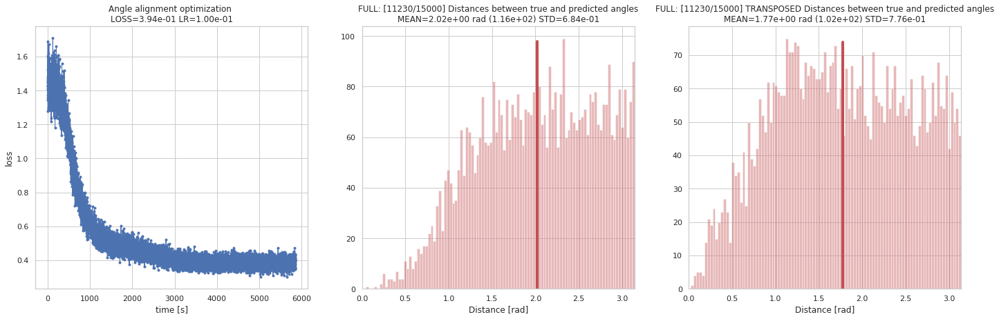

step 1500/15000 (819s): loss = 7.50e-01
step 3000/15000 (1593s): loss = 5.35e-01
step 4500/15000 (2370s): loss = 4.39e-01
step 6000/15000 (3135s): loss = 3.88e-01
step 7500/15000 (3915s): loss = 4.11e-01
step 9000/15000 (4686s): loss = 3.53e-01
step 10500/15000 (5467s): loss = 3.68e-01



In [20]:
q_predicted = train_angle_recovery(steps=15000, 
                                 batch_size=512, 
                                 projection_idx=range(NUM_PROJECTIONS), 
                                 in_data=angles_true, 
                                 distance_fn=d_p, 
                                 learning_rate=0.1, 
                                 optimization=True)

In [21]:
q_save = np.zeros((len(q_predicted),4))
for i, q in enumerate(q_predicted):
    q_save[i] = q.numpy()
                    
np.save("data/5a1a/predicted_quaternions_var0.6.npy", q_save)

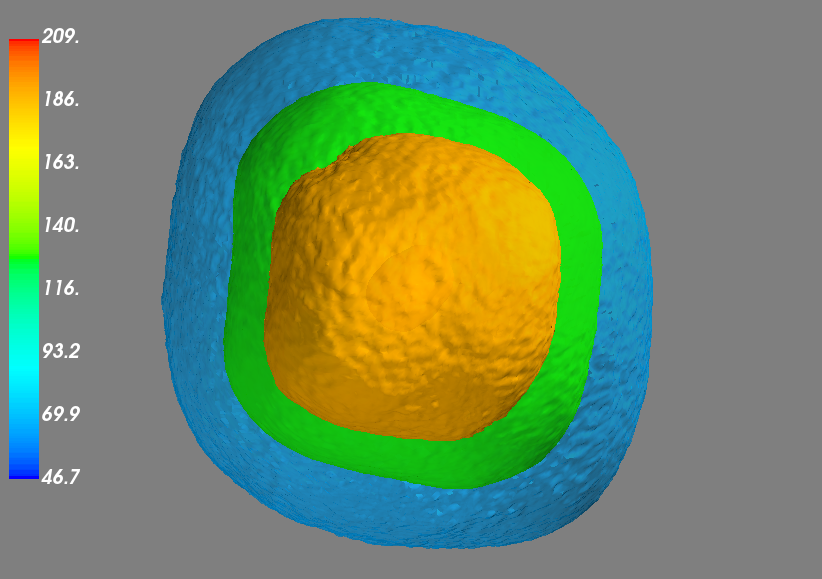

In [113]:
Image(filename='../3-reconstruction/data/5a1a_projections_and_angles_predicted_var06.png')

## Angle Recovery

In [78]:
qp = np.load("data/5a1a/predicted_quaternions_var0.6.npy")

transposed = True
ap = quaternion2euler(qp, transposed=transposed)

np.save("data/5a1a/predicted_angles_var06.npy", ap)

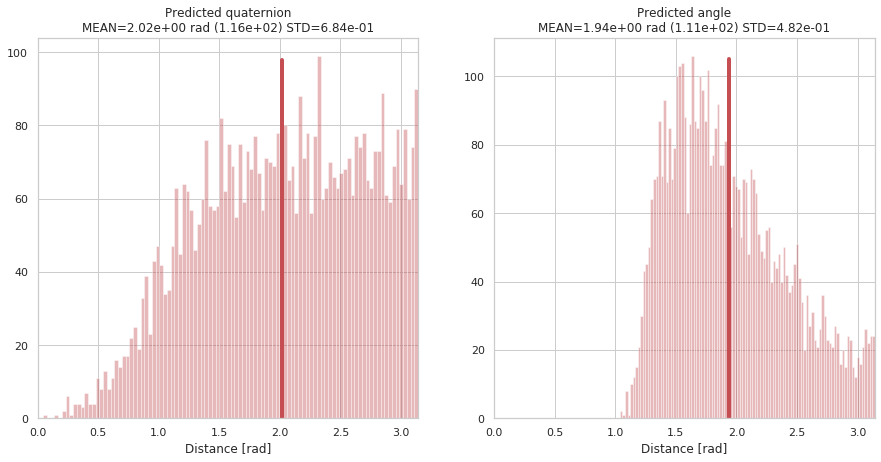

In [79]:
# check: both plots should be the same
fig, axs = plt.subplots(1, 2, figsize=(15,7))
d2 = d_q(euler2quaternion(angles_true), qp)
axs[0].set_xlim(0, np.pi)
axs[0].set_title(f"Predicted quaternion\nMEAN={np.mean(d2):.2e} rad ({np.degrees(np.mean(d2)):.2e}) STD={np.std(d2):.2e}")
s = sns.distplot(d2, kde=False, bins=100, ax=axs[0], axlabel="Distance [rad]", color="r")
max_count = int(max([h.get_height() for h in s.patches]))
axs[0].plot([np.mean(d2)]*max_count, np.arange(0, max_count,1), c="r", lw=4)

d3 = d_q(euler2quaternion(angles_true), euler2quaternion(ap))
axs[1].set_xlim(0, np.pi)
axs[1].set_title(f"Predicted angle\nMEAN={np.mean(d3):.2e} rad ({np.degrees(np.mean(d3)):.2e}) STD={np.std(d3):.2e}")
s = sns.distplot(d3, kde=False, bins=100, ax=axs[1], axlabel="Distance [rad]", color="r")
max_count = int(max([h.get_height() for h in s.patches]))
axs[1].plot([np.mean(d3)]*max_count, np.arange(0, max_count,1), c="r", lw=4)

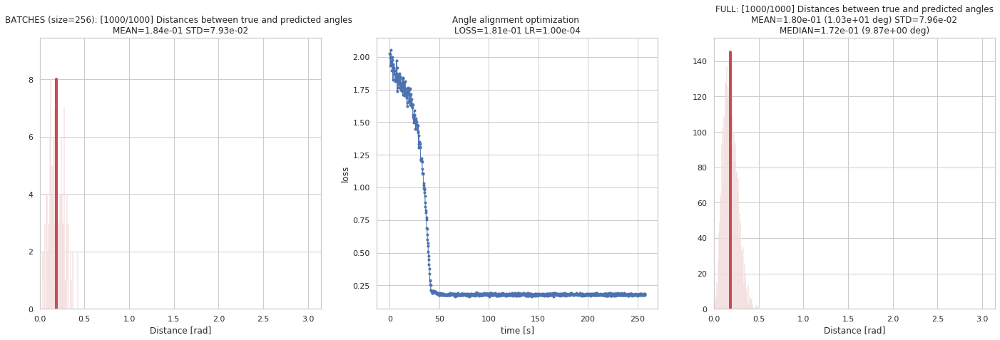

step 100/1000 (26s): loss = 1.78e+00
step 200/1000 (53s): loss = 7.01e-01
step 300/1000 (78s): loss = 1.81e-01
step 400/1000 (103s): loss = 1.81e-01
step 500/1000 (129s): loss = 1.80e-01
step 600/1000 (156s): loss = 1.80e-01
step 700/1000 (182s): loss = 1.80e-01
step 800/1000 (208s): loss = 1.81e-01
step 900/1000 (234s): loss = 1.81e-01
step 1000/1000 (259s): loss = 1.80e-01



In [81]:
m, rotation, loss = training_angle_alignment(m=[1.0, 1.0, 1.0, 1.0],
                                             steps=1000, 
                                             batch_size=256, 
                                             projection_idx=range(NUM_PROJECTIONS), 
                                             learning_rate=0.01, 
                                             angles_true=angles_true, 
                                             angles_predicted=ap)

In [82]:
m, rotation[0].numpy(), loss

([1.0, 1.0, 1.0, 1.0],
 array([ 1.16661852, -0.23406087,  3.68412036,  3.5040311 ,  6.01248325,
         2.60141596]),
 0.1797435845221017)

In [83]:
qpn = euler2quaternion(ap)

qpa = update_quaternion(m=m, 
                        a_R=rotation, 
                        q_predicted=qpn)

angles_predicted = quaternion2euler(qpa).numpy()

np.save("data/5a1a/predicted_angles_var06_updated.npy", angles_predicted)

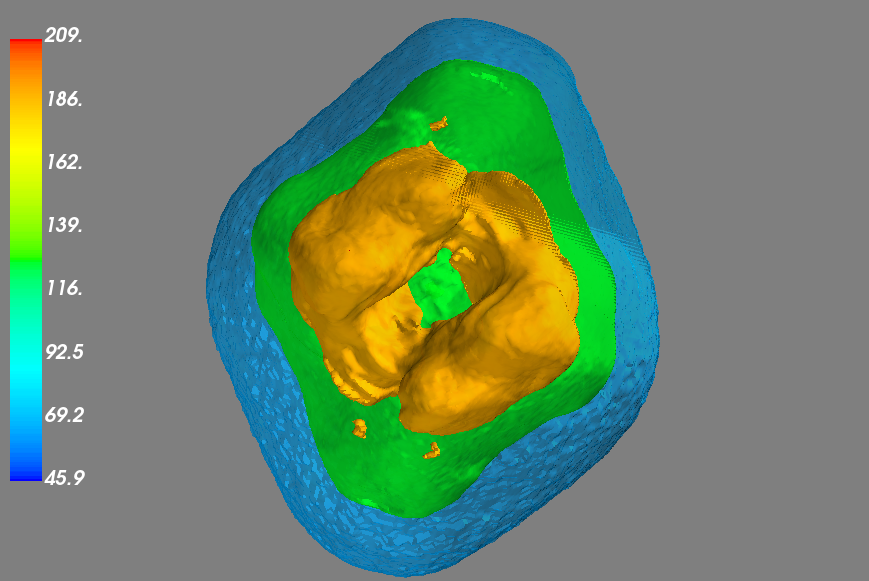

In [114]:
Image(filename='../3-reconstruction/data/5a1a_projections_and_angles_predicted_var06_updated.png')

---

## 1.3.9. Angle Recovery: Variance 0.7

#### dP/dQ plot

In [85]:
def d_p(in1, in2):
    dist = d_q(in1, in2)
    norm_distr = tf.random.normal(shape=dist.shape, mean=dist, stddev=0.7, dtype=tf.float64)
    return norm_distr  

In [86]:
idx1 = list(np.random.choice(range(NUM_PROJECTIONS), size=5000))
idx2 = list(np.random.choice(range(NUM_PROJECTIONS), size=5000))

q1_true = euler2quaternion([angles_true[i] for i in idx1])
q2_true = euler2quaternion([angles_true[i] for i in idx2])

dP_values = d_p(q1_true, q2_true)
dQ_values = d_q(q1_true, q2_true)

<Figure size 432x288 with 0 Axes>

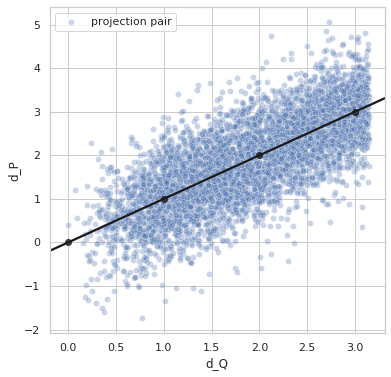

<Figure size 432x288 with 0 Axes>

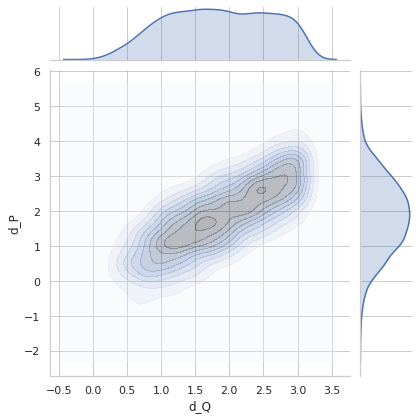

In [87]:
plot_dP_dQ(dP_values, dQ_values);
plot_dP_dQ_density(dP_values, dQ_values);

## Angle Recovery

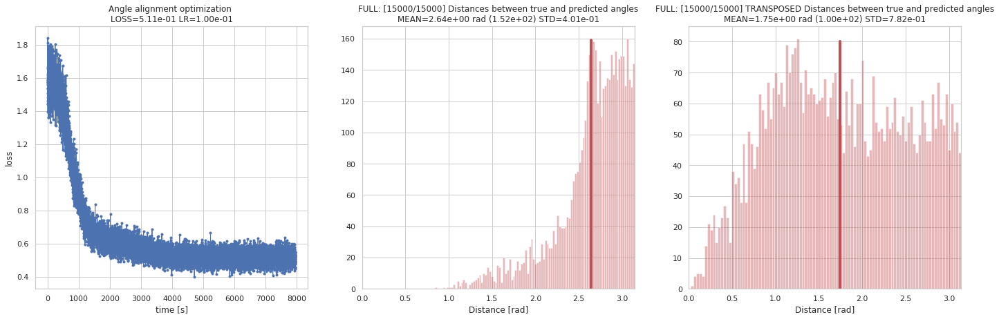

step 1500/15000 (837s): loss = 1.04e+00
step 3000/15000 (1616s): loss = 6.81e-01
step 4500/15000 (2388s): loss = 6.22e-01
step 6000/15000 (3154s): loss = 5.52e-01
step 7500/15000 (3927s): loss = 4.93e-01
step 9000/15000 (4704s): loss = 5.31e-01
step 10500/15000 (5488s): loss = 5.15e-01
step 12000/15000 (6286s): loss = 4.80e-01
step 13500/15000 (7096s): loss = 5.26e-01
step 15000/15000 (7948s): loss = 5.14e-01



In [25]:
q_predicted = train_angle_recovery(steps=15000, 
                                 batch_size=512, 
                                 projection_idx=range(NUM_PROJECTIONS), 
                                 in_data=angles_true, 
                                 distance_fn=d_p, 
                                 learning_rate=0.1, 
                                 optimization=True)

In [26]:
q_save = np.zeros((len(q_predicted),4))
for i, q in enumerate(q_predicted):
    q_save[i] = q.numpy()
                    
np.save("data/5a1a/predicted_quaternions_var0.7.npy", q_save)

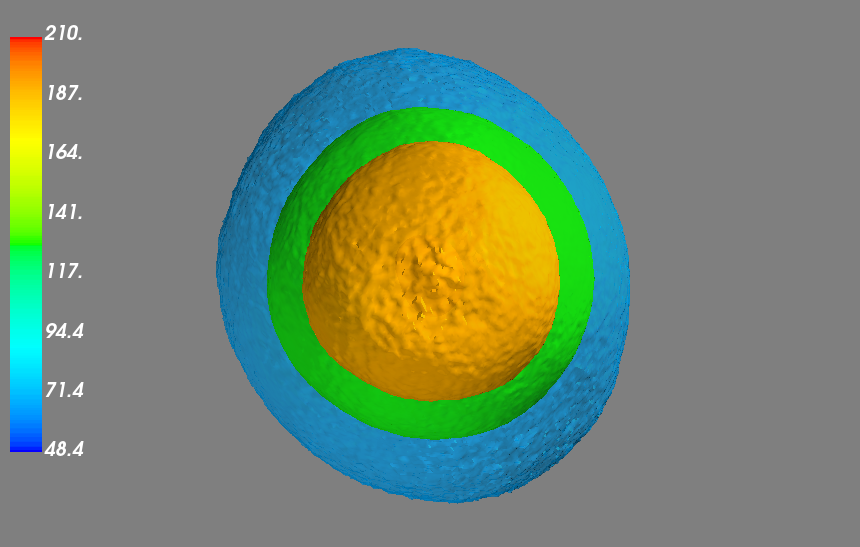

In [115]:
Image(filename='../3-reconstruction/data/5a1a_projections_and_angles_predicted_var07.png')

## Angle Alignment

In [88]:
qp = np.load("data/5a1a/predicted_quaternions_var0.7.npy")

transposed = False
ap = quaternion2euler(qp, transposed=transposed)

np.save("data/5a1a/predicted_angles_var07.npy", ap)

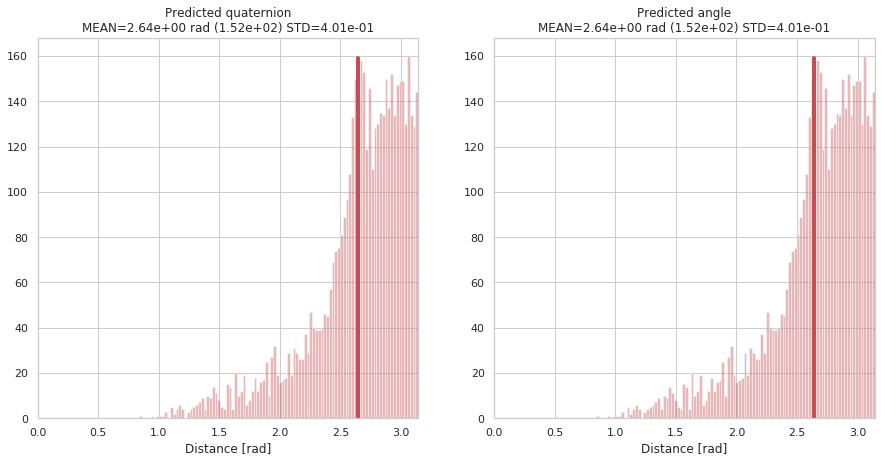

In [89]:
# check: both plots should be the same
fig, axs = plt.subplots(1, 2, figsize=(15,7))
d2 = d_q(euler2quaternion(angles_true), qp)
axs[0].set_xlim(0, np.pi)
axs[0].set_title(f"Predicted quaternion\nMEAN={np.mean(d2):.2e} rad ({np.degrees(np.mean(d2)):.2e}) STD={np.std(d2):.2e}")
s = sns.distplot(d2, kde=False, bins=100, ax=axs[0], axlabel="Distance [rad]", color="r")
max_count = int(max([h.get_height() for h in s.patches]))
axs[0].plot([np.mean(d2)]*max_count, np.arange(0, max_count,1), c="r", lw=4)

d3 = d_q(euler2quaternion(angles_true), euler2quaternion(ap))
axs[1].set_xlim(0, np.pi)
axs[1].set_title(f"Predicted angle\nMEAN={np.mean(d3):.2e} rad ({np.degrees(np.mean(d3)):.2e}) STD={np.std(d3):.2e}")
s = sns.distplot(d3, kde=False, bins=100, ax=axs[1], axlabel="Distance [rad]", color="r")
max_count = int(max([h.get_height() for h in s.patches]))
axs[1].plot([np.mean(d3)]*max_count, np.arange(0, max_count,1), c="r", lw=4)

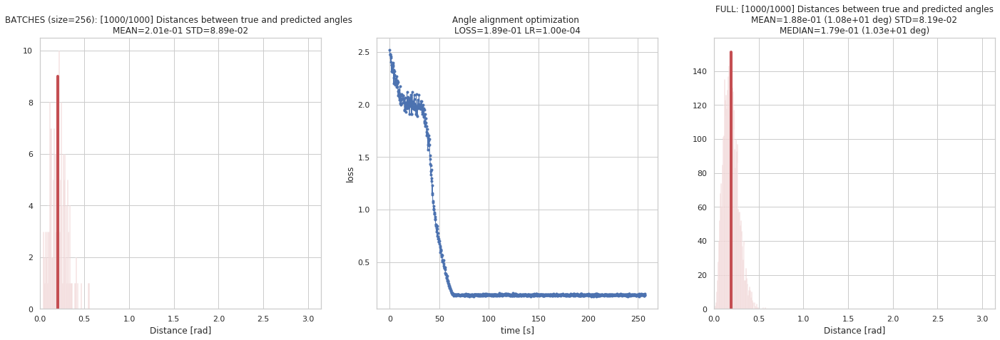

step 100/1000 (27s): loss = 2.13e+00
step 200/1000 (53s): loss = 1.50e+00
step 300/1000 (78s): loss = 2.75e-01
step 400/1000 (103s): loss = 1.87e-01
step 500/1000 (129s): loss = 1.89e-01
step 600/1000 (154s): loss = 1.88e-01
step 700/1000 (180s): loss = 1.88e-01
step 800/1000 (207s): loss = 1.88e-01
step 900/1000 (232s): loss = 1.88e-01
step 1000/1000 (259s): loss = 1.88e-01



In [90]:
m, rotation, loss = training_angle_alignment(m=[1.0, 1.0, 1.0, 1.0],
                                             steps=1000, 
                                             batch_size=256, 
                                             projection_idx=range(NUM_PROJECTIONS), 
                                             learning_rate=0.01, 
                                             angles_true=angles_true, 
                                             angles_predicted=ap)

In [91]:
m, rotation[0].numpy(), loss

([1.0, 1.0, 1.0, 1.0],
 array([ 0.36057764,  6.22891742, -0.28573232,  4.37619409,  3.51164054,
         1.86030152]),
 0.18793996521790746)

In [92]:
qpn = euler2quaternion(ap)

qpa = update_quaternion(m=m, 
                        a_R=rotation, 
                        q_predicted=qpn)

angles_predicted = quaternion2euler(qpa).numpy()

np.save("data/5a1a/predicted_angles_var07_updated.npy", angles_predicted)

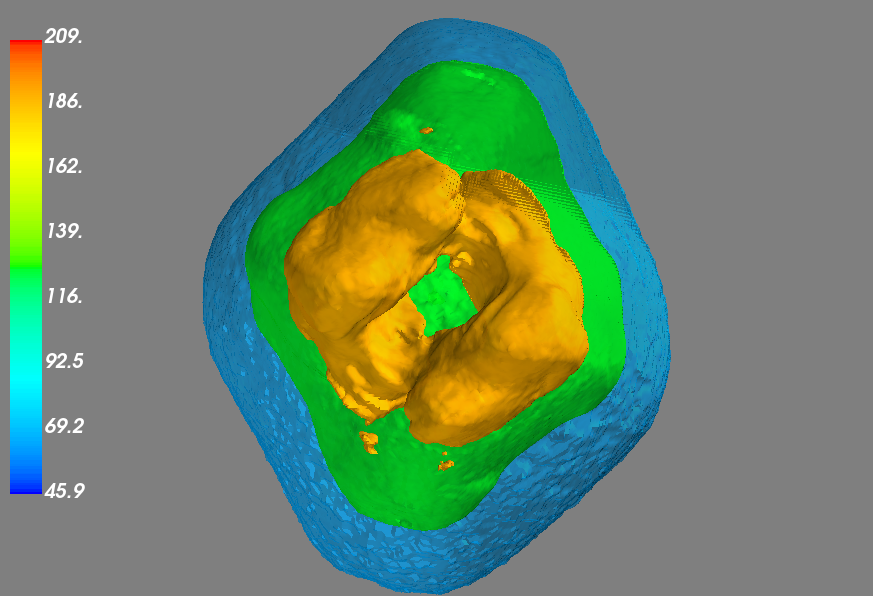

In [116]:

Image(filename='../3-reconstruction/data/5a1a_projections_and_angles_predicted_var07_updated.png')

---

## 1.3.10. Angle Recovery: Variance 0.8

#### dP/dQ plot

In [94]:
def d_p(in1, in2):
    dist = d_q(in1, in2)
    norm_distr = tf.random.normal(shape=dist.shape, mean=dist, stddev=0.8, dtype=tf.float64)
    return norm_distr  

In [95]:
idx1 = list(np.random.choice(range(NUM_PROJECTIONS), size=5000))
idx2 = list(np.random.choice(range(NUM_PROJECTIONS), size=5000))

q1_true = euler2quaternion([angles_true[i] for i in idx1])
q2_true = euler2quaternion([angles_true[i] for i in idx2])

dP_values = d_p(q1_true, q2_true)
dQ_values = d_q(q1_true, q2_true)

<Figure size 432x288 with 0 Axes>

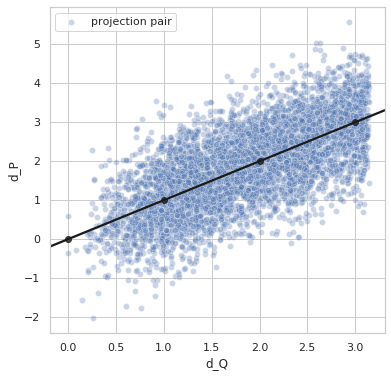

<Figure size 432x288 with 0 Axes>

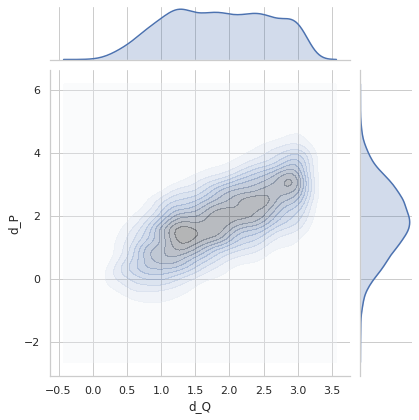

In [96]:
plot_dP_dQ(dP_values, dQ_values);
plot_dP_dQ_density(dP_values, dQ_values);

## Angle Recovery

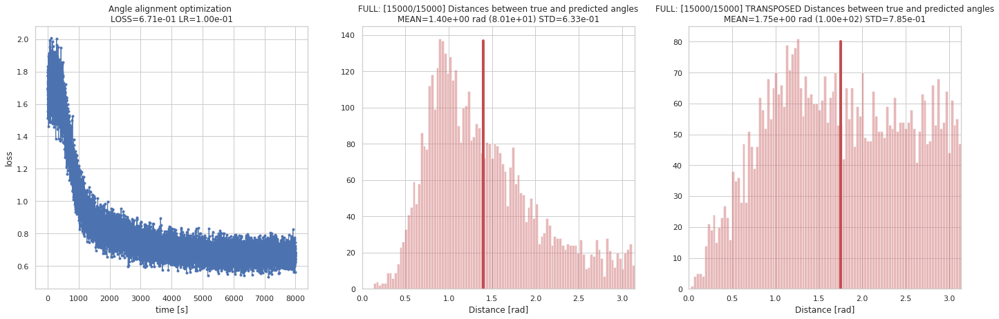

step 1500/15000 (752s): loss = 1.34e+00
step 3000/15000 (1576s): loss = 8.49e-01
step 4500/15000 (2368s): loss = 7.09e-01
step 6000/15000 (3144s): loss = 7.06e-01
step 7500/15000 (3923s): loss = 6.88e-01
step 9000/15000 (4723s): loss = 7.12e-01
step 10500/15000 (5513s): loss = 6.22e-01
step 12000/15000 (6324s): loss = 6.24e-01
step 13500/15000 (7170s): loss = 6.61e-01
step 15000/15000 (7993s): loss = 6.39e-01



In [30]:
q_predicted = train_angle_recovery(steps=15000, 
                                 batch_size=512, 
                                 projection_idx=range(NUM_PROJECTIONS), 
                                 in_data=angles_true, 
                                 distance_fn=d_p, 
                                 learning_rate=0.1, 
                                 optimization=True)

In [31]:
q_save = np.zeros((len(q_predicted),4))
for i, q in enumerate(q_predicted):
    q_save[i] = q.numpy()
                    
np.save("data/5a1a/predicted_quaternions_var0.8.npy", q_save)

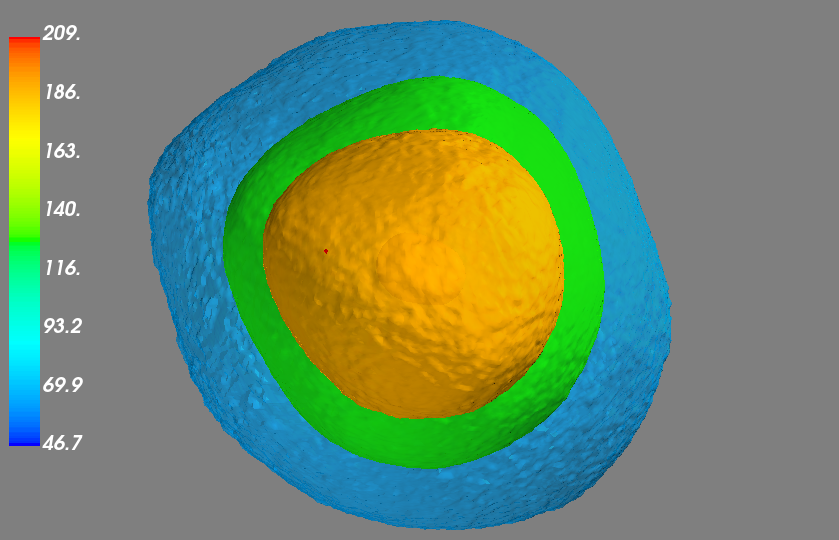

In [117]:
Image(filename='../3-reconstruction/data/5a1a_projections_and_angles_predicted_var08.png')

## Angle Alignment

In [102]:
qp = np.load("data/5a1a/predicted_quaternions_var0.8.npy")

transposed = True
ap = quaternion2euler(qp, transposed=transposed)

np.save("data/5a1a/predicted_angles_var08.npy", ap)

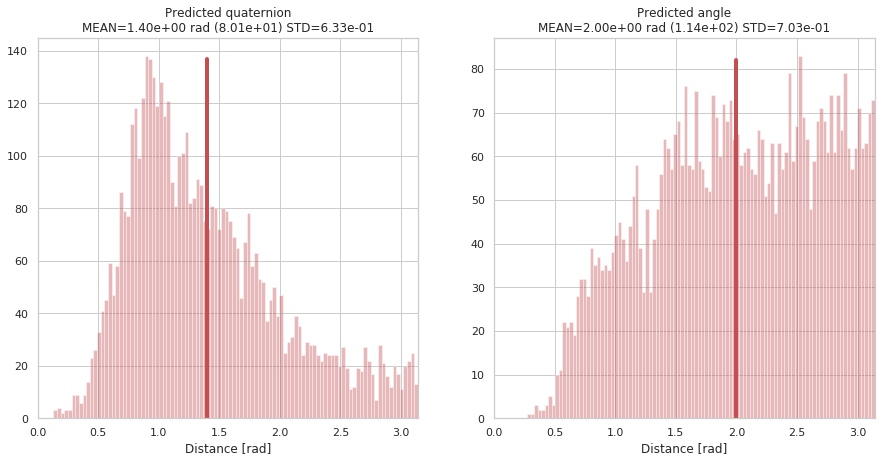

In [103]:
# check: both plots should be the same
fig, axs = plt.subplots(1, 2, figsize=(15,7))
d2 = d_q(euler2quaternion(angles_true), qp)
axs[0].set_xlim(0, np.pi)
axs[0].set_title(f"Predicted quaternion\nMEAN={np.mean(d2):.2e} rad ({np.degrees(np.mean(d2)):.2e}) STD={np.std(d2):.2e}")
s = sns.distplot(d2, kde=False, bins=100, ax=axs[0], axlabel="Distance [rad]", color="r")
max_count = int(max([h.get_height() for h in s.patches]))
axs[0].plot([np.mean(d2)]*max_count, np.arange(0, max_count,1), c="r", lw=4)

d3 = d_q(euler2quaternion(angles_true), euler2quaternion(ap))
axs[1].set_xlim(0, np.pi)
axs[1].set_title(f"Predicted angle\nMEAN={np.mean(d3):.2e} rad ({np.degrees(np.mean(d3)):.2e}) STD={np.std(d3):.2e}")
s = sns.distplot(d3, kde=False, bins=100, ax=axs[1], axlabel="Distance [rad]", color="r")
max_count = int(max([h.get_height() for h in s.patches]))
axs[1].plot([np.mean(d3)]*max_count, np.arange(0, max_count,1), c="r", lw=4)

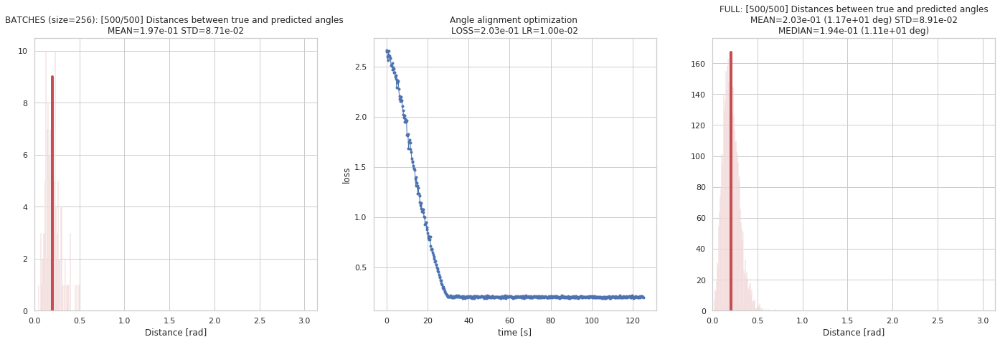

step 50/500 (12s): loss = 2.23e+00
step 100/500 (25s): loss = 9.95e-01
step 150/500 (38s): loss = 2.52e-01
step 200/500 (51s): loss = 2.04e-01
step 250/500 (63s): loss = 2.03e-01
step 300/500 (76s): loss = 2.04e-01
step 350/500 (89s): loss = 2.03e-01
step 400/500 (101s): loss = 2.02e-01
step 450/500 (114s): loss = 2.01e-01
step 500/500 (127s): loss = 2.04e-01



In [104]:
m, rotation, loss = training_angle_alignment(m=[1.0, 1.0, 1.0, 1.0],
                                             steps=500, 
                                             batch_size=256, 
                                             projection_idx=range(NUM_PROJECTIONS), 
                                             learning_rate=0.01, 
                                             angles_true=angles_true, 
                                             angles_predicted=ap)

In [105]:
m, rotation[0].numpy(), loss

([1.0, 1.0, 1.0, 1.0],
 array([1.39287521, 2.90224078, 2.94363753, 2.47309412, 6.00740501,
        3.32415168]),
 0.20363426068048512)

In [106]:
qpn = euler2quaternion(ap)

qpa = update_quaternion(m=m, 
                        a_R=rotation, 
                        q_predicted=qpn)

angles_predicted = quaternion2euler(qpa).numpy()

np.save("data/5a1a/predicted_angles_var08_updated.npy", angles_predicted)

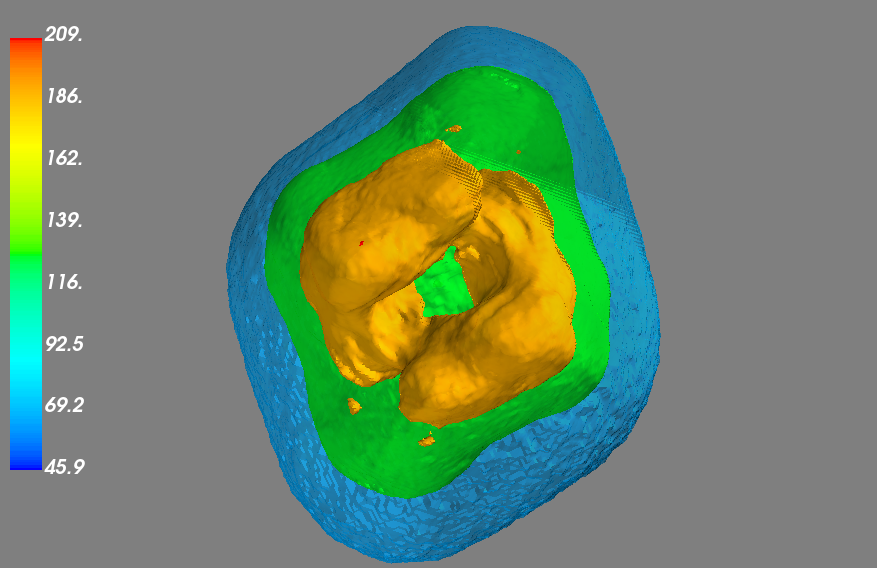

In [118]:
Image(filename='../3-reconstruction/data/5a1a_projections_and_angles_predicted_var08_updated.png')

---

# 2. Asymmetric Protein (5J0N)

Data used:
- Protein: 5j0n (asymmetric protein)
- Projections: 5K
- Coverage: Half-sphere

![](figures/5j0n.pdb1-500.jpg)

---

# 2.1. Experiment Summary

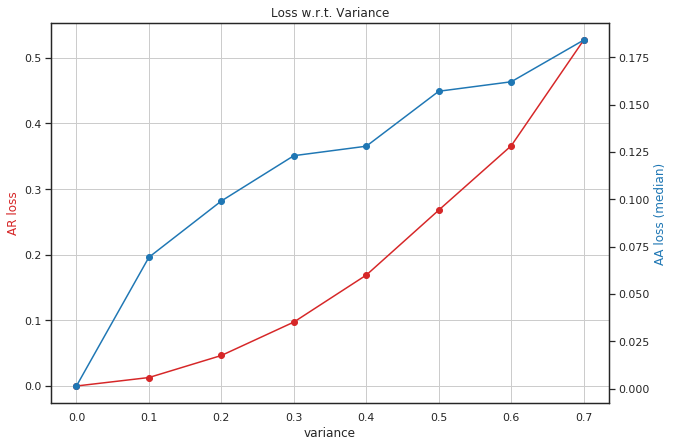

In [6]:
# losses
variances = [0.0, 
             0.1, 
             0.2, 
             0.3, 
             0.4, 
             0.5, 
             0.6, 
             0.7, 
             #0.8
            ]
losses = np.array([9.26e-09, 
                   1.29e-02, 
                   4.65e-02, 
                   9.74e-02, 
                   1.69e-01, 
                   2.68e-01, 
                   3.66e-01, 
                   5.27e-01, 
                   #6.39e-01
                  ])
# mean
#aa_losses = np.array([2.49e-03, 7.23e-02, 1.06e-01, 1.26e-01, 1.45e-01, 1.62e-01, 1.80e-01, 1.88e-01, 2.04e-1])
# median
aa_losses = np.array([1.47e-03, 
                      6.94e-02, 
                      9.91e-02, 
                      1.23e-01, 
                      1.28e-01, 
                      1.57e-01, 
                      1.62e-01, 
                      1.84e-01, 
                      #1.94e-01
                     ])

fig, ax = plt.subplots(1, 1, figsize=(10,7))
ax.plot(variances, losses, marker="o", color='tab:red')
ax.set(xlabel='variance', title='Loss w.r.t. Variance')
ax.set_ylabel(f'AR loss', color='tab:red')
ax.grid()

ax2 = ax.twinx()
ax2.plot(variances, aa_losses, marker="o", color='tab:blue')
ax2.set_ylabel(f'AA loss (median)', color='tab:blue')

#fig.savefig("test.png")
plt.show()

# 2.2. Data Preparation

In [5]:
PROTEIN="5j0n"
ROOT_DIR = "../.."
NUM_PROJECTIONS = 5000

# location of *.h5 files
data_dir = f"/mnt/scratch/students/"

# half coverage (AngCoverage=0.5)
projections_filename = f"{PROTEIN}_ProjectionsAngles_ProjNber5000_AngCoverage2.0,0.4,2.0_AngShift0.0,0.0,0.0.h5"

# load structures
data = h5py.File(os.path.join(data_dir, projections_filename), 'r')

print(f"{data['Projections'].shape[0]} projections of images with dimension {data['Projections'].shape[1:]} pixels")
print(f"{data['Angles'].shape[0]} sets of {data['Angles'].shape[1]} ground truth angles of corresponding projection images")

5000 projections of images with dimension (116, 116) pixels
5000 sets of 3 ground truth angles of corresponding projection images


#### Projections

In [6]:
projections = data['Projections']

#### True Angles

(5000, 3)


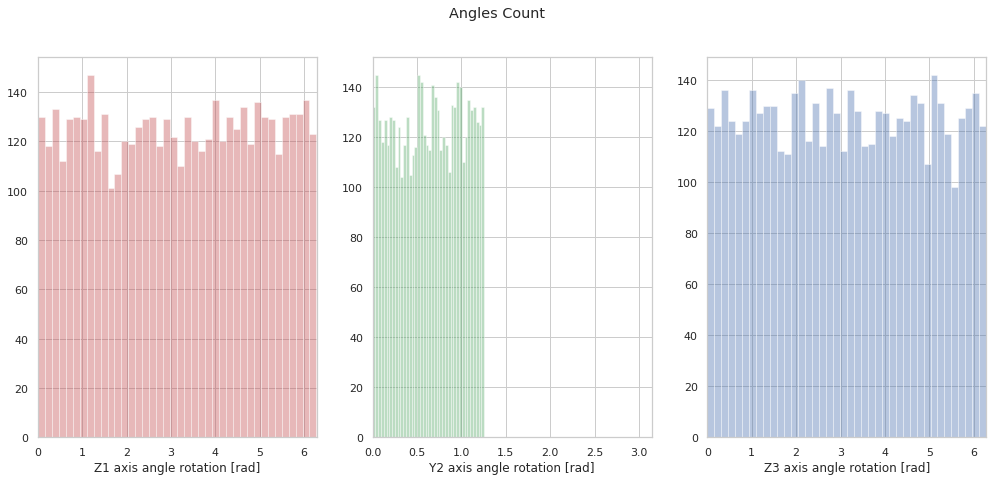

In [7]:
angles_true = np.array(data['Angles'])
print(angles_true.shape)
plot_angles_count(angles_true)

---

# 2.3. Experiments

## 2.3.1. Angle Recovery: Perfect Distance

#### dP/dQ plot

In [16]:
from cryoem.conversions import euler2quaternion, d_q

In [17]:
def d_p(in1, in2):
    return d_q(in1, in2)

In [18]:
idx1 = list(np.random.choice(range(NUM_PROJECTIONS), size=1000))
idx2 = list(np.random.choice(range(NUM_PROJECTIONS), size=1000))

q1_true = euler2quaternion([angles_true[i] for i in idx1])
q2_true = euler2quaternion([angles_true[i] for i in idx2])

dP_values = d_p(q1_true, q2_true)
dQ_values = d_q(q1_true, q2_true)

<Figure size 432x288 with 0 Axes>

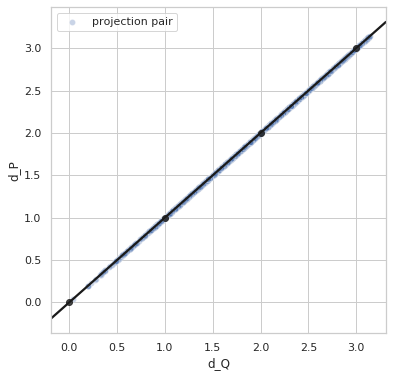

<Figure size 432x288 with 0 Axes>

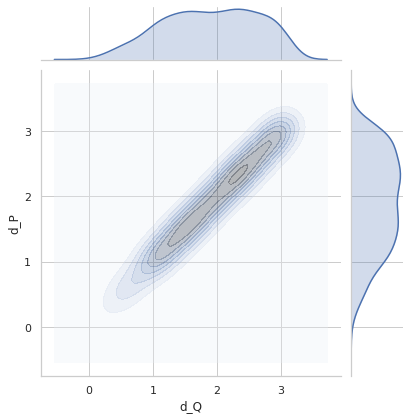

Variance = 0.0
Min. angle recovery loss possible = 0.0


In [21]:
plot_dP_dQ(dP_values, dQ_values);

In [22]:
# variance
np.sqrt(1/(len(dQ_values)-1)*np.sum(np.power(dP_values-dQ_values, 2)))

0.0

In [23]:
def loss(dQ_values, dP_values):
    # The mean doesn't depend on the batch size.
    return tf.reduce_mean(tf.pow((dQ_values - dP_values), 2))

In [24]:
loss(dQ_values, dP_values).numpy()

0.0

## Angle Recovery

In [28]:
from cryoem.angle_recovery import train_angle_recovery

In [29]:
data = np.load(f"data/5j0n_siamese_idx.npz")
train_idx, val_idx, test_idx = data["arr_0"], data["arr_1"], data["arr_2"]

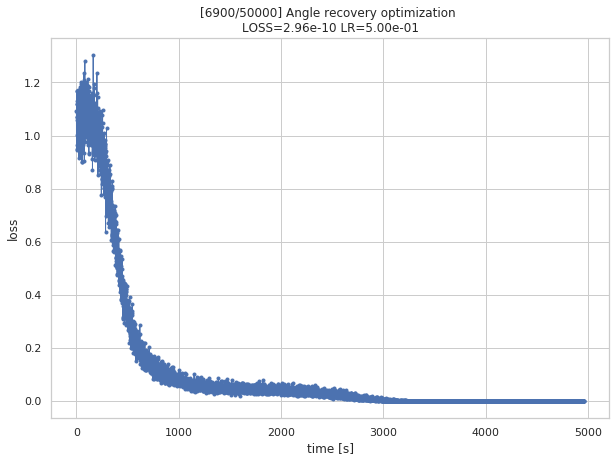

Shape of projections: (1650, 4)step 5000/50000 (3591s): loss = 2.66e-05
step 6900/50000 (4958s): loss = 1.98e-09



In [30]:
q_predicted, losses, q_all = train_angle_recovery(steps=50000, 
                             batch_size=256, 
                             in_data=angles_true[test_idx], 
                             #angles_true=angles_true[test_idx]
                             distance_fn=d_p, 
                             learning_rate=0.5, 
                             limit_distance=np.pi,
                             high_ang_const=[2.0, 0.4, 2.0],
                             file_name="/mnt/scratch/students/angle_recovery_5j0n_perfect")

In [33]:
from cryoem.conversions import quaternion2euler
import matplotlib.pyplot as plt

In [34]:
data = np.load("/mnt/scratch/students/angle_recovery_5j0n_perfect.npz")
q_predicted, losses, q_all = data["arr_0"], data["arr_1"], data["arr_2"]

angles_predicted = quaternion2euler(q_predicted)

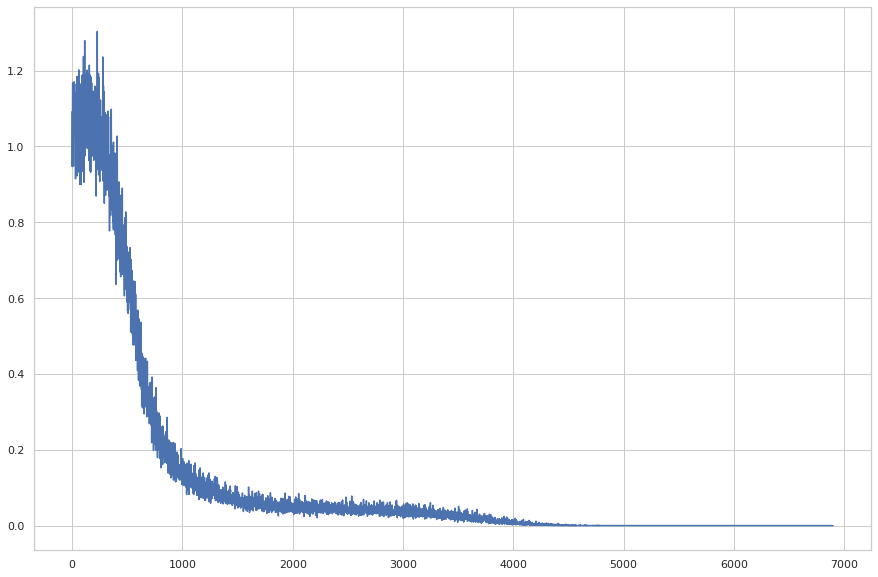

In [35]:
import seaborn as sns; sns.set(style="whitegrid", color_codes=True)
fig, ax = plt.subplots(figsize=(15,10))
plt.plot(losses[losses !=0])#[losses>1e-6])
plt.show()

In [36]:
#np.save("data/5j0n/projections_limited2.5_estimated_50k", projections)
#np.save("data/5j0n/angles_true_limited2.5_estimated_50k", angles_true)
np.save("/mnt/scratch/students/angles_predicted_5a1a_perfect", angles_predicted)

## Angle Alignment

In [38]:
from cryoem.angle_alignment import training_angle_alignment, update_quaternion
from tensorflow.keras.optimizers import Adagrad, Ftrl

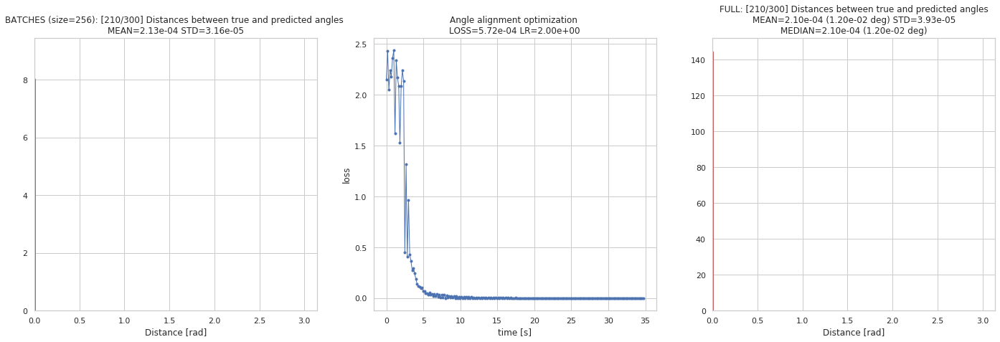

step 30/300 (5s): loss = 1.29e+00
step 60/300 (10s): loss = 2.80e-02
step 90/300 (15s): loss = 5.84e-03
step 120/300 (21s): loss = 2.56e-03
step 150/300 (26s): loss = 1.39e-03
step 180/300 (31s): loss = 9.17e-04
step 210/300 (36s): loss = 6.18e-04



In [40]:
m, a_R, losses, collect_data, trajectory = training_angle_alignment(num_runs=3, 
                                                        steps=300, 
                                                        batch_size=256, 
                                                        optimizer=Ftrl(learning_rate=2., learning_rate_power=-2.), 
                                                        angles_true=angles_true[test_idx], 
                                                        angles_predicted=angles_predicted)

In [58]:
trajectory = trajectory[trajectory[:,0]!=0]
losses = losses[:len(trajectory)-1]

In [59]:
m = m
trajectory_first = trajectory[0]
loss_first = losses[0]
trajectory_last = trajectory[-1]
loss_last = losses[-1]

In [61]:
m, trajectory_first, loss_first, trajectory_last, loss_last

([1.0, 1.0, 1.0, -1.0],
 array([2.47563219, 5.69811954, 0.95310088, 4.90004713, 1.99233072,
        0.12931273]),
 2.1487225317189007,
 array([-4.66935956e+01,  4.34691197e+01,  8.62449480e+00,  1.27628528e+01,
         3.60803354e-03,  6.73013414e+00]),
 0.00020451586345109828)

In [43]:
q_predicted_rotated =  update_quaternion(m, a_R, q_predicted)

angles_predicted_rotated = quaternion2euler(q_predicted_rotated)

np.save("data/5j0n/angles_predicted_5a1a_perfect", angles_predicted_rotated)

In [44]:
from cryoem.plots import plot_iterations_polar_plot, plot_iterations_rotvec

In [ ]:
plot_iterations_polar_plot(collect_data, angles_true[test_idx], interval=200, connections=False, selected=None)

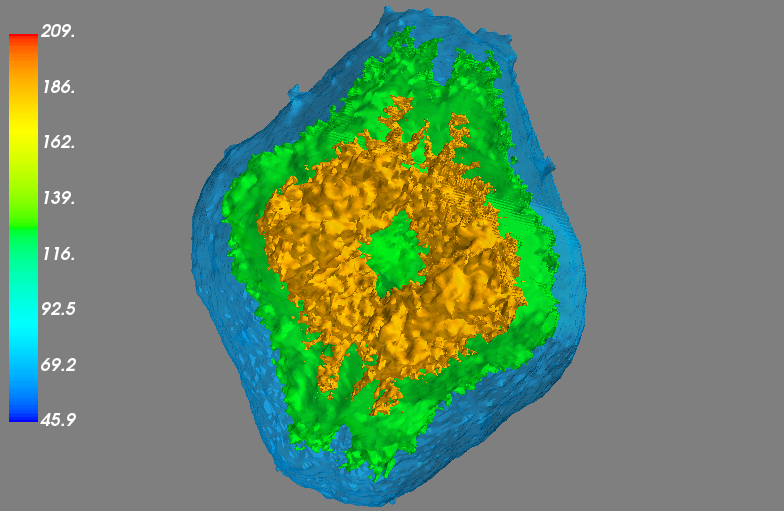

In [54]:
Image(filename='../3-reconstruction/data/5j0n_projections_and_angles_predicted_updated.png')

---

## 2.3.2. Angle Recovery: Variance 0.0

#### dP/dQ plot

In [20]:
def d_p(in1, in2):
    dist = d_q(in1, in2)
    norm_distr = tf.random.normal(shape=dist.shape, mean=dist, stddev=0.0, dtype=tf.float64)
    return norm_distr  

In [21]:
idx1 = list(np.random.choice(range(NUM_PROJECTIONS), size=5000))
idx2 = list(np.random.choice(range(NUM_PROJECTIONS), size=5000))

q1_true = euler2quaternion([angles_true[i] for i in idx1])
q2_true = euler2quaternion([angles_true[i] for i in idx2])

dP_values = d_p(q1_true, q2_true)#.T[0]
dQ_values = d_q(q1_true, q2_true)#.numpy()

<Figure size 432x288 with 0 Axes>

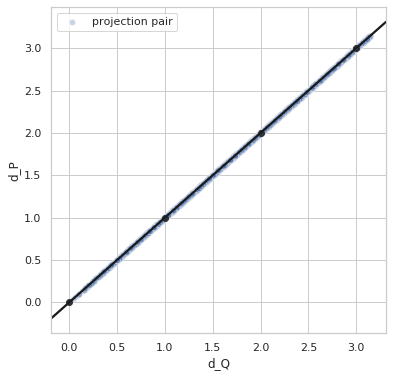

<Figure size 432x288 with 0 Axes>

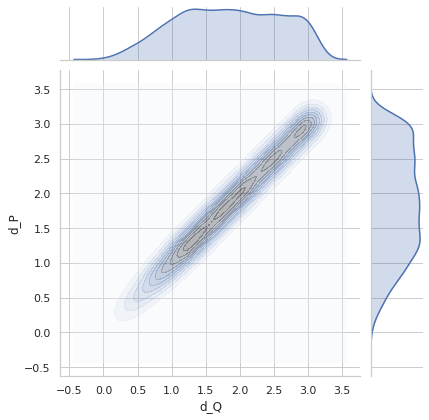

In [22]:
plot_dP_dQ(dP_values, dQ_values);
plot_dP_dQ_density(dP_values, dQ_values);

## Angle Recovery

Perfect distances. Learning rate 0.01

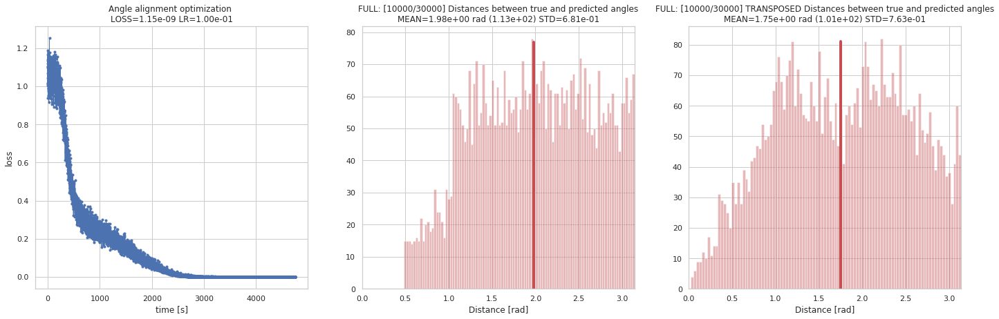

step 3000/30000 (1445s): loss = 1.50e-01
step 6000/30000 (2859s): loss = 1.25e-03
step 9000/30000 (4278s): loss = 9.26e-09



In [29]:
q_predicted = train_angle_recovery(steps=30000, 
                                 batch_size=512, 
                                 projection_idx=range(NUM_PROJECTIONS), 
                                 in_data=angles_true, 
                                 distance_fn=d_p, 
                                 learning_rate=0.1, 
                                 optimization=True)

In [30]:
q_save = np.zeros((len(q_predicted),4))
for i, q in enumerate(q_predicted):
    q_save[i] = q.numpy()
                    
np.save("data/5j0n/predicted_quaternions_var0.0.npy", q_save)

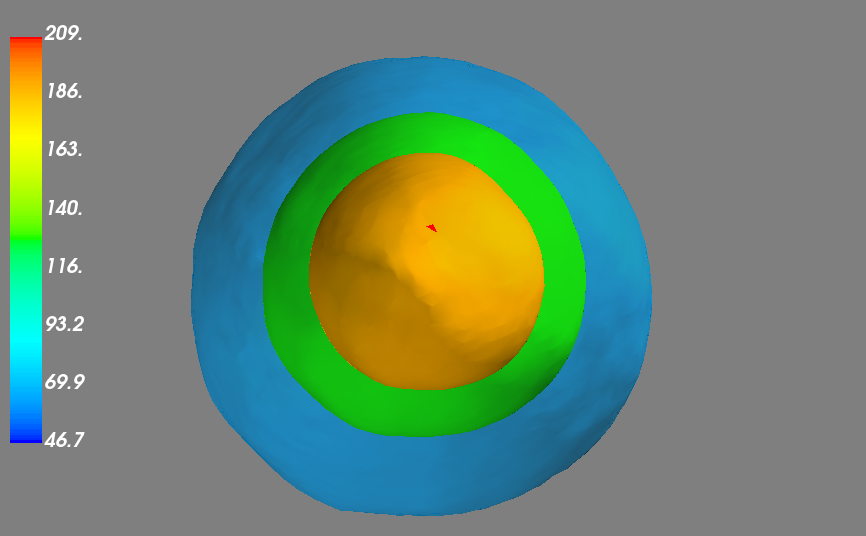

In [6]:
Image(filename='../3-reconstruction/data/5j0n_projections_and_angles_predicted_var00.png')

## Angle Alignment

In [23]:
# NO TRANSPOSITION - left plot = not transposed, right plot = transposed
qp = np.load("data/5j0n/predicted_quaternions_var0.0.npy")

transposed = False
ap = quaternion2euler(qp, transposed=transposed)

np.save("data/5j0n/predicted_angles_var00.npy", ap)

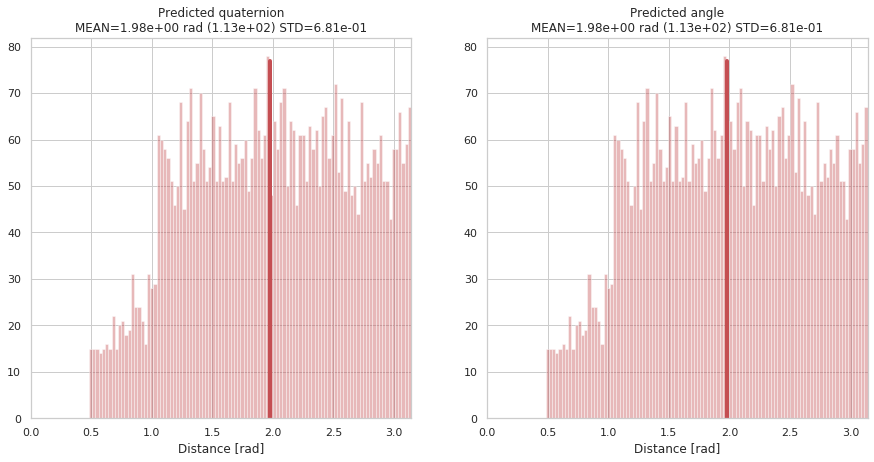

In [24]:
# check: both plots should be the same (if transposed=False)
fig, axs = plt.subplots(1, 2, figsize=(15,7))
d2 = d_q(euler2quaternion(angles_true), qp)
axs[0].set_xlim(0, np.pi)
axs[0].set_title(f"Predicted quaternion\nMEAN={np.mean(d2):.2e} rad ({np.degrees(np.mean(d2)):.2e}) STD={np.std(d2):.2e}")
s = sns.distplot(d2, kde=False, bins=100, ax=axs[0], axlabel="Distance [rad]", color="r")
max_count = int(max([h.get_height() for h in s.patches]))
axs[0].plot([np.mean(d2)]*max_count, np.arange(0, max_count,1), c="r", lw=4)

d3 = d_q(euler2quaternion(angles_true), euler2quaternion(ap))
axs[1].set_xlim(0, np.pi)
axs[1].set_title(f"Predicted angle\nMEAN={np.mean(d3):.2e} rad ({np.degrees(np.mean(d3)):.2e}) STD={np.std(d3):.2e}")
s = sns.distplot(d3, kde=False, bins=100, ax=axs[1], axlabel="Distance [rad]", color="r")
max_count = int(max([h.get_height() for h in s.patches]))
axs[1].plot([np.mean(d3)]*max_count, np.arange(0, max_count,1), c="r", lw=4)

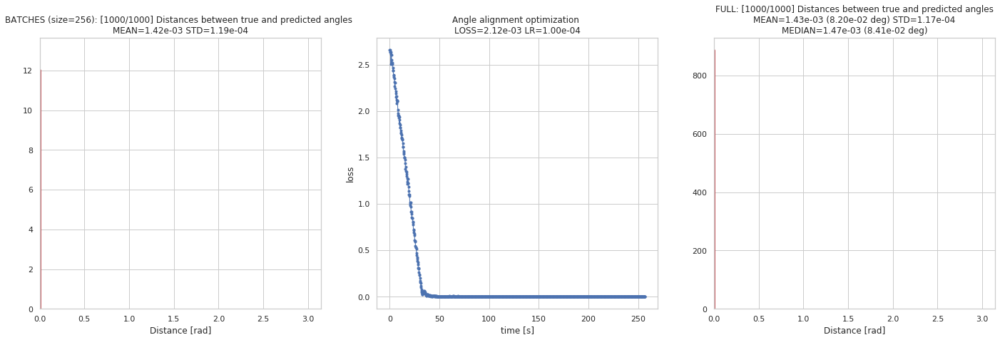

step 100/1000 (26s): loss = 1.68e+00
step 200/1000 (52s): loss = 9.46e-02
step 300/1000 (79s): loss = 2.85e-03
step 400/1000 (105s): loss = 2.54e-03
step 500/1000 (131s): loss = 2.32e-03
step 600/1000 (156s): loss = 2.22e-03
step 700/1000 (181s): loss = 2.19e-03
step 800/1000 (207s): loss = 2.14e-03
step 900/1000 (233s): loss = 1.97e-03
step 1000/1000 (259s): loss = 2.14e-03



In [26]:
m, rotation, loss = training_angle_alignment(m=[1.0, 1.0, 1.0, 1.0],
                                             steps=1000, 
                                             batch_size=256, 
                                             projection_idx=range(NUM_PROJECTIONS), 
                                             learning_rate=0.01, 
                                             angles_true=angles_true, 
                                             angles_predicted=ap)

In [27]:
m, rotation[0].numpy(), loss

([1.0, 1.0, 1.0, 1.0],
 array([ 2.37164688,  3.61378001, -0.03943844, -0.45158427,  6.14423459,
         2.15595089]),
 0.0021408114319447)

In [28]:
qpn = euler2quaternion(ap)

qpa = update_quaternion(m=m, 
                        a_R=rotation, 
                        q_predicted=qpn)

angles_predicted = quaternion2euler(qpa).numpy()

np.save("data/5j0n/predicted_angles_var00_updated.npy", angles_predicted)

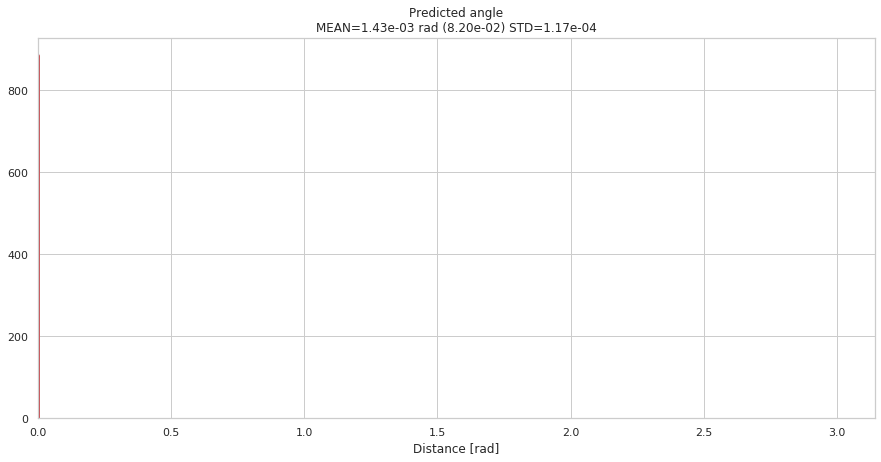

In [29]:
fig, axs = plt.subplots(1, 1, figsize=(15,7))

d3 = d_q(euler2quaternion(angles_true), euler2quaternion(angles_predicted))
axs.set_xlim(0, np.pi)
axs.set_title(f"Predicted angle\nMEAN={np.mean(d3):.2e} rad ({np.degrees(np.mean(d3)):.2e}) STD={np.std(d3):.2e}")
s = sns.distplot(d3, kde=False, bins=100, ax=axs, axlabel="Distance [rad]", color="r")
max_count = int(max([h.get_height() for h in s.patches]))
axs.plot([np.mean(d3)]*max_count, np.arange(0, max_count,1), c="r", lw=4)

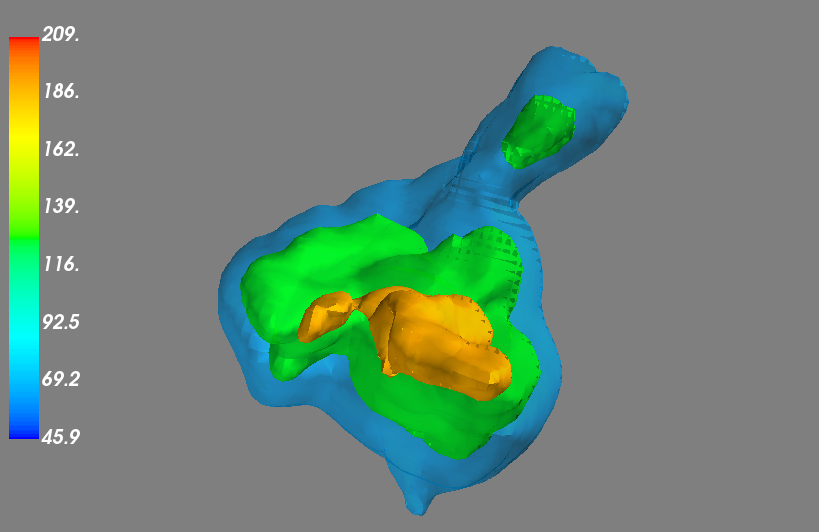

In [7]:
Image(filename='../3-reconstruction/data/5j0n_projections_and_angles_predicted_var00_updated.png')

In [14]:
# # check: both plots should be the same
# fig, axs = plt.subplots(1, 2, figsize=(15,7))
# d2 = d_q(euler2quaternion(angles_true), qpa)
# axs[0].set_xlim(0, np.pi)
# axs[0].set_title(f"Predicted quaternion\nMEAN={np.mean(d2):.2e} rad ({np.degrees(np.mean(d2)):.2e}) STD={np.std(d2):.2e}")
# s = sns.distplot(d2, kde=False, bins=100, ax=axs[0], axlabel="Distance [rad]", color="r")
# max_count = int(max([h.get_height() for h in s.patches]))
# axs[0].plot([np.mean(d2)]*max_count, np.arange(0, max_count,1), c="r", lw=4)

# d3 = d_q(euler2quaternion(angles_true), euler2quaternion(angles_predicted))
# axs[1].set_xlim(0, np.pi)
# axs[1].set_title(f"Predicted angle\nMEAN={np.mean(d3):.2e} rad ({np.degrees(np.mean(d3)):.2e}) STD={np.std(d3):.2e}")
# s = sns.distplot(d3, kde=False, bins=100, ax=axs[1], axlabel="Distance [rad]", color="r")
# max_count = int(max([h.get_height() for h in s.patches]))
# axs[1].plot([np.mean(d3)]*max_count, np.arange(0, max_count,1), c="r", lw=4)

In [15]:
# for i, a in enumerate(angles_predicted):
#     angles_predicted[i] = [a[0]%(2*np.pi), a[1]%(2*np.pi), a[2]%(2*np.pi)]

In [16]:
# sns.set(style="white", color_codes=True)
# sns.set(style="whitegrid")

# # for i, a in enumerate(ap):
# #     ap[i] = np.array([a[0]%(2*np.pi), a[1]%np.pi, a[2]%(2*np.pi)])

# fig, axs = plt.subplots(1, 3, figsize=(17,7))
# # axs[0].set_xlim(0,2*np.pi)
# # axs[1].set_xlim(0,np.pi)
# # axs[2].set_xlim(0,2*np.pi)
# plt.suptitle("Angles Count")

# sns.distplot(angles_predicted[:,0]-angles_true[:,0], kde=False, bins=40, ax=axs[0], axlabel="Z1 axis angle rotation [rad]", color="r")
# sns.distplot(angles_predicted[:,1]-angles_true[:,1], kde=False, bins=40, ax=axs[1], axlabel="Y2 axis angle rotation [rad]", color="g")
# sns.distplot(angles_predicted[:,2]-angles_true[:,2], kde=False, bins=40, ax=axs[2], axlabel="Z3 axis angle rotation [rad]", color="b")
# plt.show()

In [17]:
# np.save("data/predicted_angles_var00_updated.npy", angles_predicted)
# angles_predicted = np.load("data/predicted_angles_var00_updated.npy")
# angles_predicted

---

## 2.3.3. Angle Recovery: Variance 0.1

#### dP/dQ plot

In [37]:
def d_p(in1, in2):
    dist = d_q(in1, in2)
    norm_distr = tf.random.normal(shape=dist.shape, mean=dist, stddev=0.1, dtype=tf.float64)
    return norm_distr  

In [38]:
idx1 = list(np.random.choice(range(NUM_PROJECTIONS), size=5000))
idx2 = list(np.random.choice(range(NUM_PROJECTIONS), size=5000))

q1_true = euler2quaternion([angles_true[i] for i in idx1])
q2_true = euler2quaternion([angles_true[i] for i in idx2])

dP_values = d_p(q1_true, q2_true)#.T[0]
dQ_values = d_q(q1_true, q2_true)#.numpy()

<Figure size 432x288 with 0 Axes>

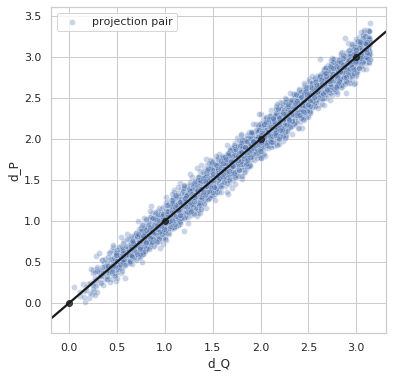

<Figure size 432x288 with 0 Axes>

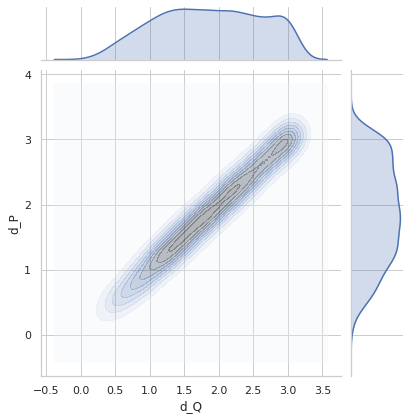

In [39]:
plot_dP_dQ(dP_values, dQ_values);
plot_dP_dQ_density(dP_values, dQ_values);

## Angle Recovery

Perfect distances. Learning rate 0.01

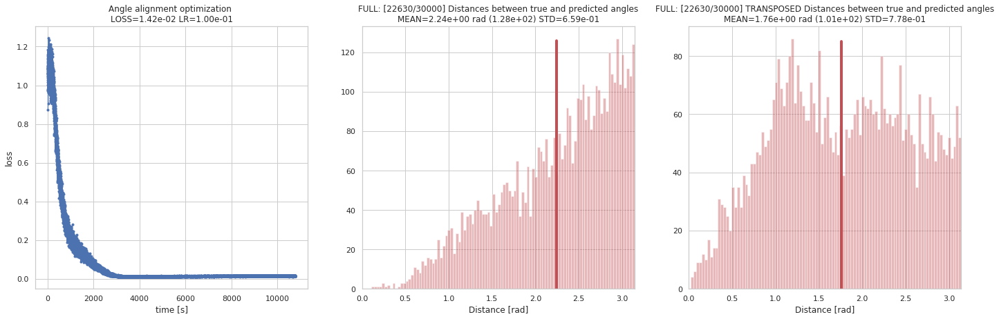

step 3000/30000 (1470s): loss = 1.29e-01
step 6000/30000 (2885s): loss = 1.48e-02
step 9000/30000 (4300s): loss = 1.09e-02
step 12000/30000 (5718s): loss = 1.30e-02
step 15000/30000 (7146s): loss = 1.54e-02
step 18000/30000 (8563s): loss = 1.42e-02
step 21000/30000 (9988s): loss = 1.29e-02



In [34]:
q_predicted = train_angle_recovery(steps=30000, 
                                 batch_size=512, 
                                 projection_idx=range(NUM_PROJECTIONS), 
                                 in_data=angles_true, 
                                 distance_fn=d_p, 
                                 learning_rate=0.1, 
                                 optimization=True)

In [35]:
q_save = np.zeros((len(q_predicted),4))
for i, q in enumerate(q_predicted):
    q_save[i] = q.numpy()
                    
np.save("data/5j0n/predicted_quaternions_var0.1.npy", q_save)

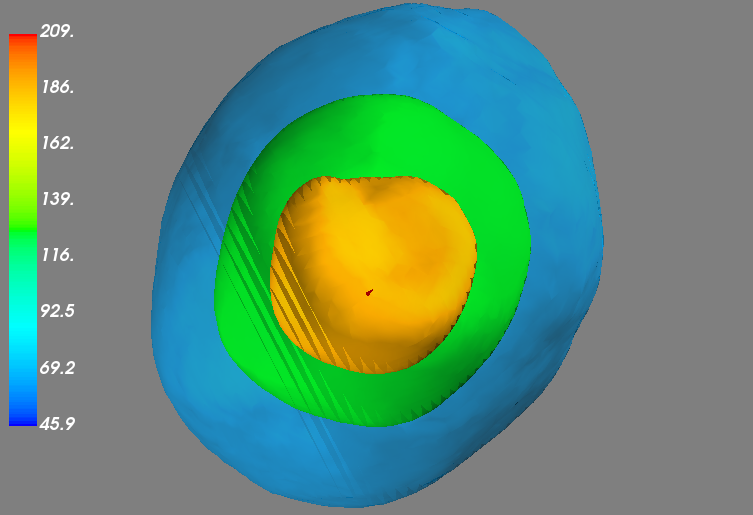

In [8]:
Image(filename='../3-reconstruction/data/5j0n_projections_and_angles_predicted_var01.png')

## Angle Alignment

In [43]:
qp = np.load("data/5j0n/predicted_quaternions_var0.1.npy")

transposed = True
ap = quaternion2euler(qp, transposed=transposed)

np.save("data/5j0n/predicted_angles_var01.npy", ap)

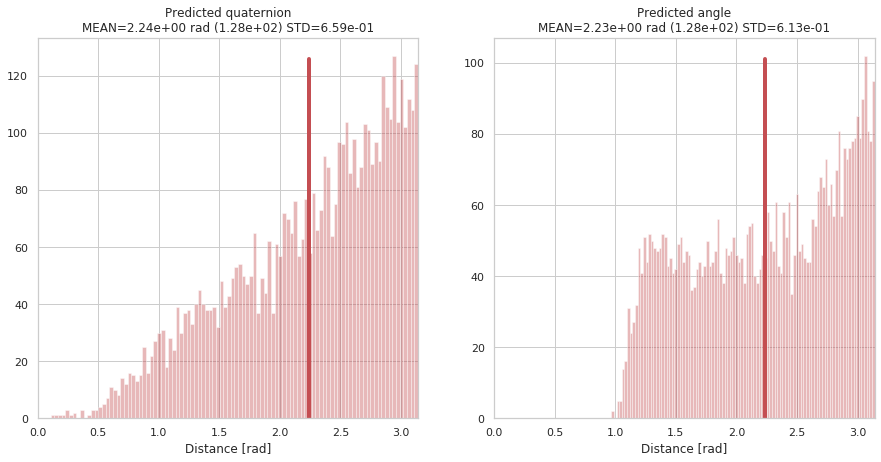

In [44]:
# check: both plots should be the same (if transposed=False)
fig, axs = plt.subplots(1, 2, figsize=(15,7))
d2 = d_q(euler2quaternion(angles_true), qp)
axs[0].set_xlim(0, np.pi)
axs[0].set_title(f"Predicted quaternion\nMEAN={np.mean(d2):.2e} rad ({np.degrees(np.mean(d2)):.2e}) STD={np.std(d2):.2e}")
s = sns.distplot(d2, kde=False, bins=100, ax=axs[0], axlabel="Distance [rad]", color="r")
max_count = int(max([h.get_height() for h in s.patches]))
axs[0].plot([np.mean(d2)]*max_count, np.arange(0, max_count,1), c="r", lw=4)

d3 = d_q(euler2quaternion(angles_true), euler2quaternion(ap))
axs[1].set_xlim(0, np.pi)
axs[1].set_title(f"Predicted angle\nMEAN={np.mean(d3):.2e} rad ({np.degrees(np.mean(d3)):.2e}) STD={np.std(d3):.2e}")
s = sns.distplot(d3, kde=False, bins=100, ax=axs[1], axlabel="Distance [rad]", color="r")
max_count = int(max([h.get_height() for h in s.patches]))
axs[1].plot([np.mean(d3)]*max_count, np.arange(0, max_count,1), c="r", lw=4)

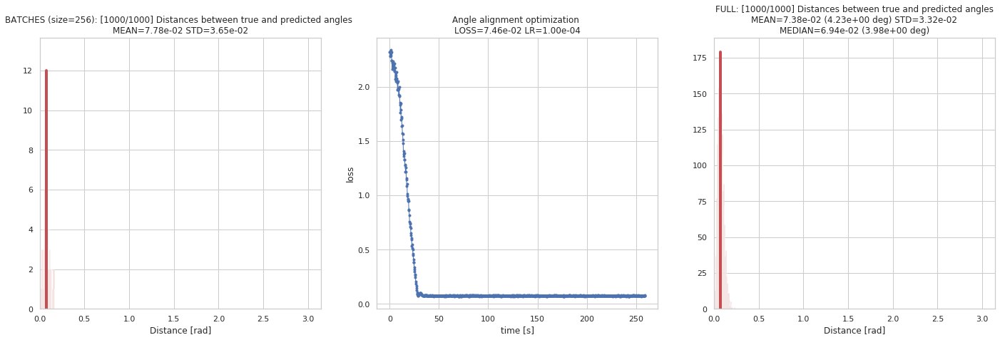

step 100/1000 (25s): loss = 1.49e+00
step 200/1000 (51s): loss = 8.61e-02
step 300/1000 (75s): loss = 7.44e-02
step 400/1000 (101s): loss = 7.45e-02
step 500/1000 (128s): loss = 7.42e-02
step 600/1000 (154s): loss = 7.42e-02
step 700/1000 (181s): loss = 7.37e-02
step 800/1000 (207s): loss = 7.43e-02
step 900/1000 (233s): loss = 7.45e-02
step 1000/1000 (261s): loss = 7.40e-02



In [46]:
m, rotation, loss = training_angle_alignment(m=[1.0, 1.0, 1.0, 1.0],
                                             steps=1000, 
                                             batch_size=256, 
                                             projection_idx=range(NUM_PROJECTIONS), 
                                             learning_rate=0.01, 
                                             angles_true=angles_true, 
                                             angles_predicted=ap)

In [47]:
m, rotation[0].numpy(), loss

([1.0, 1.0, 1.0, 1.0],
 array([ 5.64145617,  3.60607415, -0.56235796,  4.44028078,  0.52430323,
         3.35706524]),
 0.07400005841529764)

In [48]:
qpn = euler2quaternion(ap)

qpa = update_quaternion(m=m, 
                        a_R=rotation, 
                        q_predicted=qpn)

angles_predicted = quaternion2euler(qpa).numpy()

np.save("data/5j0n/predicted_angles_var01_updated.npy", angles_predicted)

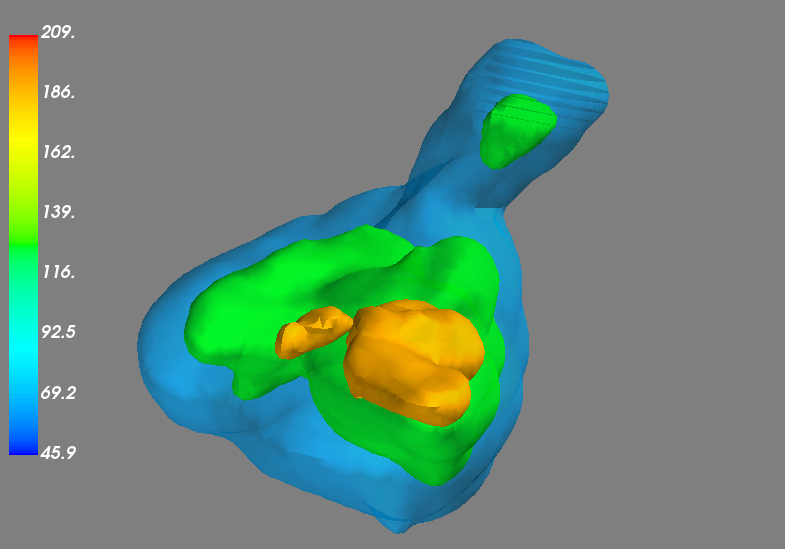

In [9]:
Image(filename='../3-reconstruction/data/5j0n_projections_and_angles_predicted_var01_updated.png')

---

## 2.3.3. Angle Recovery: Variance 0.2

#### dP/dQ plot

In [49]:
def d_p(in1, in2):
    dist = d_q(in1, in2)
    norm_distr = tf.random.normal(shape=dist.shape, mean=dist, stddev=0.2, dtype=tf.float64)
    return norm_distr  

In [50]:
idx1 = list(np.random.choice(range(NUM_PROJECTIONS), size=5000))
idx2 = list(np.random.choice(range(NUM_PROJECTIONS), size=5000))

q1_true = euler2quaternion([angles_true[i] for i in idx1])
q2_true = euler2quaternion([angles_true[i] for i in idx2])

dP_values = d_p(q1_true, q2_true)
dQ_values = d_q(q1_true, q2_true)

<Figure size 432x288 with 0 Axes>

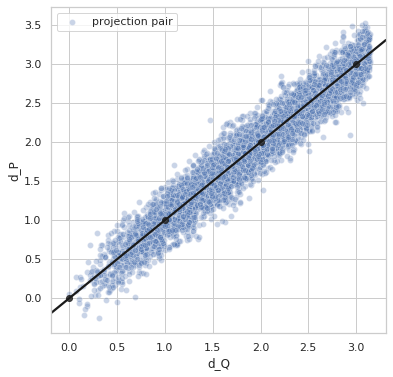

<Figure size 432x288 with 0 Axes>

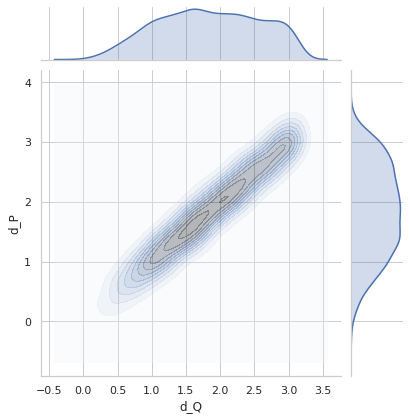

In [51]:
plot_dP_dQ(dP_values, dQ_values);
plot_dP_dQ_density(dP_values, dQ_values);

In [39]:
np.sqrt(1/(len(dQ_values)-1)*np.sum(np.power(dP_values-dQ_values, 2)))

0.20156869206807485

#### Angle Recovery

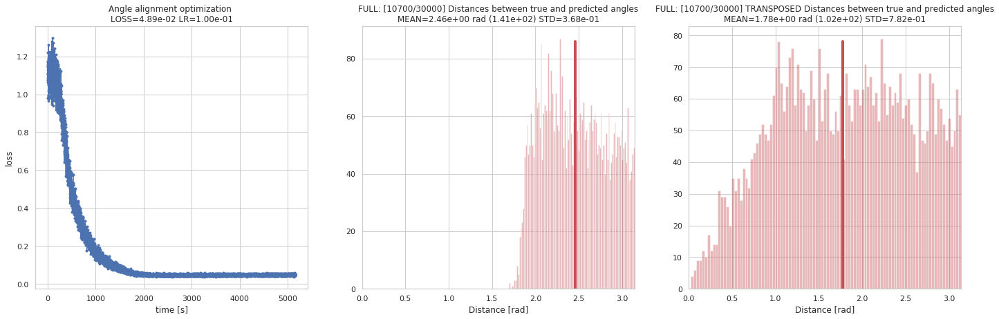

step 3000/30000 (1497s): loss = 8.13e-02
step 6000/30000 (2921s): loss = 4.35e-02
step 9000/30000 (4351s): loss = 4.65e-02



In [40]:
q_predicted = train_angle_recovery(steps=30000, 
                                 batch_size=512, 
                                 projection_idx=range(NUM_PROJECTIONS), 
                                 in_data=angles_true, 
                                 distance_fn=d_p, 
                                 learning_rate=0.1, 
                                 optimization=True)

In [41]:
q_save = np.zeros((len(q_predicted),4))
for i, q in enumerate(q_predicted):
    q_save[i] = q.numpy()
                    
np.save("data/5j0n/predicted_quaternions_var0.2.npy", q_save)

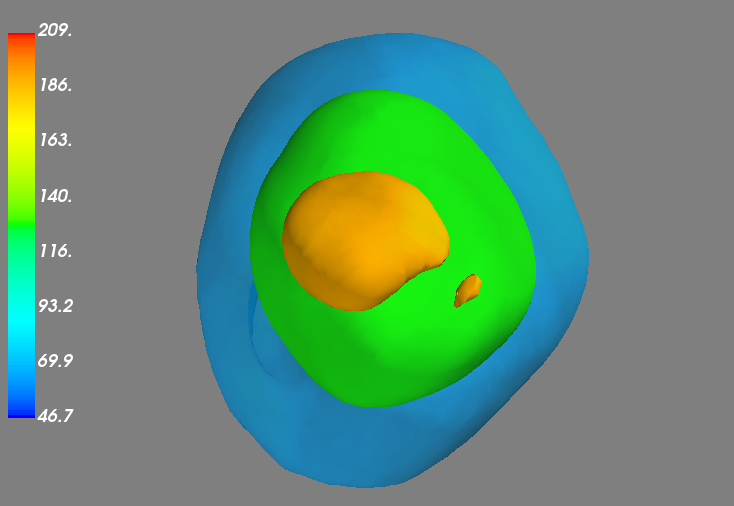

In [10]:
Image(filename='../3-reconstruction/data/5j0n_projections_and_angles_predicted_var02.png')

## Angle Alignment

In [52]:
qp = np.load("data/5j0n/predicted_quaternions_var0.2.npy")

transposed = False
ap = quaternion2euler(qp, transposed=transposed)

np.save("data/5j0n/predicted_angles_var02.npy", ap)

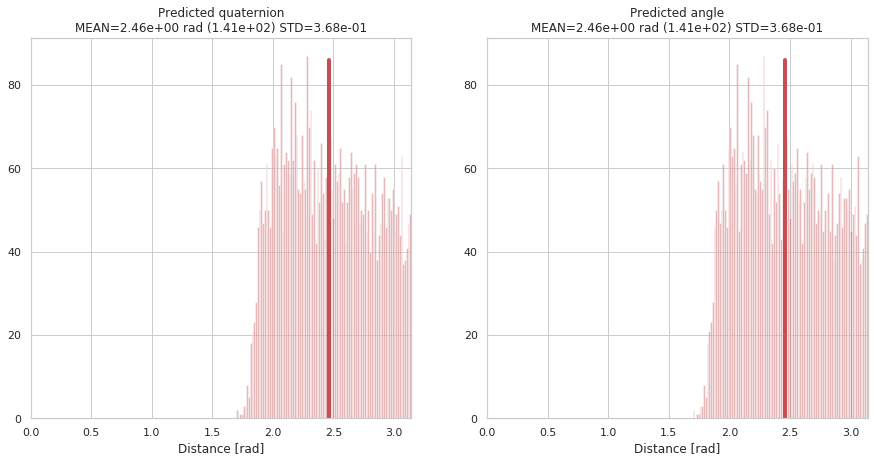

In [53]:
# check: both plots should be the same
fig, axs = plt.subplots(1, 2, figsize=(15,7))
d2 = d_q(euler2quaternion(angles_true), qp)
axs[0].set_xlim(0, np.pi)
axs[0].set_title(f"Predicted quaternion\nMEAN={np.mean(d2):.2e} rad ({np.degrees(np.mean(d2)):.2e}) STD={np.std(d2):.2e}")
s = sns.distplot(d2, kde=False, bins=100, ax=axs[0], axlabel="Distance [rad]", color="r")
max_count = int(max([h.get_height() for h in s.patches]))
axs[0].plot([np.mean(d2)]*max_count, np.arange(0, max_count,1), c="r", lw=4)

d3 = d_q(euler2quaternion(angles_true), euler2quaternion(quaternion2euler(qp)))
axs[1].set_xlim(0, np.pi)
axs[1].set_title(f"Predicted angle\nMEAN={np.mean(d3):.2e} rad ({np.degrees(np.mean(d3)):.2e}) STD={np.std(d3):.2e}")
s = sns.distplot(d3, kde=False, bins=100, ax=axs[1], axlabel="Distance [rad]", color="r")
max_count = int(max([h.get_height() for h in s.patches]))
axs[1].plot([np.mean(d3)]*max_count, np.arange(0, max_count,1), c="r", lw=4)

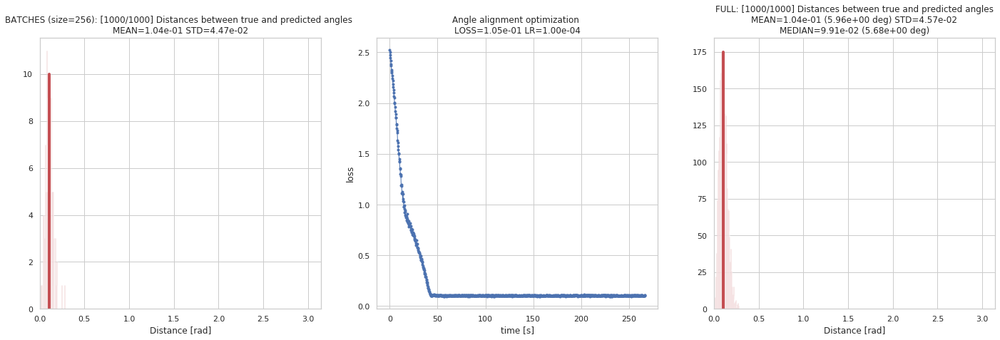

step 100/1000 (25s): loss = 1.34e+00
step 200/1000 (51s): loss = 2.80e-01
step 300/1000 (76s): loss = 1.04e-01
step 400/1000 (101s): loss = 1.04e-01
step 500/1000 (128s): loss = 1.04e-01
step 600/1000 (154s): loss = 1.04e-01
step 700/1000 (179s): loss = 1.04e-01
step 800/1000 (204s): loss = 1.04e-01
step 900/1000 (233s): loss = 1.04e-01
step 1000/1000 (269s): loss = 1.04e-01



In [54]:
m, rotation, loss = training_angle_alignment(m=[1.0, 1.0, 1.0, 1.0],
                                             steps=1000, 
                                             batch_size=256, 
                                             projection_idx=range(NUM_PROJECTIONS), 
                                             learning_rate=0.01, 
                                             angles_true=angles_true, 
                                             angles_predicted=ap)

In [55]:
m, rotation[0].numpy(), loss

([1.0, 1.0, 1.0, 1.0],
 array([1.42396684, 6.38968214, 3.18474823, 2.53373155, 5.73336356,
        4.08381966]),
 0.10395949527607624)

In [56]:
qpn = euler2quaternion(ap)

qpa = update_quaternion(m=m, 
                        a_R=rotation, 
                        q_predicted=qpn)

angles_predicted = quaternion2euler(qpa).numpy()

np.save("data/5j0n/predicted_angles_var02_updated.npy", angles_predicted)

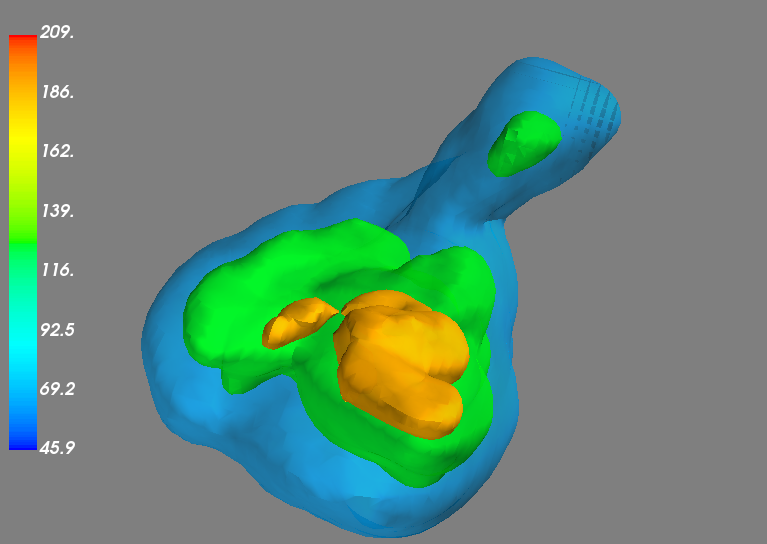

In [11]:
Image(filename='../3-reconstruction/data/5j0n_projections_and_angles_predicted_var02_updated.png')

---

## 2.3.5. Angle Recovery: Variance 0.3

#### dP/dQ plot

In [22]:
def d_p(in1, in2):
    dist = d_q(in1, in2)
    norm_distr = tf.random.normal(shape=dist.shape, mean=dist, stddev=0.3, dtype=tf.float64)
    return norm_distr  

In [23]:
idx1 = list(np.random.choice(range(NUM_PROJECTIONS), size=5000))
idx2 = list(np.random.choice(range(NUM_PROJECTIONS), size=5000))

q1_true = euler2quaternion([angles_true[i] for i in idx1])
q2_true = euler2quaternion([angles_true[i] for i in idx2])

dP_values = d_p(q1_true, q2_true)#.T[0]
dQ_values = d_q(q1_true, q2_true)#.numpy()

<Figure size 432x288 with 0 Axes>

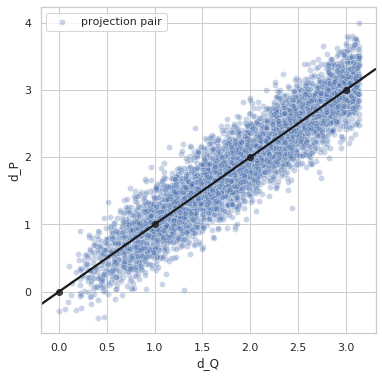

<Figure size 432x288 with 0 Axes>

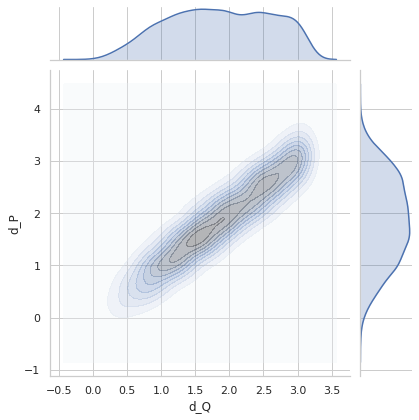

In [24]:
plot_dP_dQ(dP_values, dQ_values);
plot_dP_dQ_density(dP_values, dQ_values);

In [25]:
# variance
np.sqrt(1/(len(dQ_values)-1)*np.sum(np.power(dP_values-dQ_values, 2)))

0.3019411205607649

In [26]:
def loss(dQ_values, dP_values):
    # The mean doesn't depend on the batch size.
    return tf.reduce_mean(tf.pow((dQ_values - dP_values), 2))

In [27]:
loss(dQ_values, dP_values).numpy()

0.09115020659743324

## Angle Recovery

Perfect distances. Learning rate 0.01

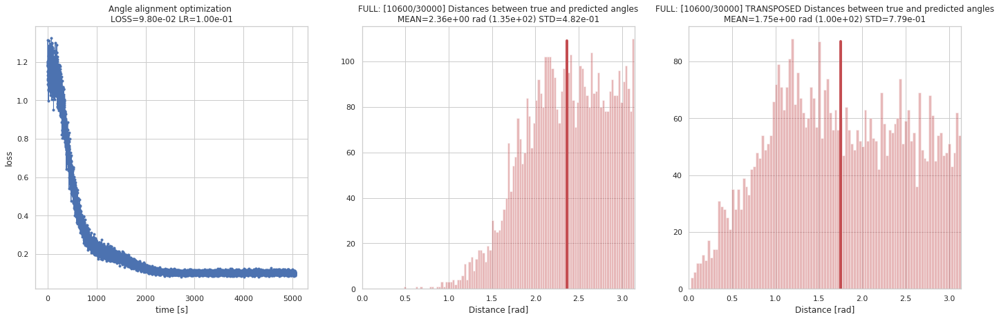

step 3000/30000 (1464s): loss = 1.77e-01
step 6000/30000 (2879s): loss = 9.96e-02
step 9000/30000 (4308s): loss = 9.74e-02



In [60]:
losses, q_predicted = train_angle_recovery(steps=30000, 
                                 batch_size=512, 
                                 projection_idx=range(NUM_PROJECTIONS), 
                                 in_data=angles_true, 
                                 distance_fn=d_p, 
                                 learning_rate=0.1, 
                                 optimization=True)

In [61]:
np.save("data/5j0n/predicted_quaternions_var0.3_losses.npy", losses)

In [62]:
q_save = np.zeros((len(q_predicted),4))
for i, q in enumerate(q_predicted):
    q_save[i] = q.numpy()
                    
np.save("data/5j0n/predicted_quaternions_var0.3.npy", q_save)

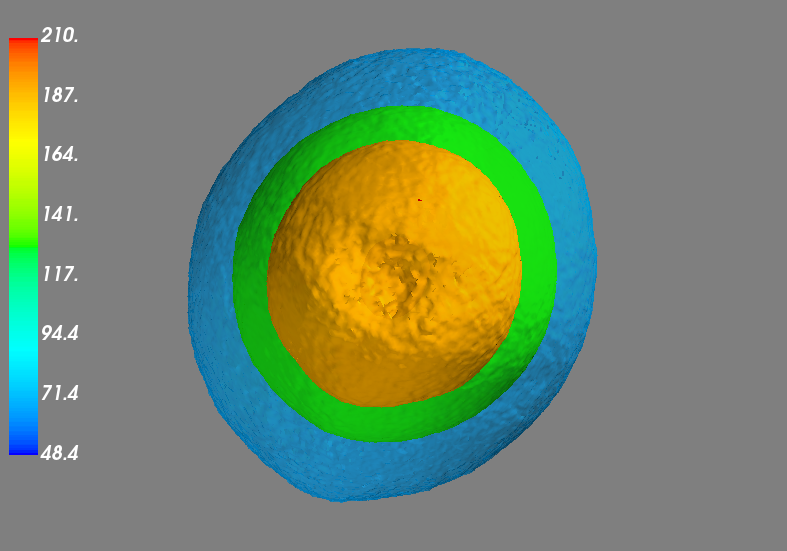

In [11]:
Image(filename='../3-reconstruction/data/5j0n_projections_and_angles_predicted_var03.png')

## Angle Alignment

In [98]:
qp = np.load("data/5j0n/predicted_quaternions_var0.3.npy")

transposed = True
ap = quaternion2euler(qp, transposed=transposed)

np.save("data/5j0n/predicted_angles_var03.npy", ap)

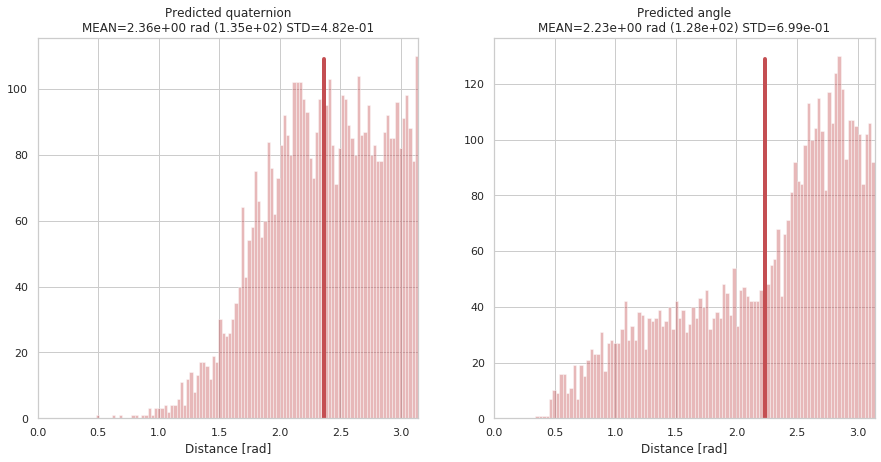

In [99]:
# check: both plots should be the same
fig, axs = plt.subplots(1, 2, figsize=(15,7))
d2 = d_q(euler2quaternion(angles_true), qp)
axs[0].set_xlim(0, np.pi)
axs[0].set_title(f"Predicted quaternion\nMEAN={np.mean(d2):.2e} rad ({np.degrees(np.mean(d2)):.2e}) STD={np.std(d2):.2e}")
s = sns.distplot(d2, kde=False, bins=100, ax=axs[0], axlabel="Distance [rad]", color="r")
max_count = int(max([h.get_height() for h in s.patches]))
axs[0].plot([np.mean(d2)]*max_count, np.arange(0, max_count,1), c="r", lw=4)

d3 = d_q(euler2quaternion(angles_true), euler2quaternion(ap))
axs[1].set_xlim(0, np.pi)
axs[1].set_title(f"Predicted angle\nMEAN={np.mean(d3):.2e} rad ({np.degrees(np.mean(d3)):.2e}) STD={np.std(d3):.2e}")
s = sns.distplot(d3, kde=False, bins=100, ax=axs[1], axlabel="Distance [rad]", color="r")
max_count = int(max([h.get_height() for h in s.patches]))
axs[1].plot([np.mean(d3)]*max_count, np.arange(0, max_count,1), c="r", lw=4)

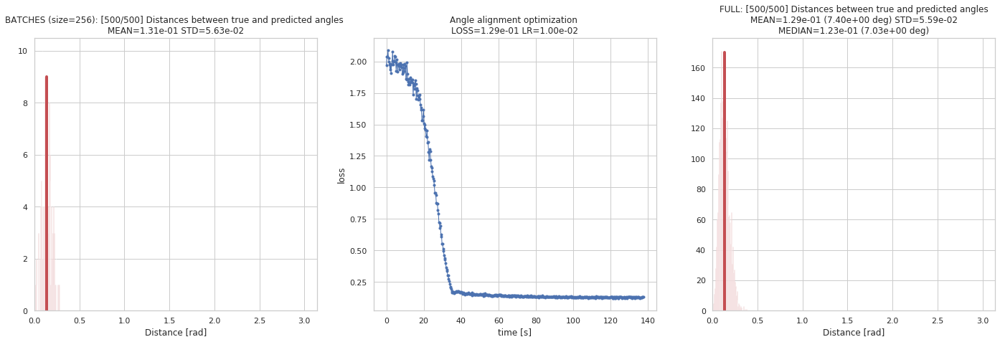

step 50/500 (14s): loss = 1.95e+00
step 100/500 (27s): loss = 1.45e+00
step 150/500 (42s): loss = 3.32e-01
step 200/500 (55s): loss = 1.52e-01
step 250/500 (69s): loss = 1.42e-01
step 300/500 (83s): loss = 1.36e-01
step 350/500 (96s): loss = 1.32e-01
step 400/500 (111s): loss = 1.30e-01
step 450/500 (125s): loss = 1.29e-01
step 500/500 (139s): loss = 1.28e-01



In [100]:
m, rotation, loss = training_angle_alignment(m=[1.0, 1.0, 1.0, 1.0],
                                             steps=500, 
                                             batch_size=256, 
                                             projection_idx=range(NUM_PROJECTIONS), 
                                             learning_rate=0.01, 
                                             angles_true=angles_true, 
                                             angles_predicted=ap)

In [101]:
m, rotation[0].numpy(), loss

([1.0, 1.0, 1.0, 1.0],
 array([ 1.84646425,  4.54768611, -0.5387023 ,  7.21127706,  6.2348436 ,
        -1.42076106]),
 0.12827524011471683)

In [102]:
qpn = euler2quaternion(ap)

qpa = update_quaternion(m=m, 
                        a_R=rotation, 
                        q_predicted=qpn)

angles_predicted = quaternion2euler(qpa).numpy()

np.save("data/5j0n/predicted_angles_var03_updated.npy", angles_predicted)

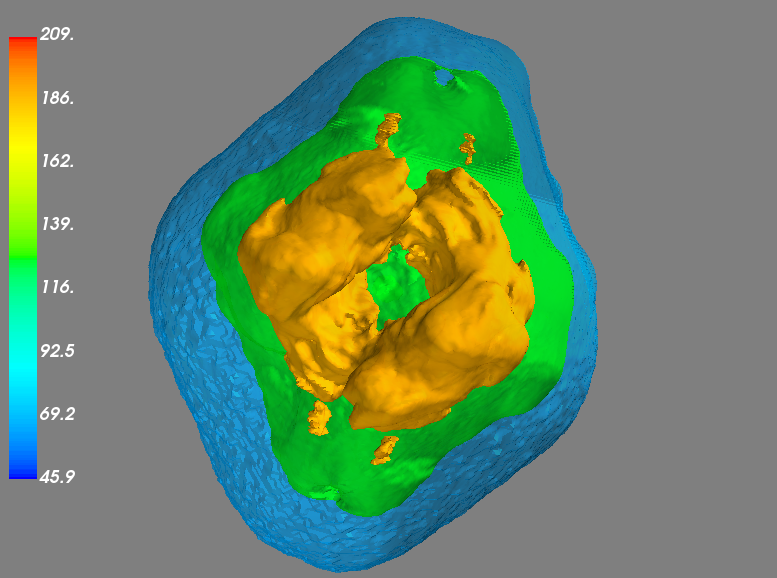

In [12]:
Image(filename='../3-reconstruction/data/5j0n_projections_and_angles_predicted_var03_updated.png')

---

# START HERE

---

## 2.3.6. Angle Recovery: Variance 0.4

#### dP/dQ plot

In [63]:
def d_p(in1, in2):
    dist = d_q(in1, in2)
    norm_distr = tf.random.normal(shape=dist.shape, mean=dist, stddev=0.4, dtype=tf.float64)
    return norm_distr  

In [64]:
idx1 = list(np.random.choice(range(NUM_PROJECTIONS), size=5000))
idx2 = list(np.random.choice(range(NUM_PROJECTIONS), size=5000))

q1_true = euler2quaternion([angles_true[i] for i in idx1])
q2_true = euler2quaternion([angles_true[i] for i in idx2])

dP_values = d_p(q1_true, q2_true)#.T[0]
dQ_values = d_q(q1_true, q2_true)#.numpy()

<Figure size 432x288 with 0 Axes>

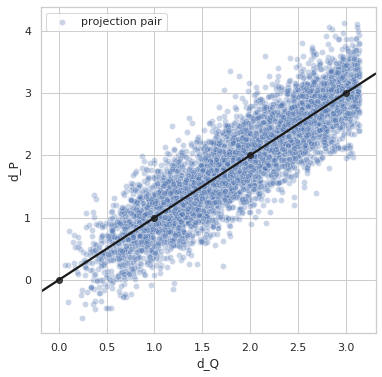

<Figure size 432x288 with 0 Axes>

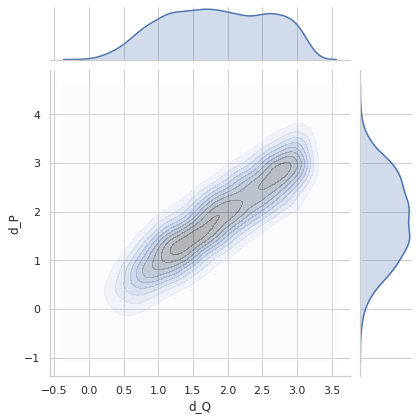

In [65]:
plot_dP_dQ(dP_values, dQ_values);
plot_dP_dQ_density(dP_values, dQ_values);

## Angle Recovery

Perfect distances. Learning rate 0.01

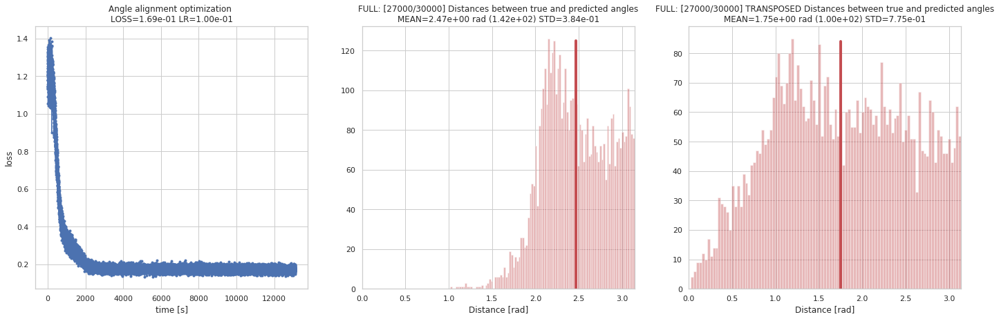

step 3000/30000 (1478s): loss = 2.80e-01
step 6000/30000 (2914s): loss = 1.73e-01
step 9000/30000 (4366s): loss = 1.64e-01
step 12000/30000 (5828s): loss = 1.79e-01
step 15000/30000 (7290s): loss = 1.89e-01
step 18000/30000 (8737s): loss = 1.65e-01
step 21000/30000 (10185s): loss = 1.64e-01
step 24000/30000 (11646s): loss = 1.69e-01



In [66]:
losses, q_predicted = train_angle_recovery(steps=30000, 
                                 batch_size=512, 
                                 projection_idx=range(NUM_PROJECTIONS), 
                                 in_data=angles_true, 
                                 distance_fn=d_p, 
                                 learning_rate=0.1, 
                                 optimization=True)

In [67]:
np.save("data/5j0n/predicted_quaternions_var0.4_losses.npy", losses)

In [68]:
q_save = np.zeros((len(q_predicted),4))
for i, q in enumerate(q_predicted):
    q_save[i] = q.numpy()
                    
np.save("data/5j0n/predicted_quaternions_var0.4.npy", q_save)

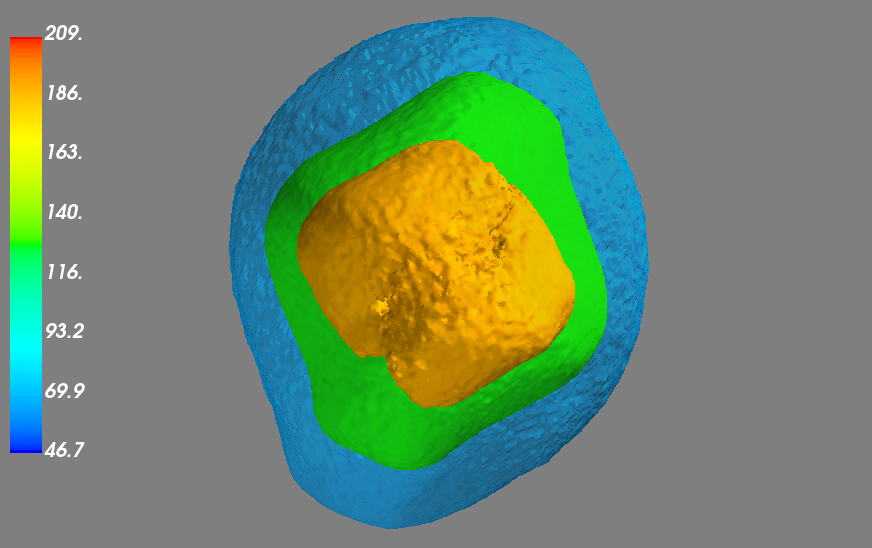

In [109]:
Image(filename='../3-reconstruction/data/5j0n_projections_and_angles_predicted_var04.png')

## Angle Alignment

In [103]:
qp = np.load("data/5j0n/predicted_quaternions_var0.4.npy")

transposed = True
ap = quaternion2euler(qp, transposed=transposed)

np.save("data/5j0n/predicted_angles_var04.npy", ap)

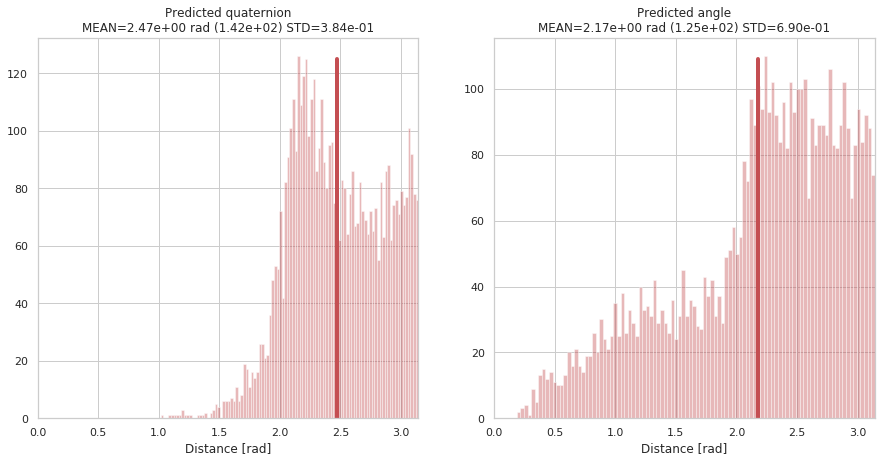

In [104]:
# check: both plots should be the same
fig, axs = plt.subplots(1, 2, figsize=(15,7))
d2 = d_q(euler2quaternion(angles_true), qp)
axs[0].set_xlim(0, np.pi)
axs[0].set_title(f"Predicted quaternion\nMEAN={np.mean(d2):.2e} rad ({np.degrees(np.mean(d2)):.2e}) STD={np.std(d2):.2e}")
s = sns.distplot(d2, kde=False, bins=100, ax=axs[0], axlabel="Distance [rad]", color="r")
max_count = int(max([h.get_height() for h in s.patches]))
axs[0].plot([np.mean(d2)]*max_count, np.arange(0, max_count,1), c="r", lw=4)

d3 = d_q(euler2quaternion(angles_true), euler2quaternion(ap))
axs[1].set_xlim(0, np.pi)
axs[1].set_title(f"Predicted angle\nMEAN={np.mean(d3):.2e} rad ({np.degrees(np.mean(d3)):.2e}) STD={np.std(d3):.2e}")
s = sns.distplot(d3, kde=False, bins=100, ax=axs[1], axlabel="Distance [rad]", color="r")
max_count = int(max([h.get_height() for h in s.patches]))
axs[1].plot([np.mean(d3)]*max_count, np.arange(0, max_count,1), c="r", lw=4)

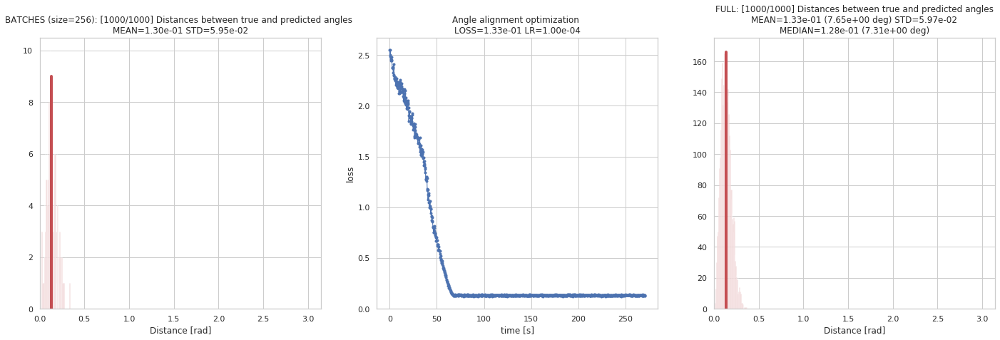

step 100/1000 (29s): loss = 2.12e+00
step 200/1000 (56s): loss = 1.16e+00
step 300/1000 (83s): loss = 2.12e-01
step 400/1000 (110s): loss = 1.32e-01
step 500/1000 (137s): loss = 1.33e-01
step 600/1000 (164s): loss = 1.33e-01
step 700/1000 (191s): loss = 1.33e-01
step 800/1000 (219s): loss = 1.33e-01
step 900/1000 (246s): loss = 1.33e-01
step 1000/1000 (273s): loss = 1.33e-01



In [105]:
m, rotation, loss = training_angle_alignment(m=[1.0, 1.0, 1.0, 1.0],
                                             steps=1000, 
                                             batch_size=256, 
                                             projection_idx=range(NUM_PROJECTIONS), 
                                             learning_rate=0.01, 
                                             angles_true=angles_true, 
                                             angles_predicted=ap)

In [106]:
m, rotation[0].numpy(), loss

([1.0, 1.0, 1.0, 1.0],
 array([-1.28978851,  2.54600848,  3.28038354,  2.20953443,  6.82499048,
         1.55135632]),
 0.13343822429238586)

In [107]:
qpn = euler2quaternion(ap)

qpa = update_quaternion(m=m, 
                        a_R=rotation, 
                        q_predicted=qpn)

angles_predicted = quaternion2euler(qpa).numpy()

np.save("data/5j0n/predicted_angles_var04_updated.npy", angles_predicted)

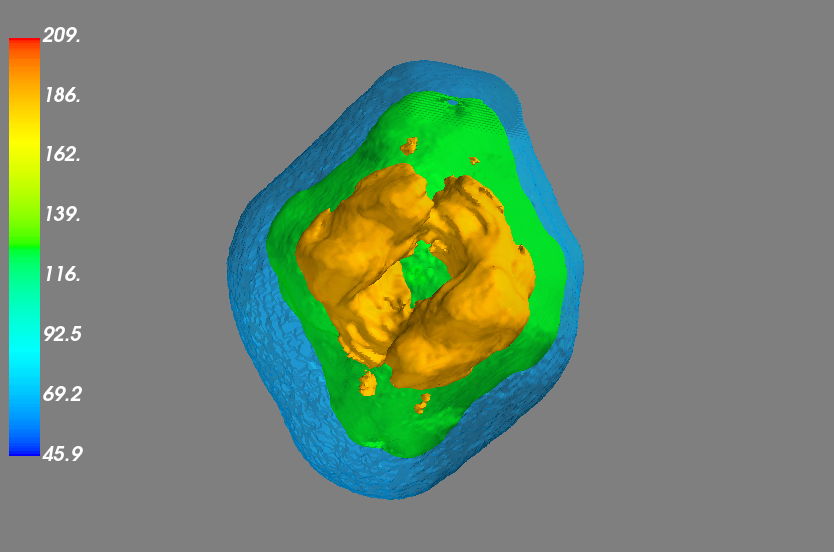

In [110]:
Image(filename='../3-reconstruction/data/5j0n_projections_and_angles_predicted_var04_updated.png')

---

## 2.3.7. Angle Recovery: Variance 0.5

#### dP/dQ plot

In [6]:
def d_p(in1, in2):
    dist = d_q(in1, in2)
    norm_distr = tf.random.normal(shape=dist.shape, mean=dist, stddev=0.5, dtype=tf.float64)
    return norm_distr  

In [7]:
idx1 = list(np.random.choice(range(NUM_PROJECTIONS), size=5000))
idx2 = list(np.random.choice(range(NUM_PROJECTIONS), size=5000))

q1_true = euler2quaternion([angles_true[i] for i in idx1])
q2_true = euler2quaternion([angles_true[i] for i in idx2])

dP_values = d_p(q1_true, q2_true)
dQ_values = d_q(q1_true, q2_true)

<Figure size 432x288 with 0 Axes>

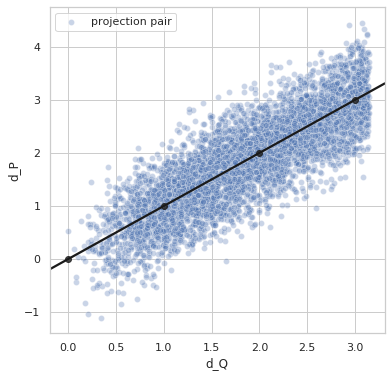

<Figure size 432x288 with 0 Axes>

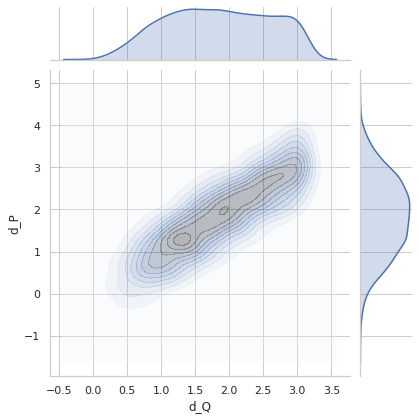

In [8]:
plot_dP_dQ(dP_values, dQ_values);
plot_dP_dQ_density(dP_values, dQ_values);

## Angle Recovery

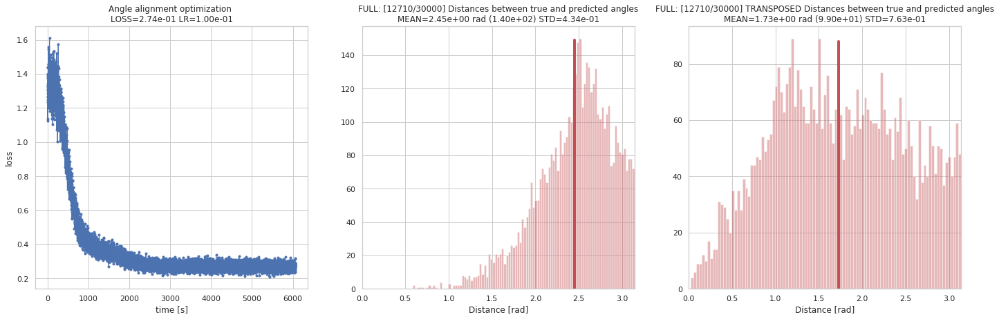

step 3000/30000 (1456s): loss = 3.58e-01
step 6000/30000 (2878s): loss = 3.14e-01
step 9000/30000 (4305s): loss = 2.49e-01
step 12000/30000 (5730s): loss = 2.68e-01



In [200]:
q_predicted = train_angle_recovery(steps=30000, 
                                 batch_size=512, 
                                 projection_idx=range(NUM_PROJECTIONS), 
                                 in_data=angles_true, 
                                 distance_fn=d_p, 
                                 learning_rate=0.1, 
                                 optimization=True)

In [201]:
q_save = np.zeros((len(q_predicted),4))
for i, q in enumerate(q_predicted):
    q_save[i] = q.numpy()
                    
np.save("data/5j0n/predicted_quaternions_var0.5.npy", q_save)

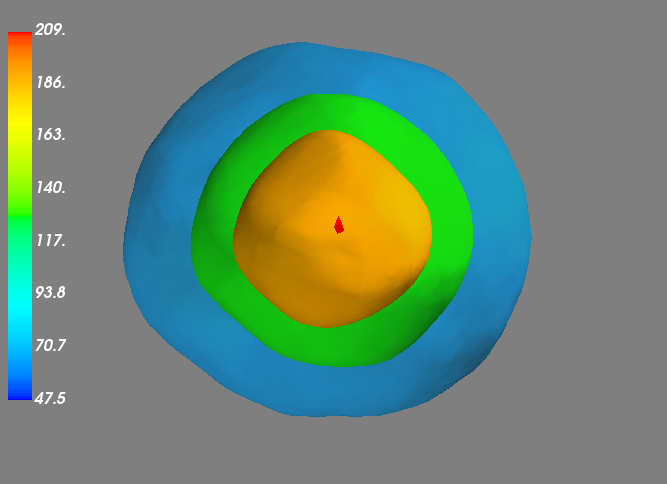

In [12]:
Image(filename='../3-reconstruction/data/5j0n_projections_and_angles_predicted_var05.png')

## Angle Alignment

In [9]:
qp = np.load("data/5j0n/predicted_quaternions_var0.5.npy")

transposed = True
ap = quaternion2euler(qp, transposed=transposed)

np.save("data/5j0n/predicted_angles_var05.npy", ap)

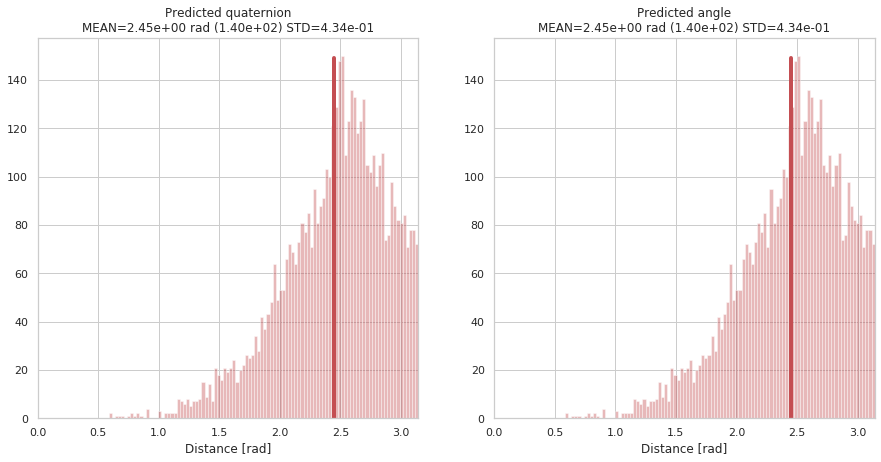

In [10]:
# check: both plots should be the same
fig, axs = plt.subplots(1, 2, figsize=(15,7))
d2 = d_q(euler2quaternion(angles_true), qp)
axs[0].set_xlim(0, np.pi)
axs[0].set_title(f"Predicted quaternion\nMEAN={np.mean(d2):.2e} rad ({np.degrees(np.mean(d2)):.2e}) STD={np.std(d2):.2e}")
s = sns.distplot(d2, kde=False, bins=100, ax=axs[0], axlabel="Distance [rad]", color="r")
max_count = int(max([h.get_height() for h in s.patches]))
axs[0].plot([np.mean(d2)]*max_count, np.arange(0, max_count,1), c="r", lw=4)

d3 = d_q(euler2quaternion(angles_true), euler2quaternion(quaternion2euler(qp)))
axs[1].set_xlim(0, np.pi)
axs[1].set_title(f"Predicted angle\nMEAN={np.mean(d3):.2e} rad ({np.degrees(np.mean(d3)):.2e}) STD={np.std(d3):.2e}")
s = sns.distplot(d3, kde=False, bins=100, ax=axs[1], axlabel="Distance [rad]", color="r")
max_count = int(max([h.get_height() for h in s.patches]))
axs[1].plot([np.mean(d3)]*max_count, np.arange(0, max_count,1), c="r", lw=4)

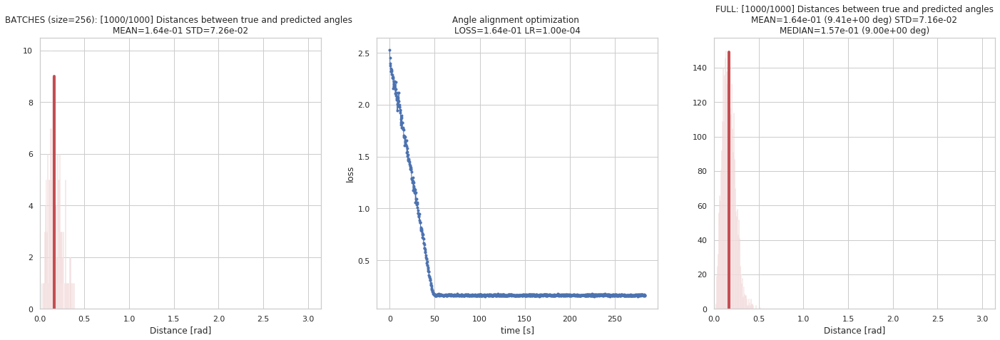

step 100/1000 (29s): loss = 1.80e+00
step 200/1000 (56s): loss = 5.07e-01
step 300/1000 (85s): loss = 1.64e-01
step 400/1000 (113s): loss = 1.64e-01
step 500/1000 (141s): loss = 1.64e-01
step 600/1000 (169s): loss = 1.64e-01
step 700/1000 (198s): loss = 1.65e-01
step 800/1000 (226s): loss = 1.64e-01
step 900/1000 (256s): loss = 1.65e-01
step 1000/1000 (286s): loss = 1.63e-01



In [15]:
m, rotation, loss = training_angle_alignment(m=[1.0, 1.0, 1.0, 1.0],
                                             steps=1000, 
                                             batch_size=256, 
                                             projection_idx=range(NUM_PROJECTIONS), 
                                             learning_rate=0.01, 
                                             angles_true=angles_true, 
                                             angles_predicted=ap)

In [16]:
m, rotation[0].numpy(), loss

([1.0, 1.0, 1.0, 1.0],
 array([5.30708855, 5.85571398, 3.03434507, 5.34461097, 0.1805543 ,
        2.13874748]),
 0.1633016560941565)

In [17]:
qpn = euler2quaternion(ap)

qpa = update_quaternion(m=m, 
                        a_R=rotation, 
                        q_predicted=qpn)

angles_predicted = quaternion2euler(qpa).numpy()

np.save("data/5j0n/predicted_angles_var05_updated.npy", angles_predicted)

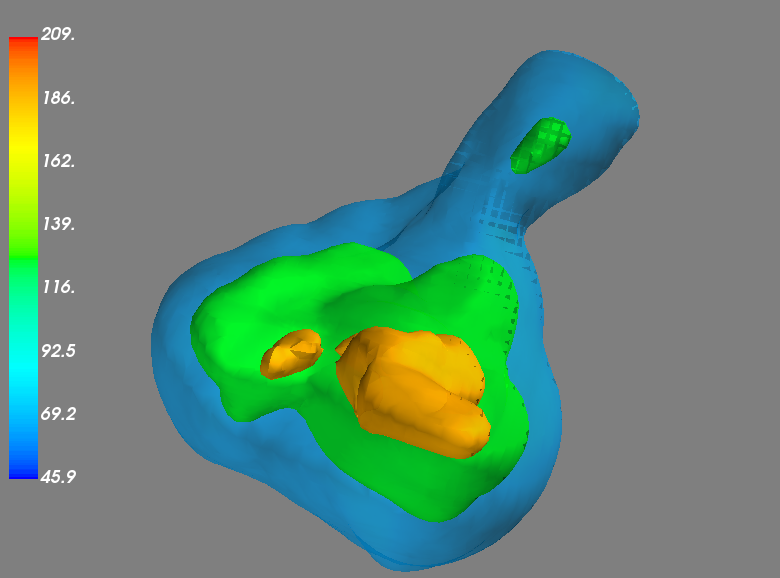

In [13]:
Image(filename='../3-reconstruction/data/5j0n_projections_and_angles_predicted_var05_updated.png')

---

## 2.3.8. Angle Recovery: Variance 0.6

#### dP/dQ plot

In [89]:
def d_p(in1, in2):
    dist = d_q(in1, in2)
    norm_distr = tf.random.normal(shape=dist.shape, mean=dist, stddev=0.6, dtype=tf.float64)
    return norm_distr  

In [90]:
idx1 = list(np.random.choice(range(NUM_PROJECTIONS), size=5000))
idx2 = list(np.random.choice(range(NUM_PROJECTIONS), size=5000))

q1_true = euler2quaternion([angles_true[i] for i in idx1])
q2_true = euler2quaternion([angles_true[i] for i in idx2])

dP_values = d_p(q1_true, q2_true)
dQ_values = d_q(q1_true, q2_true)

<Figure size 432x288 with 0 Axes>

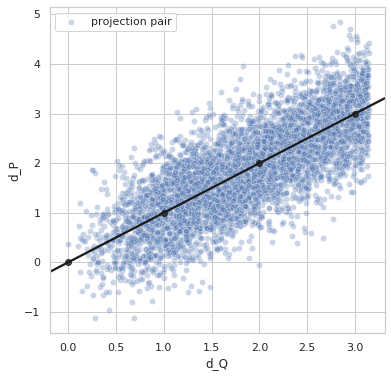

<Figure size 432x288 with 0 Axes>

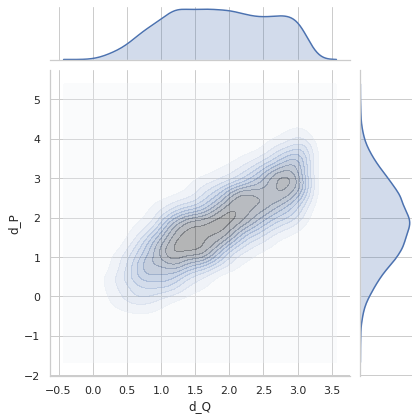

In [47]:
plot_dP_dQ(dP_values, dQ_values);
plot_dP_dQ_density(dP_values, dQ_values);

## Angle Recovery

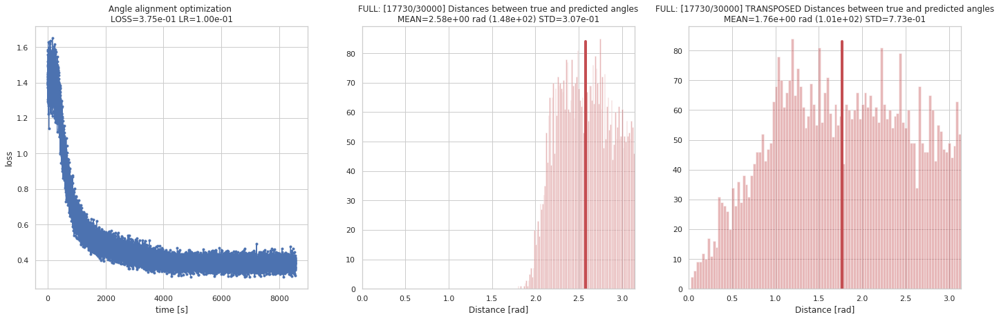

step 3000/30000 (1498s): loss = 5.84e-01
step 6000/30000 (2930s): loss = 4.47e-01
step 9000/30000 (4368s): loss = 4.02e-01
step 12000/30000 (5808s): loss = 3.79e-01
step 15000/30000 (7250s): loss = 3.66e-01



In [205]:
q_predicted = train_angle_recovery(steps=30000, 
                                 batch_size=512, 
                                 projection_idx=range(NUM_PROJECTIONS), 
                                 in_data=angles_true, 
                                 distance_fn=d_p, 
                                 learning_rate=0.1, 
                                 optimization=True)

In [206]:
q_save = np.zeros((len(q_predicted),4))
for i, q in enumerate(q_predicted):
    q_save[i] = q.numpy()
                    
np.save("data/5j0n/predicted_quaternions_var0.6.npy", q_save)

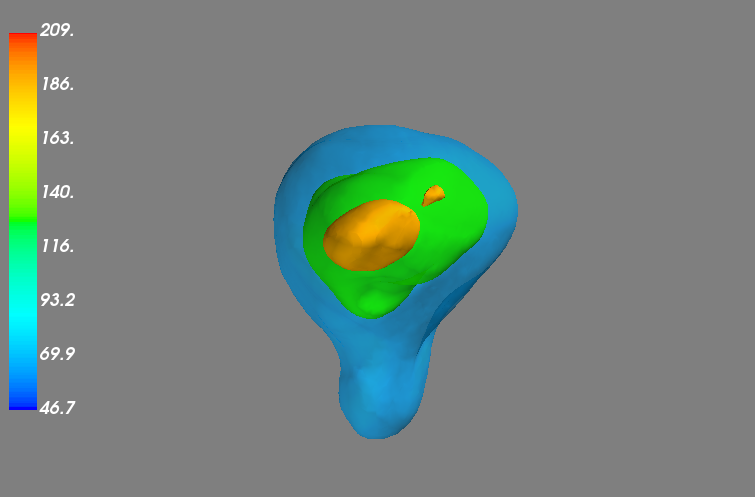

In [14]:
Image(filename='../3-reconstruction/data/5j0n_projections_and_angles_predicted_var06.png')

## Angle Recovery

In [91]:
qp = np.load("data/5j0n/predicted_quaternions_var0.6.npy")

transposed = False
ap = quaternion2euler(qp, transposed=transposed)

np.save("data/5j0n/predicted_angles_var06.npy", ap)

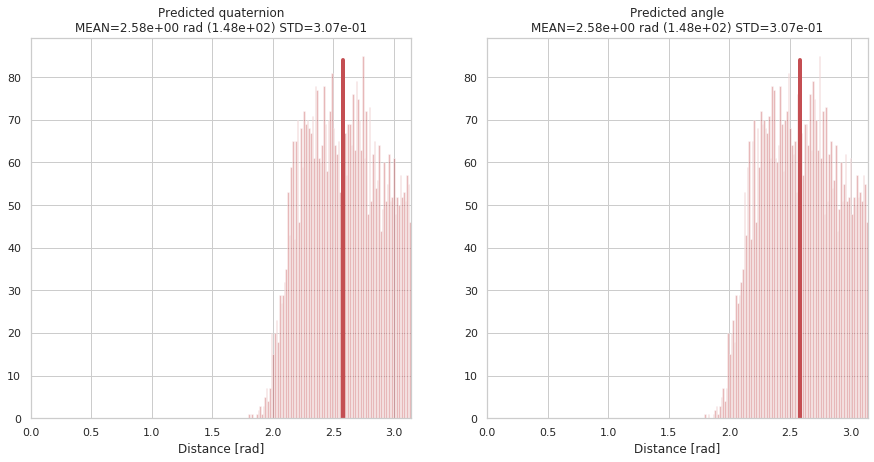

In [92]:
# check: both plots should be the same
fig, axs = plt.subplots(1, 2, figsize=(15,7))
d2 = d_q(euler2quaternion(angles_true), qp)
axs[0].set_xlim(0, np.pi)
axs[0].set_title(f"Predicted quaternion\nMEAN={np.mean(d2):.2e} rad ({np.degrees(np.mean(d2)):.2e}) STD={np.std(d2):.2e}")
s = sns.distplot(d2, kde=False, bins=100, ax=axs[0], axlabel="Distance [rad]", color="r")
max_count = int(max([h.get_height() for h in s.patches]))
axs[0].plot([np.mean(d2)]*max_count, np.arange(0, max_count,1), c="r", lw=4)

d3 = d_q(euler2quaternion(angles_true), euler2quaternion(ap))
axs[1].set_xlim(0, np.pi)
axs[1].set_title(f"Predicted angle\nMEAN={np.mean(d3):.2e} rad ({np.degrees(np.mean(d3)):.2e}) STD={np.std(d3):.2e}")
s = sns.distplot(d3, kde=False, bins=100, ax=axs[1], axlabel="Distance [rad]", color="r")
max_count = int(max([h.get_height() for h in s.patches]))
axs[1].plot([np.mean(d3)]*max_count, np.arange(0, max_count,1), c="r", lw=4)

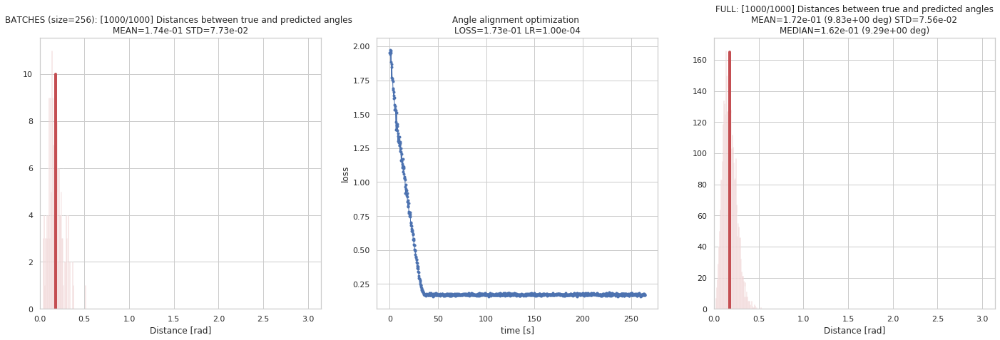

step 100/1000 (26s): loss = 1.17e+00
step 200/1000 (54s): loss = 2.17e-01
step 300/1000 (80s): loss = 1.71e-01
step 400/1000 (107s): loss = 1.72e-01
step 500/1000 (135s): loss = 1.72e-01
step 600/1000 (161s): loss = 1.71e-01
step 700/1000 (187s): loss = 1.72e-01
step 800/1000 (214s): loss = 1.73e-01
step 900/1000 (240s): loss = 1.72e-01
step 1000/1000 (266s): loss = 1.71e-01



In [93]:
m, rotation, loss = training_angle_alignment(m=[1.0, 1.0, 1.0, 1.0],
                                             steps=1000, 
                                             batch_size=256, 
                                             projection_idx=range(NUM_PROJECTIONS), 
                                             learning_rate=0.01, 
                                             angles_true=angles_true, 
                                             angles_predicted=ap)

In [94]:
m, rotation[0].numpy(), loss

([1.0, 1.0, 1.0, 1.0],
 array([4.82693744, 6.34688403, 3.31423764, 3.57301084, 0.51656654,
        1.80756785]),
 0.17131219862520602)

In [95]:
qpn = euler2quaternion(ap)

qpa = update_quaternion(m=m, 
                        a_R=rotation, 
                        q_predicted=qpn)

angles_predicted = quaternion2euler(qpa).numpy()

np.save("data/5j0n/predicted_angles_var06_updated.npy", angles_predicted)

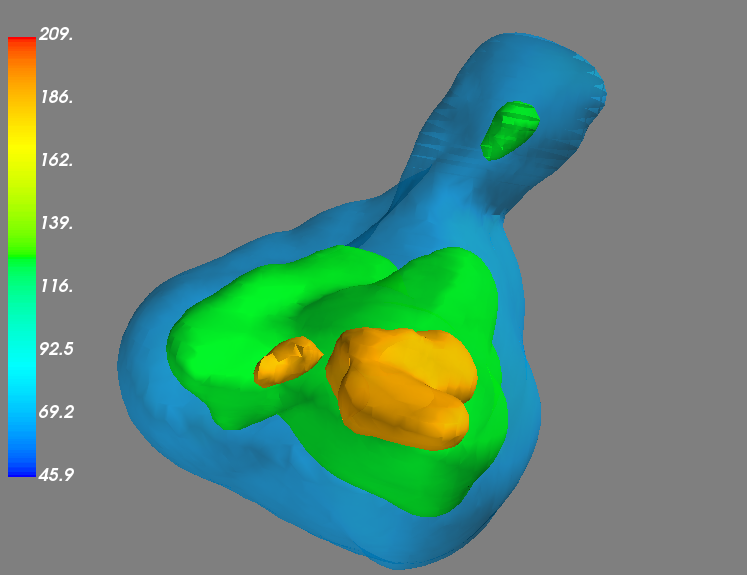

In [15]:
Image(filename='../3-reconstruction/data/5j0n_projections_and_angles_predicted_var06_updated.png')

---

## 2.3.9. Angle Recovery: Variance 0.7

#### dP/dQ plot

In [69]:
def d_p(in1, in2):
    dist = d_q(in1, in2)
    norm_distr = tf.random.normal(shape=dist.shape, mean=dist, stddev=0.7, dtype=tf.float64)
    return norm_distr  

In [70]:
idx1 = list(np.random.choice(range(NUM_PROJECTIONS), size=5000))
idx2 = list(np.random.choice(range(NUM_PROJECTIONS), size=5000))

q1_true = euler2quaternion([angles_true[i] for i in idx1])
q2_true = euler2quaternion([angles_true[i] for i in idx2])

dP_values = d_p(q1_true, q2_true)
dQ_values = d_q(q1_true, q2_true)

<Figure size 432x288 with 0 Axes>

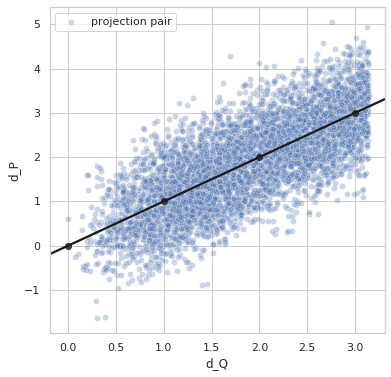

<Figure size 432x288 with 0 Axes>

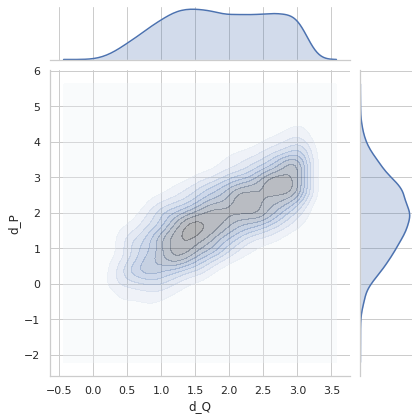

In [71]:
plot_dP_dQ(dP_values, dQ_values);
plot_dP_dQ_density(dP_values, dQ_values);

## Angle Recovery

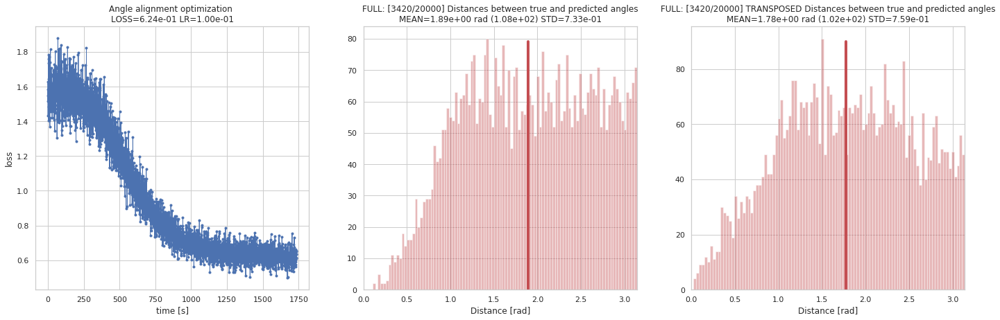

In [ ]:
losses, q_predicted = train_angle_recovery(steps=20000, 
                                 batch_size=512, 
                                 projection_idx=range(NUM_PROJECTIONS), 
                                 in_data=angles_true, 
                                 distance_fn=d_p, 
                                 learning_rate=0.1, 
                                 optimization=True)

In [ ]:
np.save("data/5j0n/predicted_quaternions_var0.7_losses.npy", losses)

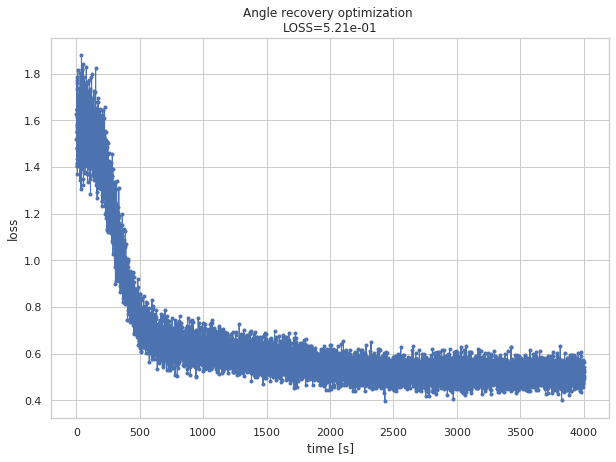

In [87]:
losses = np.load("data/5j0n/predicted_quaternions_var0.7_losses.npy")[:14000]

fig, axs = plt.subplots(figsize=(10,7))
axs.plot(np.linspace(0, 4000, len(losses)), losses, marker="o", lw=1, markersize=3)
axs.set_xlabel('time [s]')
axs.set_ylabel('loss');
axs.set_title(f"Angle recovery optimization \nLOSS={np.mean(losses[-10:]):.2e}");

In [88]:
losses[-1]

0.5278706396167177

In [ ]:
q_save = np.zeros((len(q_predicted),4))
for i, q in enumerate(q_predicted):
    q_save[i] = q.numpy()
                    
np.save("data/5j0n/predicted_quaternions_var0.7.npy", q_save)

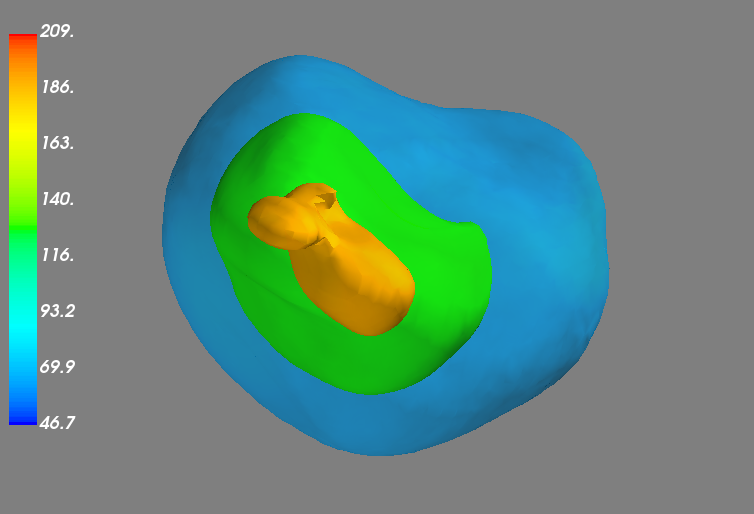

In [6]:
Image(filename='../3-reconstruction/data/5j0n_projections_and_angles_predicted_var07.png')

## Angle Alignment

In [89]:
qp = np.load("data/5j0n/predicted_quaternions_var0.7.npy")

transposed = True
ap = quaternion2euler(qp, transposed=transposed)

np.save("data/5j0n/predicted_angles_var07.npy", ap)

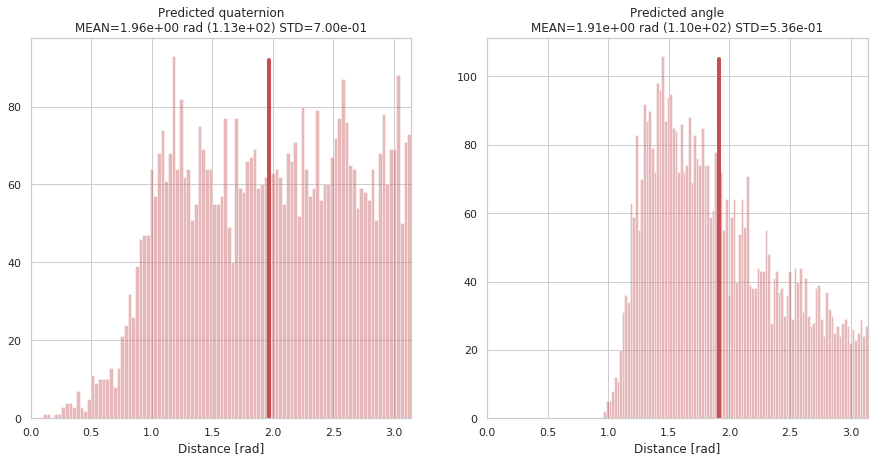

In [90]:
# check: both plots should be the same
fig, axs = plt.subplots(1, 2, figsize=(15,7))
d2 = d_q(euler2quaternion(angles_true), qp)
axs[0].set_xlim(0, np.pi)
axs[0].set_title(f"Predicted quaternion\nMEAN={np.mean(d2):.2e} rad ({np.degrees(np.mean(d2)):.2e}) STD={np.std(d2):.2e}")
s = sns.distplot(d2, kde=False, bins=100, ax=axs[0], axlabel="Distance [rad]", color="r")
max_count = int(max([h.get_height() for h in s.patches]))
axs[0].plot([np.mean(d2)]*max_count, np.arange(0, max_count,1), c="r", lw=4)

d3 = d_q(euler2quaternion(angles_true), euler2quaternion(ap))
axs[1].set_xlim(0, np.pi)
axs[1].set_title(f"Predicted angle\nMEAN={np.mean(d3):.2e} rad ({np.degrees(np.mean(d3)):.2e}) STD={np.std(d3):.2e}")
s = sns.distplot(d3, kde=False, bins=100, ax=axs[1], axlabel="Distance [rad]", color="r")
max_count = int(max([h.get_height() for h in s.patches]))
axs[1].plot([np.mean(d3)]*max_count, np.arange(0, max_count,1), c="r", lw=4)

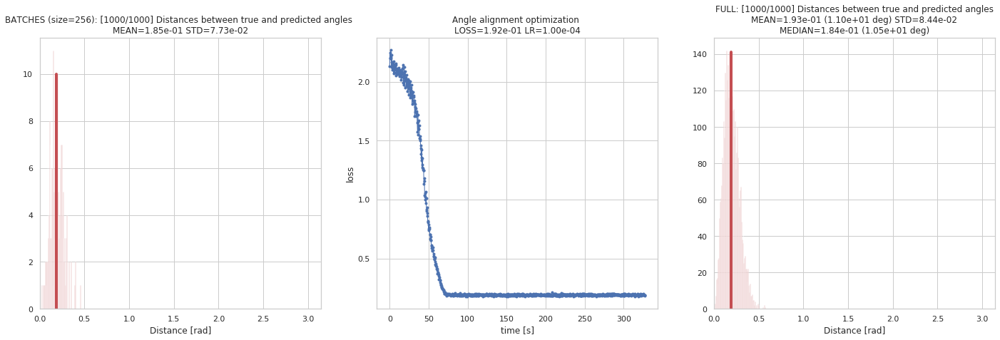

step 100/1000 (27s): loss = 2.04e+00
step 200/1000 (55s): loss = 9.48e-01
step 300/1000 (83s): loss = 2.02e-01
step 400/1000 (110s): loss = 1.93e-01
step 500/1000 (137s): loss = 1.92e-01
step 600/1000 (164s): loss = 1.93e-01
step 700/1000 (192s): loss = 1.92e-01
step 800/1000 (274s): loss = 1.93e-01
step 900/1000 (302s): loss = 1.93e-01
step 1000/1000 (329s): loss = 1.93e-01



In [91]:
m, rotation, loss = training_angle_alignment(m=[1.0, 1.0, 1.0, 1.0],
                                             steps=1000, 
                                             batch_size=256, 
                                             projection_idx=range(NUM_PROJECTIONS), 
                                             learning_rate=0.01, 
                                             angles_true=angles_true, 
                                             angles_predicted=ap)

In [92]:
m, rotation[0].numpy(), loss

([1.0, 1.0, 1.0, 1.0],
 array([ 3.08270432,  6.67009504,  3.5446155 , -0.0281506 ,  3.10968534,
         2.43871423]),
 0.19308396122413943)

In [93]:
qpn = euler2quaternion(ap)

qpa = update_quaternion(m=m, 
                        a_R=rotation, 
                        q_predicted=qpn)

angles_predicted = quaternion2euler(qpa).numpy()

np.save("data/5j0n/predicted_angles_var07_updated.npy", angles_predicted)

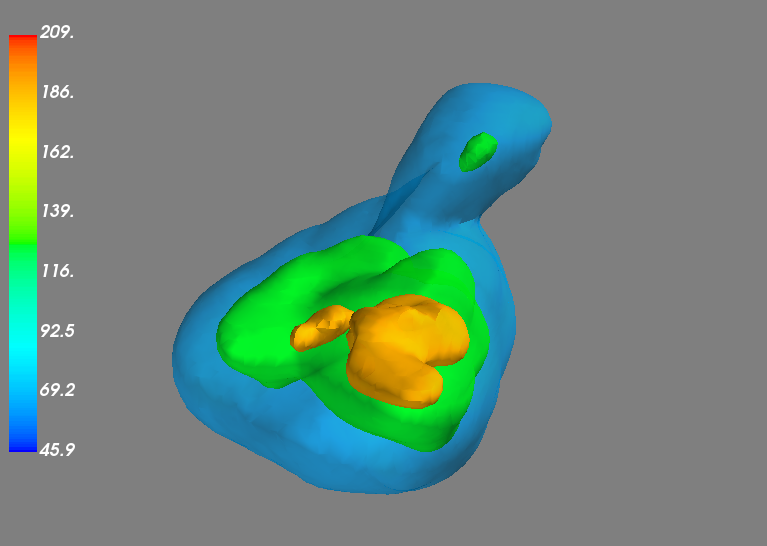

In [5]:
Image(filename='../3-reconstruction/data/5j0n_projections_and_angles_predicted_var07_updated.png')

---

## 2.3.10. Angle Recovery: Variance 0.8

#### dP/dQ plot

In [17]:
def d_p(in1, in2):
    dist = d_q(in1, in2)
    norm_distr = tf.random.normal(shape=dist.shape, mean=dist, stddev=0.8, dtype=tf.float64)
    return norm_distr  

In [18]:
idx1 = list(np.random.choice(range(NUM_PROJECTIONS), size=5000))
idx2 = list(np.random.choice(range(NUM_PROJECTIONS), size=5000))

q1_true = euler2quaternion([angles_true[i] for i in idx1])
q2_true = euler2quaternion([angles_true[i] for i in idx2])

dP_values = d_p(q1_true, q2_true)
dQ_values = d_q(q1_true, q2_true)

<Figure size 432x288 with 0 Axes>

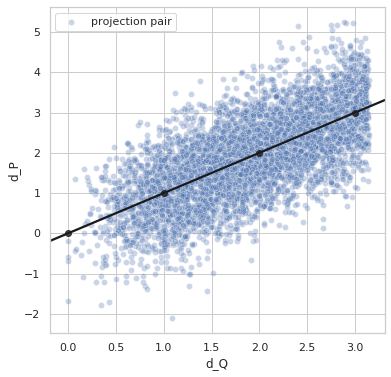

<Figure size 432x288 with 0 Axes>

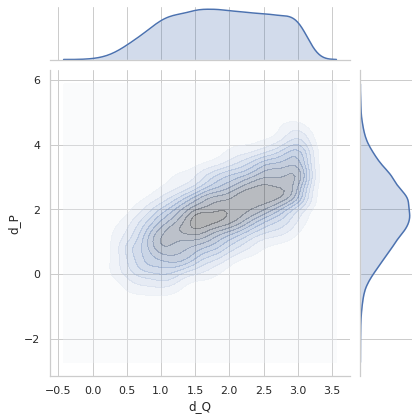

In [19]:
plot_dP_dQ(dP_values, dQ_values);
plot_dP_dQ_density(dP_values, dQ_values);

In [20]:
def loss(dQ_values, dP_values):
    # The mean doesn't depend on the batch size.
    return tf.reduce_mean(tf.pow((dQ_values - dP_values), 2))

In [21]:
loss(dQ_values, dP_values).numpy()

0.634968011721585

## Angle Recovery

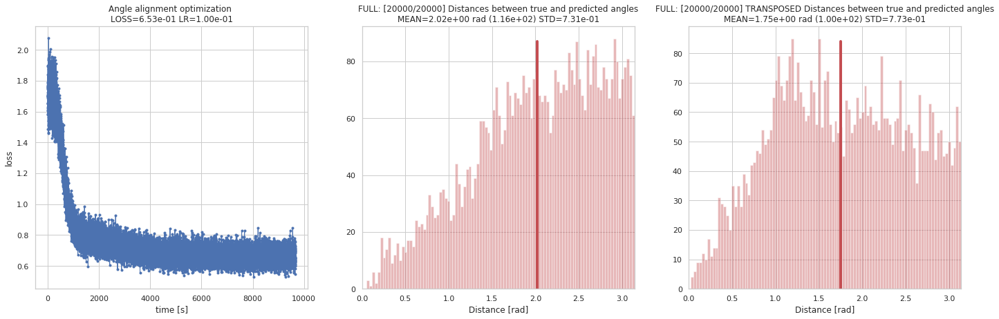

step 2000/20000 (1007s): loss = 8.44e-01
step 4000/20000 (1979s): loss = 8.16e-01
step 6000/20000 (2924s): loss = 6.93e-01
step 8000/20000 (3871s): loss = 8.01e-01
step 10000/20000 (4817s): loss = 6.63e-01
step 12000/20000 (5777s): loss = 6.66e-01
step 14000/20000 (6729s): loss = 5.81e-01
step 16000/20000 (7697s): loss = 5.92e-01
step 18000/20000 (8692s): loss = 6.95e-01
step 20000/20000 (9685s): loss = 5.46e-01



In [13]:
losses, q_predicted = train_angle_recovery(steps=20000, 
                                 batch_size=512, 
                                 projection_idx=range(NUM_PROJECTIONS), 
                                 in_data=angles_true, 
                                 distance_fn=d_p, 
                                 learning_rate=0.1, 
                                 optimization=True)

In [14]:
np.save("data/5j0n/predicted_quaternions_var0.8_losses.npy", losses)

In [17]:
# losses = np.load("data/5j0n/predicted_quaternions_var0.8_losses.npy")[:17000]

# fig, axs = plt.subplots(figsize=(10,7))
# axs.plot(np.linspace(0, 4000, len(losses)), losses, marker="o", lw=1, markersize=3)
# axs.set_xlabel('time [s]')
# axs.set_ylabel('loss');
# axs.set_title(f"Angle recovery optimization \nLOSS={np.mean(losses[-10:]):.2e}");

In [18]:
q_save = np.zeros((len(q_predicted),4))
for i, q in enumerate(q_predicted):
    q_save[i] = q.numpy()
                    
np.save("data/5j0n/predicted_quaternions_var0.8.npy", q_save)

In [16]:
# Image(filename='../3-reconstruction/data/5j0n_projections_and_angles_predicted_var08.png')

## Angle Alignment

In [19]:
qp = np.load("data/5j0n/predicted_quaternions_var0.8.npy")

transposed = False
ap = quaternion2euler(qp, transposed=transposed)

np.save("data/5j0n/predicted_angles_var08.npy", ap)

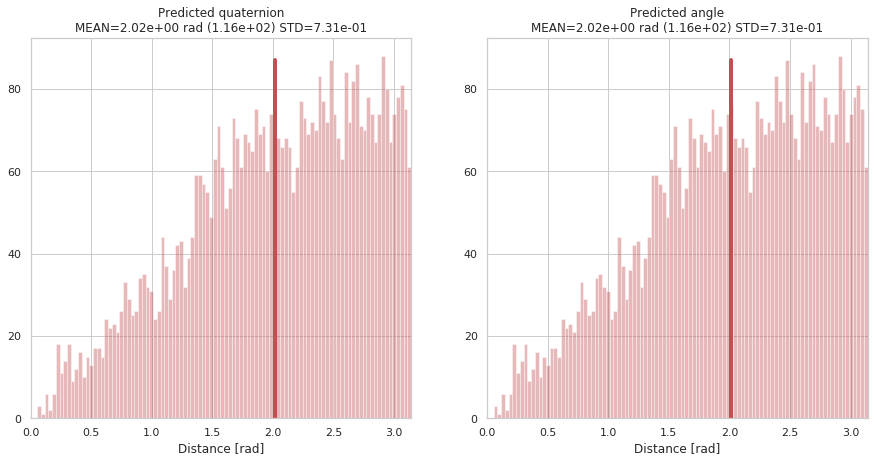

In [20]:
# check: both plots should be the same
fig, axs = plt.subplots(1, 2, figsize=(15,7))
d2 = d_q(euler2quaternion(angles_true), qp)
axs[0].set_xlim(0, np.pi)
axs[0].set_title(f"Predicted quaternion\nMEAN={np.mean(d2):.2e} rad ({np.degrees(np.mean(d2)):.2e}) STD={np.std(d2):.2e}")
s = sns.distplot(d2, kde=False, bins=100, ax=axs[0], axlabel="Distance [rad]", color="r")
max_count = int(max([h.get_height() for h in s.patches]))
axs[0].plot([np.mean(d2)]*max_count, np.arange(0, max_count,1), c="r", lw=4)

d3 = d_q(euler2quaternion(angles_true), euler2quaternion(ap))
axs[1].set_xlim(0, np.pi)
axs[1].set_title(f"Predicted angle\nMEAN={np.mean(d3):.2e} rad ({np.degrees(np.mean(d3)):.2e}) STD={np.std(d3):.2e}")
s = sns.distplot(d3, kde=False, bins=100, ax=axs[1], axlabel="Distance [rad]", color="r")
max_count = int(max([h.get_height() for h in s.patches]))
axs[1].plot([np.mean(d3)]*max_count, np.arange(0, max_count,1), c="r", lw=4)

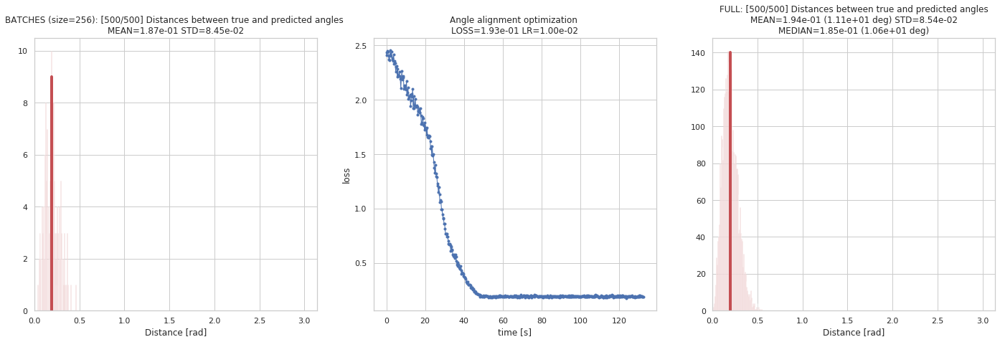

step 50/500 (13s): loss = 2.24e+00
step 100/500 (27s): loss = 1.73e+00
step 150/500 (41s): loss = 7.10e-01
step 200/500 (54s): loss = 2.50e-01
step 250/500 (68s): loss = 1.93e-01
step 300/500 (81s): loss = 1.95e-01
step 350/500 (95s): loss = 1.93e-01
step 400/500 (108s): loss = 1.94e-01
step 450/500 (121s): loss = 1.94e-01
step 500/500 (134s): loss = 1.93e-01



In [21]:
m, rotation, loss = training_angle_alignment(m=[1.0, 1.0, 1.0, 1.0],
                                             steps=500, 
                                             batch_size=256, 
                                             projection_idx=range(NUM_PROJECTIONS), 
                                             learning_rate=0.01, 
                                             angles_true=angles_true, 
                                             angles_predicted=ap)

In [24]:
m, rotation[0].numpy(), loss[-1]

([1.0, 1.0, 1.0, 1.0],
 array([ 1.78605921,  3.05272419,  3.08469727,  3.96572599, -0.38951258,
         5.70699108]),
 0.18738443356039533)

In [23]:
qpn = euler2quaternion(ap)

qpa = update_quaternion(m=m, 
                        a_R=rotation, 
                        q_predicted=qpn)

angles_predicted = quaternion2euler(qpa).numpy()

np.save("data/5j0n/predicted_angles_var08_updated.npy", angles_predicted)

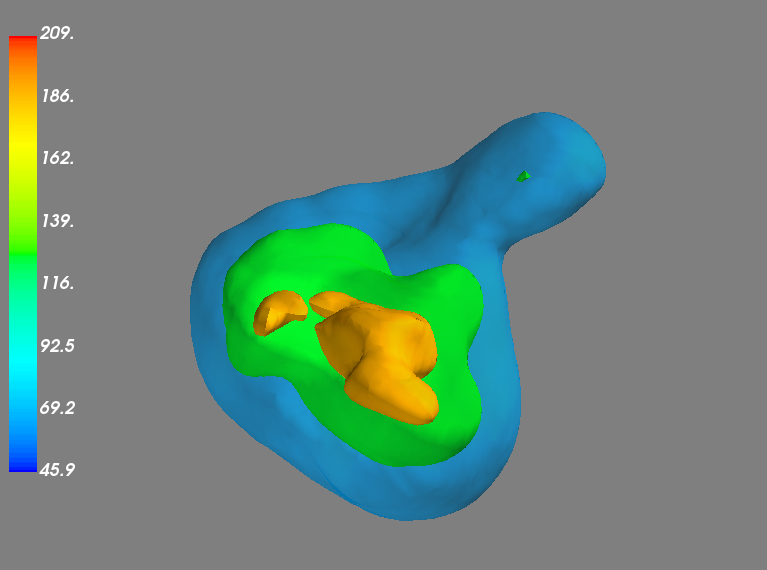

In [3]:
Image(filename='../3-reconstruction/data/5j0n_projections_and_angles_predicted_var08_updated.png')

---